In [1]:
!python3 --version

Python 3.11.4


In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

/tmp/ipykernel_2195005/3777615979.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns
import itertools
import random

In [4]:
# !git clone https://github.com/HobbitLong/SupContrast.git

In [5]:
%cd SupContrast
!ls

/home/wook/jupyter_dir/SupContrast
figures  losses.py   main_linear.py  networks	  README.md
LICENSE  main_ce.py  main_supcon.py  __pycache__  util.py


In [6]:
import argparse

parser = argparse.ArgumentParser()

parser.add_argument('--arch_d', type=int, default=1024, help='critic/discriminator architecture (MLP)') # 기존
parser.add_argument('--epochs', type=int, default=15, help='maximum number of epochs')
parser.add_argument('--batch_size', type=int, default=8, metavar='N', help='batch size') # test용으로 size 4 원래는 64
parser.add_argument('--val_batch_size', type=int, default=4, metavar='N', help='validation batch size')
parser.add_argument('--niters_ae', type=int, default=1, help='number of autoencoder iterations in training')
parser.add_argument('--niters_gan_d', type=int, default=5, help='number of discriminator iterations in training')
#parser.add_argument('--niters_gan_d', type=int, default=20, help='number of discriminator iterations in training')
parser.add_argument('--niters_gan_ae', type=int, default=1, help='number of gan-into-ae iterations in training')

parser.add_argument('--lr_ae', type=float, default=1e-03, help='autoencoder learning rate')
parser.add_argument('--lr_gan_d', type=float, default=1e-04, help='critic/discriminator learning rate')
parser.add_argument('--beta1', type=float, default=0.5, help='beta1 for adam. default=0.5')
parser.add_argument('--beta2', type=float, default=0.9, help='beta2 for adam. default=0.9')
parser.add_argument('--clip', type=float, default=1, help='gradient clipping, max norm')
parser.add_argument('--gan_clamp', type=float, default=0.01, help='WGAN clamp')
parser.add_argument('--gan_gp_lambda', type=float, default=1, help='WGAN GP penalty lambda')
parser.add_argument('--grad_lambda', type=float, default=0.1, help='WGAN into AE lambda')

parser.add_argument('--print_every', type=int, default=100, help='show metrics for train dataset')

args = parser.parse_args(args=[])

In [7]:
# pip install transformers

In [8]:
from transformers import BartTokenizer, BartForConditionalGeneration, BartConfig, BartPretrainedModel
import torch
from torch import nn
from torch.nn.functional import softmax
from losses import SupConLoss
import torch.optim as optim

In [9]:
import torch
print(torch.cuda.is_available())

True


In [10]:
tokenizer = BartTokenizer.from_pretrained('facebook/bart-large')
bart = BartForConditionalGeneration.from_pretrained('facebook/bart-large')

In [11]:
# bartgeneration ver
class Seq2Seq(nn.Module):
    def __init__(self, encoder, decoder, lm_head, bart):
        super().__init__()
        self.bart = bart
        self.encoder = encoder # encoder
        self.decoder = decoder # decoder
        self.lm_head = lm_head # lm_head
        self.register_buffer("final_logits_bias", torch.zeros((1, self.bart.model.shared.num_embeddings)))

    def getDecoder(self):
        return self.decoder

    def getEncoder(self):
        return self.encoder

    def shift_tokens_right(self, input_ids: torch.Tensor, pad_token_id: int, decoder_start_token_id: int):
        """
        Shift input ids one token to the right.
        """
        shifted_input_ids = input_ids.new_zeros(input_ids.shape)
        shifted_input_ids[:, 1:] = input_ids[:, :-1].clone()
        shifted_input_ids[:, 0] = decoder_start_token_id

        assert pad_token_id is not None, "self.model.config.pad_token_id has to be defined."
        # replace possible -100 values in labels by `pad_token_id`
        shifted_input_ids.masked_fill_(shifted_input_ids == -100, pad_token_id)

        return shifted_input_ids

    def resize_token_embeddings(self, new_num_tokens: int) -> nn.Embedding:
        new_embeddings = super().resize_token_embeddings(new_num_tokens)
        self._resize_final_logits_bias(new_num_tokens)
        return new_embeddings

    def _resize_final_logits_bias(self, new_num_tokens: int) -> None:
        old_num_tokens = self.final_logits_bias.shape[-1]
        if new_num_tokens <= old_num_tokens:
            new_bias = self.final_logits_bias[:, :new_num_tokens]
        else:
            extra_bias = torch.zeros((1, new_num_tokens - old_num_tokens), device=self.final_logits_bias.device)
            new_bias = torch.cat([self.final_logits_bias, extra_bias], dim=1)
        self.register_buffer("final_logits_bias", new_bias)

    def forward(self, input_ids, attention_mask, encode_only=False):
        enc_out = self.encoder(input_ids, attention_mask) # BaseModelOutput
        if encode_only:
            return enc_out.last_hidden_state # z: (batch_size, sequence_length, hidden_size)
            # sequence of hidden-states at the output of the last layer of the encoder.

        decoder_input_ids = self.shift_tokens_right(
                input_ids, self.bart.model.config.pad_token_id, self.bart.model.config.decoder_start_token_id)

        dec_out = self.decoder(input_ids=decoder_input_ids, encoder_hidden_states=enc_out.last_hidden_state)
        # BaseModelOutputWithPastAndCrossAttentions

        lm_logits = self.lm_head(dec_out.last_hidden_state) + self.final_logits_bias
        return lm_logits

    def decode_only(self, input_ids, encoder_hidden_states):
        decoder_input_ids = self.shift_tokens_right(
            input_ids, self.bart.model.config.pad_token_id, self.bart.model.config.decoder_start_token_id)

        dec_out = self.decoder(input_ids=decoder_input_ids, encoder_hidden_states=encoder_hidden_states)
        # BaseModelOutputWithPastAndCrossAttentions

        lm_logits = self.lm_head(dec_out.last_hidden_state) #+ self.final_logits_bias
        return lm_logits

# input_ids == decoder_input_ids로 해도 괜찮나? decoder의 input_ids는 무슨 의미임?
# encoder 단계에서 noise라는 걸 하는데, 이건뭐지?
# encoder decoder 나눠서 한 가장 큰 이유: bart를 따로 사용하면, encoder도 다른걸 사용하게 됨
# 문제사항

In [12]:
import torch
from torch import nn
from collections import OrderedDict


class Critic(nn.Module):
    def __init__(self, ninput, noutput, layer_sizes):
        super().__init__()
        layers = []

        inp_size = ninput
        for idx, layer_size in enumerate(layer_sizes):
            layer = nn.Linear(inp_size, layer_size)
            layers.append(('linear_{}'.format(idx), layer))

            if idx > 0:
                bn = nn.BatchNorm1d(layer_size, eps=1e-05, momentum=0.1)
                layers.append(('bn_{}'.format(idx), bn))

            layers.append(('activation_{}'.format(idx), nn.LeakyReLU(0.2)))
            inp_size = layer_size

        layer = nn.Linear(inp_size, noutput)
        layers.append(('linear_last', layer))

        self.layer = nn.Sequential(OrderedDict(layers))

        self.init_weights()

    def init_weights(self):
        init_std = 0.02
        for layer in self.layer:
            try:
                layer.weight.data.normal_(0, init_std)
                layer.bias.data.fill_(0)
            except:
                pass

    def forward(self, inp):
        return self.layer(inp)

In [13]:
import copy

encoder = bart.get_encoder()
decoder_src = copy.deepcopy(bart.get_decoder())
decoder_tgt = copy.deepcopy(bart.get_decoder())
lm_head_src = copy.deepcopy(bart.get_output_embeddings())
lm_head_tgt = copy.deepcopy(bart.get_output_embeddings())

In [14]:
print(id(decoder_src)==id(decoder_tgt))
print(id(bart.get_decoder())==id(bart.get_decoder()))
print(id(lm_head_src)==id(lm_head_tgt))
print(id(bart.get_output_embeddings())==id(bart.get_output_embeddings()))

False
True
False
True


In [15]:
autoencoder_src = Seq2Seq(encoder=encoder, decoder=decoder_src, lm_head=lm_head_src, bart=bart)
autoencoder_tgt = Seq2Seq(encoder=encoder, decoder=decoder_tgt, lm_head=lm_head_tgt, bart=bart)
# discriminator = Critic(ninput=args.arch_d, noutput=1, layer_sizes=[args.arch_d, args.arch_d])
discriminator = Critic(ninput=args.arch_d, noutput=1, layer_sizes=[300, 300])
# discriminator = Critic(ninput=args.arch_d, noutput=1, layer_sizes=[300, 300])
# discriminator = Critic(ninput=args.arch_d, noutput=1, layer_sizes=[300, 300, 300])

In [16]:
print(discriminator)

Critic(
  (layer): Sequential(
    (linear_0): Linear(in_features=1024, out_features=300, bias=True)
    (activation_0): LeakyReLU(negative_slope=0.2)
    (linear_1): Linear(in_features=300, out_features=300, bias=True)
    (bn_1): BatchNorm1d(300, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation_1): LeakyReLU(negative_slope=0.2)
    (linear_last): Linear(in_features=300, out_features=1, bias=True)
  )
)


In [17]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)
autoencoder_src = autoencoder_src.to(device)
autoencoder_tgt = autoencoder_tgt.to(device)
discriminator = discriminator.to(device)

cuda:0


In [18]:
from torch.utils.data import Dataset, DataLoader

class BARTDataset(Dataset):
    def __init__(self, dataset): # pos, neg data 받아 dataset 생성
        self.texts = dataset['data'].tolist()
        self.tokenizer = BartTokenizer.from_pretrained('facebook/bart-large')
        self.encoding = self.tokenizer(self.texts, padding='max_length', truncation=True, max_length=128, return_tensors="pt") # yelp
        # self.encoding = self.tokenizer(self.texts, padding='max_length', truncation=True, max_length=256, return_tensors="pt") # imdb
        # self.encoding = self.tokenizer(self.texts, padding='max_length', truncation=True, max_length=256, return_tensors="pt") # political
        self.input_ids_set = self.encoding['input_ids']
        self.attention_mask_set = self.encoding['attention_mask']

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        input_ids = self.input_ids_set[idx]
        attention_mask = self.attention_mask_set[idx]
        return input_ids , attention_mask

In [19]:
# # political
# train_pos = pd.read_csv('/home/wook/jupyter_dir/political/democratic_only.train.en',sep="\t",encoding='utf-8', header = None) 
# train_neg = pd.read_csv('/home/wook/jupyter_dir/political/republican_only.train.en',sep="\t",encoding='utf-8', header = None)

In [20]:
# # imdb
# train_pos = pd.read_csv('/home/wook/jupyter_dir/imdb/train_pos.txt',sep="\t",encoding='utf-8', header = None) 
# train_neg = pd.read_csv('/home/wook/jupyter_dir/imdb/train_neg.txt',sep="\t",encoding='utf-8', header = None)

In [21]:
# ylep
train_pos = pd.read_csv('/home/wook/jupyter_dir/yelp/train_pos.txt',sep="\t",encoding='utf-8', header = None) # train.pos 파일을 train_pos.txt로 변경함
train_neg = pd.read_csv('/home/wook/jupyter_dir/yelp/train_neg.txt',sep="\t",encoding='utf-8', header = None)

In [22]:
train_pos

,0
0,excellent food .
1,superb customer service .
2,they also have daily specials and ice cream wh...
3,it 's a good toasted hoagie .
4,the staff is friendly .
...,...
266036,love these donuts !
266037,lots of smiles from everyone .
266038,the donuts are delicious .
266039,fresh in the morning and conveniently priced .


In [23]:
# # political
# val_pos = pd.read_csv('/home/wook/jupyter_dir/political/democratic_only.test.en',sep="\t",encoding='utf-8', header = None)
# val_neg = pd.read_csv('/home/wook/jupyter_dir/political/republican_only.test.en',sep="\t",encoding='utf-8', header = None)

In [24]:
# # imdb
# val_pos = pd.read_csv('/home/wook/jupyter_dir/imdb/test_pos.txt',sep="\t",encoding='utf-8', header = None)
# val_neg = pd.read_csv('/home/wook/jupyter_dir/imdb/test_neg.txt',sep="\t",encoding='utf-8', header = None)

In [25]:
# yelp dev set은 숫자가 안맞음. 직접 찾아오든가 해야함. ppt에 넣자. >> arae github에서 받음
val_pos = pd.read_csv('/home/wook/jupyter_dir/yelp/dev_pos.txt',sep="\t",encoding='utf-8', header = None)
val_neg = pd.read_csv('/home/wook/jupyter_dir/yelp/dev_neg.txt',sep="\t",encoding='utf-8', header = None)

In [26]:
train_pos.columns = ['data']
train_neg.columns = ['data']
val_pos.columns = ['data']
val_neg.columns = ['data']

In [27]:
# # political
# train_pos['data'] = train_pos['data'].str[11:] # democratic
# train_neg['data'] = train_neg['data'].str[11:] # republican

In [28]:
# 문장 길이 확인
print(train_pos['data'].apply(lambda x: len(str(x).split())).max())
print(train_neg['data'].apply(lambda x: len(str(x).split())).max())
print(val_pos['data'].apply(lambda x: len(str(x).split())).max())
print(val_neg['data'].apply(lambda x: len(str(x).split())).max())
# print(train_neg['data'].apply(lambda x: len(str(x))).max())
# print(val_pos['data'].apply(lambda x: len(str(x))).max())
# print(val_neg['data'].apply(lambda x: len(str(x))).max())

15
15
15
15


In [29]:
# train_pos의 최대 길이 문자열 출력
max_length_idx_train_pos = train_pos['data'].apply(lambda x: len(str(x).split())).idxmax()
print(train_pos.loc[max_length_idx_train_pos, 'data'])

the best fish and chips you 'll ever enjoy and equally superb fried shrimp .


In [30]:
# train_neg의 최대 길이 문자열 출력
max_length_idx_train_neg = train_neg['data'].apply(lambda x: len(str(x).split())).idxmax()
print(train_pos.loc[max_length_idx_train_neg, 'data'])

superb customer service .


In [31]:
val_pos

,data
0,these donuts have the perfect texture and taste .
1,good food for the price .
2,"a little dirty on the inside , but wonderful p..."
3,i always order it when i go there and it is al...
4,the rest of the food there is good also and no...
...,...
1995,really love this place .
1996,i recently moved in the area and was looking f...
1997,this place is amazing !
1998,true authentic italian deli .


In [32]:
val_neg

,data
0,windows have n't been cleaned in years you can...
1,waitresses are slow .
2,just a mess avoid at all costs !
3,bad !
4,now pizza is beyond awful and wings are down t...
...,...
1995,i am sad to see how much this place has gone d...
1996,the food here is n't very good .
1997,it has n't been for quite a few years .
1998,the service the last time i went was just terr...


In [33]:
dataset_pos = BARTDataset(train_pos)
dataloader_pos = DataLoader(dataset_pos, batch_size=args.batch_size, shuffle=True)
dataset_neg = BARTDataset(train_neg)
dataloader_neg = DataLoader(dataset_neg, batch_size=args.batch_size, shuffle=True)

In [34]:
dataset_val_pos = BARTDataset(val_pos)
dataloader_val_pos = DataLoader(dataset_val_pos, batch_size=args.val_batch_size, shuffle=True)
dataset_val_neg = BARTDataset(val_neg)
dataloader_val_neg = DataLoader(dataset_val_neg, batch_size=args.val_batch_size, shuffle=True)

In [35]:
# (lrae) to 1e-3 and (lrdisc) to 1e-4 출처: yet so alike
optim_ae_src = optim.SGD(autoencoder_src.parameters(), lr=args.lr_ae)
#optim_ae_tgt = optim.Adam(discriminator.parameters(), lr=args.lr_gan_d, betas=(args.beta1, args.beta2))
optim_ae_tgt = optim.SGD(autoencoder_tgt.parameters(), lr=args.lr_ae)
optim_discr = optim.Adam(discriminator.parameters(), lr=args.lr_gan_d, betas=(args.beta1, args.beta2))
# optim_dec_src = optim.Adam(autoencoder_src.decoder.parameters(), lr=args.lr_gan_d, betas=(args.beta1, args.beta2))
# optim_dec_tgt = optim.Adam(autoencoder_tgt.decoder.parameters(), lr=args.lr_gan_d, betas=(args.beta1, args.beta2))
optim_dec_src = optim.SGD(autoencoder_src.decoder.parameters(), lr=args.lr_ae)
optim_dec_tgt = optim.SGD(autoencoder_tgt.decoder.parameters(), lr=args.lr_ae)
# optim_dec_src = optim.SGD(autoencoder_src.decoder.parameters(), lr=3e-04)
# optim_dec_tgt = optim.SGD(autoencoder_tgt.decoder.parameters(), lr=3e-04)
criterion_ae = torch.nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)
criterion_dec = torch.nn.CrossEntropyLoss()
criterion_clf = nn.BCELoss()
criterion_con = SupConLoss()

In [36]:
# import torch.nn as nn
# import torch.nn.functional as F

# def train_ae_nl(autoencoder, optim_ae, criterion_ae, input_ids, attention_mask, clip, device, src=True):
#     autoencoder.train()
#     optim_ae.zero_grad()

#     input_ids = input_ids.to(device)
#     attention_mask = attention_mask.to(device)

#     out = autoencoder(input_ids, attention_mask, encode_only=False) # logits
#     plain_out = out.view(-1, out.size(-1))
#     plain_tgt = input_ids.view(-1)
#     loss_ae = criterion_ae(plain_out, plain_tgt)
    
#     criterion_nll = nn.NLLLoss()
#     if src: #src면 label 1
#         neg = torch.log( torch.clamp(1.-F.softmax(out, -1), min=1e-5, max=1.) ) # [batch_size, length, probs]
#         neg = neg.view(-1, neg.size(-1)) # [batch_size*length, probs]
#         batch_size = input_ids.size(0)
#         length = input_ids.size(1)
#         neg_labels = torch.zeros(batch_size*length) # neg label
#         neg_labels = neg_labels.to(device)
#         neg_labels = neg_labels.to(torch.int64)
#         loss_neg = criterion_nll(neg, neg_labels)
#     else: #input이 tgt이면 label 0
#         neg = torch.log( torch.clamp(1.-F.softmax(out, -1), min=1e-5, max=1.) )
#         neg = neg.view(-1, neg.size(-1))
#         batch_size = input_ids.size(0)
#         length = input_ids.size(1)
#         neg_labels = torch.ones(batch_size*length) # [batch_size * length]
#         neg_labels = neg_labels.to(device)
#         neg_labels = neg_labels.to(torch.int64)
#         loss_neg = criterion_nll(neg, neg_labels)        
#     loss = loss_ae + loss_neg
    
#     loss.backward()
#     nn.utils.clip_grad_norm_(autoencoder.parameters(), clip)
#     optim_ae.step() 
#     # issue: optim_ae는 autoencoder 전체를 다루는 optim인데, optim_dec도 따로 step 해야하나?
    
#     return loss.cpu().item()

In [37]:
# weight = torch.FloatTensor(num_classes).zero_() + 1.
# for i in range(num_classes):
# 	weight[i] = (torch.from_numpy(np.array(trainset.imgs)[:,1].astype(int)) == i).sum()
# weight = 1 / (weight / weight.max())

In [38]:
import torch.nn as nn
import torch.nn.functional as F

def train_ae_nl(autoencoder_src, autoencoder_tgt, optim_ae_src, optim_ae_tgt, criterion_ae, input_ids_src, input_ids_tgt, attention_mask_src, attention_mask_tgt, clip, device, src=True):
    input_ids_src = input_ids_src.to(device)
    attention_mask_src = attention_mask_src.to(device)
    input_ids_tgt = input_ids_tgt.to(device)
    attention_mask_tgt = attention_mask_tgt.to(device)
    
    if src:
        autoencoder_src.train()
        optim_ae_src.zero_grad()
        
        out = autoencoder_src(input_ids_src, attention_mask_src, encode_only=False) # logits_src
        plain_out = out.view(-1, out.size(-1))
        plain_tgt = input_ids_src.view(-1)
        loss_ae = criterion_ae(plain_out, plain_tgt)
        
        # autoencoder_src에 tgt text를 넣을 때는 autoencoder_tgt과는 다른 결과가 나와야 한다. label: autoencoder_tgt의 tgt_text output probs 중 argmax
        criterion_nll = nn.NLLLoss()
        out_src = autoencoder_src(input_ids_tgt, attention_mask_tgt, encode_only=False) # [batch_size, length, hidden]
        neg = torch.log(torch.clamp(1.-F.softmax(out_src, -1), min=1e-5, max=1.) ) # [batch_size, length, probs]
        neg = neg.view(-1, neg.size(-1)) # [batch_size*length, probs]
        out_tgt = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=False).detach()
        out_tgt_probs = torch.nn.functional.softmax(out_tgt, dim=-1)
        labels = out_tgt_probs.argmax(dim=-1) # [batch_size, length]
        labels = labels.view(-1) # [batch_size*length]

        loss_neg = input_ids_src.size(0)*criterion_nll(neg, labels)
        loss = loss_ae + loss_neg
        loss.backward()
        nn.utils.clip_grad_norm_(autoencoder_src.parameters(), clip)
        optim_ae_src.step()
        return loss.cpu().item()
    
    else:
        autoencoder_tgt.train()
        optim_ae_tgt.zero_grad()
        
        out = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=False) # logits_src
        plain_out = out.view(-1, out.size(-1))
        plain_tgt = input_ids_tgt.view(-1)
        loss_ae = criterion_ae(plain_out, plain_tgt)
        
        # autoencoder_tgt에 src text를 넣을 때는 autoencoder_src와는 다른 결과가 나와야 한다. label: autoencoder_src의 srt_text output probs 중 argmax
        criterion_nll = nn.NLLLoss()
        out_src = autoencoder_tgt(input_ids_src, attention_mask_src, encode_only=False) # [batch_size, length, hidden]
        neg = torch.log(torch.clamp(1.-F.softmax(out_src, -1), min=1e-5, max=1.) ) # [batch_size, length, probs]
        neg = neg.view(-1, neg.size(-1)) # [batch_size*length, probs]
        out_tgt = autoencoder_src(input_ids_src, attention_mask_src, encode_only=False).detach()
        out_tgt_probs = torch.nn.functional.softmax(out_tgt, dim=-1)
        labels = out_tgt_probs.argmax(dim=-1) # [batch_size, length]
        labels = labels.view(-1) # [batch_size*length]

        loss_neg = input_ids_src.size(0)*criterion_nll(neg, labels)
        loss = loss_ae + loss_neg
        loss.backward()
        nn.utils.clip_grad_norm_(autoencoder_tgt.parameters(), clip)
        optim_ae_tgt.step()
        return loss.cpu().item()

In [39]:
# import torch.nn as nn
# import torch.nn.functional as F

# def train_ae_nl(autoencoder, optim_ae, criterion_ae, input_ids, attention_mask, clip, device, src=True):
#     autoencoder.train()
#     optim_ae.zero_grad()

#     input_ids = input_ids.to(device)
#     attention_mask = attention_mask.to(device)

#     out = autoencoder(input_ids, attention_mask, encode_only=False) # logits
#     plain_out = out.view(-1, out.size(-1))
#     plain_tgt = input_ids.view(-1)
#     loss_ae = criterion_ae(plain_out, plain_tgt)
    
#     criterion_nll = nn.NLLLoss()
#     num_classes = 2
#     if src: #src면 label 1
#         neg = torch.log( torch.clamp(1.-F.softmax(out, -1), min=1e-5, max=1.) ) # [batch_size, length, probs]
#         neg = neg.view(-1, neg.size(-1)) # [batch_size*length, probs]
#         batch_size = input_ids.size(0)
#         length = input_ids.size(1)
#         labels = torch.ones(batch_size*length) # neg label
#         labels_neg = (labels.unsqueeze(-1).repeat(1, 1) + torch.LongTensor(len(labels), 1).random_(1, num_classes)) % num_classes
#         labels_neg = labels_neg.squeeze(1)
#         labels_neg = labels_neg.to(device)
#         labels_neg = labels_neg.to(torch.int64)
#         loss_neg = input_ids.size(0)*criterion_nll(neg, labels_neg)
#     else: #input이 tgt이면 label 0
#         neg = torch.log( torch.clamp(1.-F.softmax(out, -1), min=1e-5, max=1.) )
#         neg = neg.view(-1, neg.size(-1))
#         batch_size = input_ids.size(0)
#         length = input_ids.size(1)
#         labels = torch.zeros(batch_size*length) # neg label
#         labels_neg = (labels.unsqueeze(-1).repeat(1, 1) + torch.LongTensor(len(labels), 1).random_(1, num_classes)) % num_classes
#         labels_neg = labels_neg.squeeze(1)
#         labels_neg = labels_neg.to(device)
#         labels_neg = labels_neg.to(torch.int64)
#         loss_neg = input_ids.size(0)*criterion_nll(neg, labels_neg)
        
#     loss = loss_ae + loss_neg
#     loss.backward()
#     nn.utils.clip_grad_norm_(autoencoder.parameters(), clip)
#     optim_ae.step() 
#     # issue: optim_ae는 autoencoder 전체를 다루는 optim인데, optim_dec도 따로 step 해야하나?
    
#     return loss.cpu().item()

In [40]:
def train_autoencoder(autoencoder, optim_ae, criterion_ae, input_ids, attention_mask, clip, device='cpu'):
    autoencoder.train()
    optim_ae.zero_grad()

    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)

    out = autoencoder(input_ids, attention_mask, encode_only=False)
    plain_out = out.view(-1, out.size(-1))
    plain_tgt = input_ids.view(-1)
    loss = criterion_ae(plain_out, plain_tgt)
    loss.backward()
    nn.utils.clip_grad_norm_(autoencoder.parameters(), clip)
    optim_ae.step()

    return loss.cpu().item()

In [41]:
def calc_gradient_penalty(discriminator, real_data, fake_data, gan_gp_lambda, device='cpu'):
    batch_size, h_size = real_data.size()
    alpha = torch.rand(batch_size, 1)
    alpha = alpha.expand(batch_size, h_size).to(device)
    interpolates = alpha * real_data + (1 - alpha) * fake_data
    disc_interpolates = discriminator(interpolates)

    gradients = torch.autograd.grad(outputs=disc_interpolates, inputs=interpolates,
                                    grad_outputs=torch.ones(disc_interpolates.size()).to(device),
                                    create_graph=True, retain_graph=True, only_inputs=True)[0]
    gradients = gradients.view(gradients.size(0), -1)

    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean() * gan_gp_lambda
    return gradient_penalty

In [42]:
def train_discriminator(autoencoder_src, autoencoder_tgt, discriminator, optim_discr, input_ids_src, input_ids_tgt,
                        attention_mask_src, attention_mask_tgt, gan_gp_lambda, device='cpu'):
    discriminator.train()
    optim_discr.zero_grad()

    # with torch.no_grad():
    src_repr = autoencoder_src(input_ids_src, attention_mask_src, encode_only=True)  # [B, L, H]
    tgt_repr = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=True)
    src_repr_pooling = torch.mean(src_repr, dim=1) # [B, H]
    tgt_repr_pooling = torch.mean(tgt_repr, dim=1)

    src_discr_out = discriminator(src_repr_pooling.detach())  # [B, 1]
    tgt_discr_out = discriminator(tgt_repr_pooling.detach())
    # src_discr_out = discriminator(src_repr_pooling)  # [B, 1]
    # tgt_discr_out = discriminator(tgt_repr_pooling)
    discr_loss = (tgt_discr_out - src_discr_out).mean()
    # discr_loss = ((tgt_discr_out - src_discr_out) * 2).mean()

    gradient_penalty = calc_gradient_penalty(discriminator, src_repr_pooling, tgt_repr_pooling, gan_gp_lambda, device)
    (discr_loss + gradient_penalty).backward() # basically: WGAN-GP
    # discr_loss.backward()

    optim_discr.step()

    return discr_loss.cpu().item()

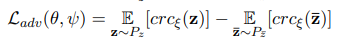

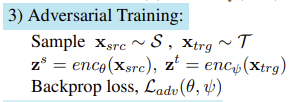

In [43]:
# 공식 보고 수정해본 버전
def train_encoder_by_discriminator(autoencoder_src, autoencoder_tgt, discriminator,
                                   optim_ae_src, optim_ae_tgt, input_ids_src, input_ids_tgt,
                                   attention_mask_src, attention_mask_tgt,
                                   grad_lambda, clip, device='cpu'):
    autoencoder_src.train()
    autoencoder_tgt.train()
    optim_ae_src.zero_grad()
    optim_ae_tgt.zero_grad()

    repr_src = autoencoder_src(input_ids_src, attention_mask_src, encode_only=True)
    repr_tgt = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=True)
    repr_src.register_hook(lambda grad: grad * grad_lambda)
    repr_tgt.register_hook(lambda grad: grad * grad_lambda)
    repr_src_pooling = torch.mean(repr_src, dim=1) # [B, H]
    repr_tgt_pooling = torch.mean(repr_tgt, dim=1)

    discr_out_src = discriminator(repr_src_pooling) # [B, 1]
    discr_out_tgt = discriminator(repr_tgt_pooling)

    #discr_loss = (discr_out_src - discr_out_tgt).mean()
    discr_loss = discr_out_src.mean() - discr_out_tgt.mean()
    discr_loss.backward()

    nn.utils.clip_grad_norm_(autoencoder_src.parameters(), clip)
    # nn.utils.clip_grad_norm_(autoencoder_tgt.parameters(), clip)
    optim_ae_src.step()
    #optim_ae_tgt.step()
    return discr_loss.cpu().item()

In [44]:
print(autoencoder_src.decoder)

BartDecoder(
  (embed_tokens): Embedding(50265, 1024, padding_idx=1)
  (embed_positions): BartLearnedPositionalEmbedding(1026, 1024)
  (layers): ModuleList(
    (0-11): 12 x BartDecoderLayer(
      (self_attn): BartAttention(
        (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
        (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
        (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
        (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
      )
      (activation_fn): GELUActivation()
      (self_attn_layer_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (encoder_attn): BartAttention(
        (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
        (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
        (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
        (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
      )
      (e

In [45]:
# decoder_src가 tgt decoding을 수행하는 decoder_tgt과 같아지는 방향으로 학습함 >> decoder_src가 tgt decoding을 할 수 있게 됨?
# pos쪽 decoder가 neg쪽 decoder와 같아지므로서 neg decoding을 잘하게 됨.

def train_decoder_src(args, autoencoder_src, autoencoder_tgt, optim_dec_src, input_ids_src, attention_mask_src):
    autoencoder_src.decoder.train()
    
    optim_dec_src.zero_grad()
    
    repr_src = autoencoder_src(input_ids_src, attention_mask_src, encode_only=True)
    logits_src = autoencoder_src.decode_only(input_ids_src, repr_src) # grad on
    logits_tgt = autoencoder_tgt.decode_only(input_ids_src, repr_src).detach() # grad off
    
#     plain_src = logits_src.view(-1, logits_src.size(-1))
#     plain_tgt = logits_tgt.view(-1, logits_tgt.size(-1))
#     criterion_dec = torch.nn.CrossEntropyLoss()
#     decode_loss = criterion_dec(plain_tgt, plain_src)
#     decode_loss = -abs(logits_src.mean() - logits_tgt.mean()) 
    decode_loss = abs(logits_src.mean() - logits_tgt.mean())
    decode_loss.backward()
    optim_dec_src.step()
    return decode_loss.cpu().item()

In [46]:
def train_decoder_tgt(args, autoencoder_src, autoencoder_tgt, optim_dec_tgt, input_ids_tgt, attention_mask_tgt):
    autoencoder_tgt.decoder.train()
    
    optim_dec_tgt.zero_grad()
    
    repr_tgt = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=True)
    logits_src = autoencoder_src.decode_only(input_ids_tgt, repr_tgt).detach() # grad off
    logits_tgt = autoencoder_tgt.decode_only(input_ids_tgt, repr_tgt) # grad on

#     plain_src = logits_src.view(-1, logits_src.size(-1))
#     plain_tgt = logits_tgt.view(-1, logits_tgt.size(-1))
#     criterion_dec = torch.nn.CrossEntropyLoss()
#     decode_loss = criterion_dec(plain_tgt, plain_src)
#     decode_loss = -abs(logits_src.mean() - logits_tgt.mean())
    decode_loss = abs(logits_src.mean() - logits_tgt.mean())
    decode_loss.backward()
    optim_dec_tgt.step()
    return decode_loss.cpu().item()

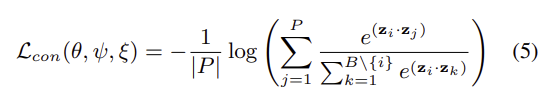

In [47]:
def train_discriminator_coop(args, autoencoder_src, autoencoder_tgt, discriminator, optim_discr, criterion_con, criterion_clf, input_ids_src, input_ids_tgt,
                        attention_mask_src, attention_mask_tgt):

    discriminator.train()
    optim_discr.zero_grad()

    src_repr = autoencoder_src(input_ids_src, attention_mask_src, encode_only=True)
    tgt_repr = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=True)
    src_repr_pooling = torch.mean(src_repr, dim=1) # [B, H]
    tgt_repr_pooling = torch.mean(tgt_repr, dim=1)

    src_discr_out = discriminator(src_repr_pooling)  # [B, 1]
    tgt_discr_out = discriminator(tgt_repr_pooling)

    discr_out = torch.cat((src_discr_out, tgt_discr_out), dim=0)
    labels = torch.cat((torch.ones(args.batch_size), torch.zeros(args.batch_size)), dim=0)
    # src_out은 1, tgt_out은 0

    con_loss = criterion_con(discr_out, labels)

    # clf loss ....
    #criterion_clf...


In [48]:
def train_encoder_coop(args, autoencoder_src, autoencoder_tgt, optim_ae_src, optim_ae_tgt, criterion_con, criterion_clf, input_ids_src, input_ids_tgt,
                                   attention_mask_src, attention_mask_tgt):
    autoencoder_src.train()
    autoencoder_tgt.train()
    optim_ae_src.zero_grad()
    optim_ae_tgt.zero_grad()

    src_repr = autoencoder_src(input_ids_src, attention_mask_src, encode_only=True)
    tgt_repr = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=True)

    repr = torch.cat((src_repr, tgt_repr), dim=0)
    labels = torch.cat((torch.ones(args.batch_size), torch.zeros(args.batch_size)), dim=0)
    # src_repr은 1, tgt_repr은 0

    con_loss = criterion_con(repr, labels)

    # clf loss ....

In [49]:
def generate(dataloader_src, dataloader_tgt, autoencoder_src, autoencoder_tgt, tokenizer, device): # val set 사용
    # input_ids 받아서 문장 생성하기
    autoencoder_src.eval() # eval mode
    autoencoder_tgt.eval()

    autoencoder_src.to(device)
    autoencoder_tgt.to(device)

    with torch.no_grad(): # grad engine off
        dataloader_src_iter = iter(dataloader_src)
        dataloader_tgt_iter = iter(dataloader_tgt)

        input_ids_src, attention_mask_src = next(dataloader_src_iter) # mini batch 뽑기
        input_ids_tgt, attention_mask_tgt = next(dataloader_tgt_iter)
        input_ids_src = input_ids_src.to(device)
        input_ids_tgt = input_ids_tgt.to(device)
        attention_mask_src = attention_mask_src.to(device)
        attention_mask_tgt = attention_mask_tgt.to(device)
        # enc_src --> dec_src
        logits_src = autoencoder_src(input_ids_src, attention_mask_src, encode_only=False)
        logits_tgt = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=False)
        probs_src = torch.nn.functional.softmax(logits_src, dim=-1) # softmax 처리
        probs_tgt = torch.nn.functional.softmax(logits_tgt, dim=-1)

        z_src = autoencoder_src(input_ids_src, attention_mask_src, encode_only=True) # encoder repr
        z_tgt = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=True)
        # enc_src --> dec_tgt
        logits_src2tgt = autoencoder_tgt.decode_only(input_ids_src, z_src) # style transfer logits
        logits_tgt2src = autoencoder_src.decode_only(input_ids_tgt, z_tgt)
        probs_src2tgt = torch.nn.functional.softmax(logits_src2tgt, dim=-1)
        probs_tgt2src = torch.nn.functional.softmax(logits_tgt2src, dim=-1)

        _, top_indices_src = torch.topk(probs_src, k=1, dim=-1) # 가장 확률값이 큰 부분의 index
        _, top_indices_tgt = torch.topk(probs_tgt, k=1, dim=-1) # [batch_size, length, 1]
        top_indices_src = top_indices_src.squeeze(-1) # 차원 맞추기
        top_indices_tgt = top_indices_tgt.squeeze(-1) # [batch_size, length]

        _, top_indices_src2tgt = torch.topk(probs_src2tgt, k=1, dim=-1) # 가장 확률값이 큰 부분의 index
        _, top_indices_tgt2src = torch.topk(probs_tgt2src, k=1, dim=-1) # [batch_size, length, 1]
        top_indices_src2tgt = top_indices_src2tgt.squeeze(-1) # 차원 맞추기
        top_indices_tgt2src = top_indices_tgt2src.squeeze(-1) # [batch_size, length]

        top_indices_src = top_indices_src[:, 1:] # 첫번째 token 제거
        top_indices_tgt = top_indices_tgt[:, 1:]
        top_indices_src2tgt = top_indices_src2tgt[:, 1:]
        top_indices_tgt2src = top_indices_tgt2src[:, 1:]

        original_src = tokenizer.batch_decode(input_ids_src, skip_special_tokens=True) # 원문 decode
        original_tgt = tokenizer.batch_decode(input_ids_tgt, skip_special_tokens=True)
        generated_sent_src = tokenizer.batch_decode(top_indices_src.tolist(), skip_special_tokens=False) # 생성문장 decode
        generated_sent_tgt = tokenizer.batch_decode(top_indices_tgt.tolist(), skip_special_tokens=False) #
        generated_sent_src2tgt = tokenizer.batch_decode(top_indices_src2tgt.tolist(), skip_special_tokens=False) # 생성문장 decode
        generated_sent_tgt2src = tokenizer.batch_decode(top_indices_tgt2src.tolist(), skip_special_tokens=False)


    for i in range(len(original_src)): # eos token 뒤로는 자르기
        eos_token_src = generated_sent_src[i].find('</s>')
        eos_token_tgt = generated_sent_tgt[i].find('</s>')
        generated_sent_src[i] = generated_sent_src[i][:eos_token_src].strip()
        generated_sent_tgt[i] = generated_sent_tgt[i][:eos_token_tgt].strip()
        eos_token_src2tgt = generated_sent_src2tgt[i].find('</s>')
        eos_token_tgt2src = generated_sent_tgt2src[i].find('</s>')
        generated_sent_src2tgt[i] = generated_sent_src2tgt[i][:eos_token_src2tgt].strip()
        generated_sent_tgt2src[i] = generated_sent_tgt2src[i][:eos_token_tgt2src].strip()

    print('******************** source sample ********************')
    for i in range(len(original_src)): # batch_size
        print("[original    ]:", original_src[i])
        print("[generate_ori]:", generated_sent_src[i]) # reconstruction check
        print("[generate_tst]:", generated_sent_src2tgt[i],"\n") # TST check
    print('******************** target sample ********************')
    for i in range(len(original_src)):
        print("[original    ]:", original_tgt[i])
        print("[generate_ori]:", generated_sent_tgt[i])
        print("[generate_tst]:", generated_sent_tgt2src[i],"\n")

In [50]:
def generate_one(dataloader_src, autoencoder_src, autoencoder_tgt, tokenizer, device):
    autoencoder_src.eval() # eval mode
    autoencoder_tgt.eval()

    autoencoder_src.to(device)
    autoencoder_tgt.to(device)

    with torch.no_grad():
        dataloader_src_iter = iter(dataloader_src)
        input_ids_src, attention_mask_src = next(dataloader_src_iter)
        input_ids_src = input_ids_src.to(device)
        attention_mask_src = attention_mask_src.to(device)

        z_src = autoencoder_src(input_ids_src, attention_mask_src, encode_only=True)
        logits_src2tgt = autoencoder_tgt.decode_only(input_ids_src, z_src)
        probs_src2tgt = torch.nn.functional.softmax(logits_src2tgt, dim=-1)

        _, top_indices_src2tgt = torch.topk(probs_src2tgt, k=1, dim=-1)
        top_indices_src2tgt = top_indices_src2tgt.squeeze(-1) # 차원 맞추기
        top_indices_src2tgt = top_indices_src2tgt[:, 1:]

        original_src = tokenizer.batch_decode(input_ids_src, skip_special_tokens=True) # 원문 decode
        generated_sent_src2tgt = tokenizer.batch_decode(top_indices_src2tgt.tolist(), skip_special_tokens=False)

    for i in range(len(original_src)): # eos token 뒤로는 자르기
        eos_token_src2tgt = generated_sent_src2tgt[i].find('</s>')
        generated_sent_src2tgt[i] = generated_sent_src2tgt[i][:eos_token_src2tgt].strip()

    print('******************** generate ********************')
    for i in range(len(original_src)): # batch_size
        print("[original]:", original_src[i])
        print("[generate]:", generated_sent_src2tgt[i],"\n") # TST check

    return original_src, generated_sent_src2tgt

In [51]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [52]:
import time
generate(dataloader_val_pos, dataloader_val_neg, autoencoder_src, autoencoder_tgt, tokenizer, device=device)
#generate_one(dataloader_val_pos, autoencoder_src, autoencoder_tgt, tokenizer, device=device)

******************** source sample ********************
[original    ]: the staff was very friendly.
[generate_ori]: The staff was very friendly.....................-------- to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to t
[generate_tst]: The staff was very friendly.....................-------- to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to to t 

[original    ]: great place fresh food and staff it's always friendly.
[generate_ori]: great place fresh food and staff it's always friendly......nernerner.....ggg g g g.ggggggggggggggg..gggggggg

In [53]:
def visualize_emb(dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, text=''):
    autoencoder_src.eval() # eval mode
    autoencoder_tgt.eval()
    repr = [] # encoder outputs
    label = [] # label
    dataloader_src_iter = itertools.cycle(dataloader_val_src) # test data iter
    dataloader_tgt_iter = itertools.cycle(dataloader_val_tgt)

    with torch.no_grad():
        for idx in range(50):
            input_ids_src, attention_mask_src = next(dataloader_src_iter)
            input_ids_tgt, attention_mask_tgt = next(dataloader_tgt_iter)

            input_ids_src = input_ids_src.to(device)
            input_ids_tgt = input_ids_tgt.to(device)
            attention_mask_src = attention_mask_src.to(device)
            attention_mask_tgt = attention_mask_tgt.to(device)

            src_repr = autoencoder_src(input_ids_src, attention_mask_src, encode_only=True)  # [B, L, H]
            tgt_repr = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=True)
            repr.append(src_repr)
            for _ in range(src_repr.shape[0]):
                label.append(1) # src는 라벨 1
            repr.append(tgt_repr)
            for _ in range(tgt_repr.shape[0]):
                label.append(0)
    # print('데이터 개수:',len(label))

    tensors = [tensor.cpu().detach().numpy() for tensor in repr] # tensor.shape == [batch_size, length, hidden]
    tensors = np.vstack(tensors) # [batch_size*len(z_list), length, hidden]
    tensors = tensors.mean(axis=1) # [batch_size*len(z_list), hidden]

    # t-SNE를 이용하여 데이터를 2차원으로 축소
    tsne = TSNE(n_components=2, random_state=0)
    reduced_data = tsne.fit_transform(tensors)

    label_names = {0: 'tgt', 1: 'src'} # 레이블을 카테고리형 데이터로 변환하고, 각 레이블에 이름을 할당합니다.
    label = pd.Categorical(label).rename_categories(label_names)

    # Pandas DataFrame으로 변환합니다.
    df_repr = pd.DataFrame(reduced_data, columns=['Dim 1', 'Dim 2'])

    # Label을 DataFrame에 추가합니다.
    df_repr['Label'] = label

    # 색상을 Label로 구분하여 플롯을 생성합니다.
    text = 'T-SNE Visualization: ' + text
    plt.title(text)
    sns.scatterplot(x="Dim 1", y="Dim 2", hue="Label", data=df_repr, palette=sns.color_palette("hsv", len(df_repr['Label'].unique())), s=25)
    plt.show()

In [54]:
from sklearn.metrics import roc_auc_score, roc_curve

def visualize_discr(dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, discriminator, text=''):
    autoencoder_src.eval() # eval mode
    autoencoder_tgt.eval()
    discriminator.eval()
    out = []
    out_src = [] # discr outputs
    out_tgt = []
    label = [] # label
    dataloader_src_iter = itertools.cycle(dataloader_val_src) # test data iter
    dataloader_tgt_iter = itertools.cycle(dataloader_val_tgt)
    with torch.no_grad():
        for idx in range(20):
            input_ids_src, attention_mask_src = next(dataloader_src_iter)
            input_ids_tgt, attention_mask_tgt = next(dataloader_tgt_iter)

            input_ids_src = input_ids_src.to(device)
            input_ids_tgt = input_ids_tgt.to(device)
            attention_mask_src = attention_mask_src.to(device)
            attention_mask_tgt = attention_mask_tgt.to(device)

            src_repr = autoencoder_src(input_ids_src, attention_mask_src, encode_only=True)  # [B, L, H]
            tgt_repr = autoencoder_tgt(input_ids_tgt, attention_mask_tgt, encode_only=True)
            src_repr_pooling = torch.mean(src_repr, dim=1) # [B, H]
            tgt_repr_pooling = torch.mean(tgt_repr, dim=1)

            src_discr_out = discriminator(src_repr_pooling.detach())  # [B, 1]
            tgt_discr_out = discriminator(tgt_repr_pooling.detach())  # [B, 1]

            out.append(src_discr_out)
            out_src.append(src_discr_out)
            for _ in range(src_discr_out.shape[0]):
                label.append(1) # src label 1
            out.append(tgt_discr_out)
            out_tgt.append(tgt_discr_out)
            for _ in range(tgt_discr_out.shape[0]):
                label.append(0)
    print('데이터 전체 개수:',len(label))
    tensors_src = [tensor.cpu().detach().numpy() for tensor in out_src] # tensor.shape == [batch_size, length, hidden]
    tensors_src = np.vstack(tensors_src) # [batch_size*len(z_list), length, hidden]
    tensors_tgt = [tensor.cpu().detach().numpy() for tensor in out_tgt] # tensor.shape == [batch_size, length, hidden]
    tensors_tgt = np.vstack(tensors_tgt) # [batch_size*len(z_list), length, hidden]
    tensors = [tensor.cpu().detach().numpy() for tensor in out]
    tensors = np.vstack(tensors)

    plt.scatter(range(len(tensors_src)), tensors_src,
                color = 'purple', s=20, alpha=0.5, label='z') # z_src
    plt.scatter(range(len(tensors_tgt)), tensors_tgt,
                color = 'orange', s=20, alpha=0.5, label='z_bar')
    plt.ylim([-0.5, 0.5]) 
    text = 'Discriminator Visualization: ' + text
    plt.title(text)
    plt.legend()
    plt.show()
    
    auc = roc_auc_score(label, tensors)
    fpr, tpr, thresholds = roc_curve(label, tensors)
    
    plt.plot(fpr, tpr, color='blue', label=f'AUC = {auc:.2f}')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

    # print(f"AUROC: {auc:.2f}")

데이터 전체 개수: 160


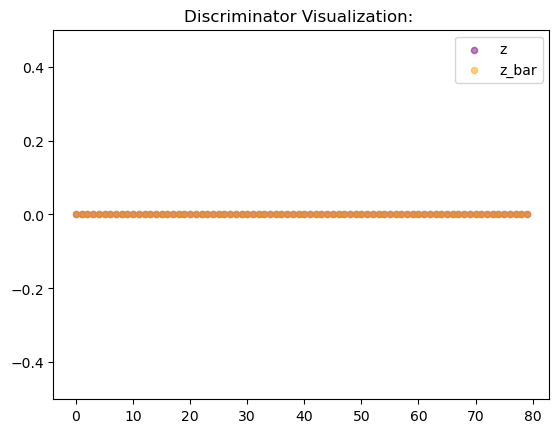

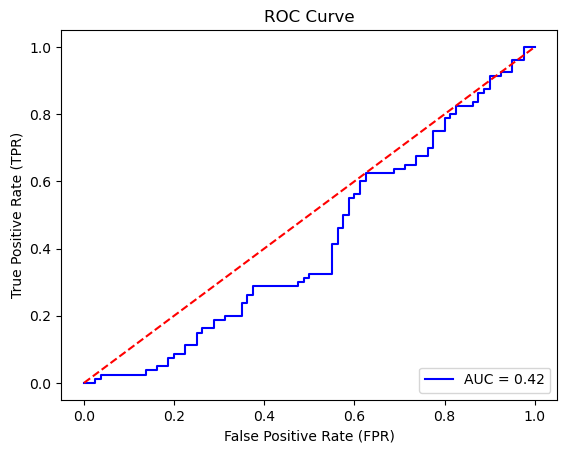

In [55]:
visualize_discr(dataloader_val_pos, dataloader_val_neg, autoencoder_src, autoencoder_tgt, discriminator)

In [56]:
def train_epoch(args, dataloader_src, dataloader_tgt, dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, discriminator,
                optim_ae_src, optim_ae_tgt, optim_dec_src, optim_dec_tgt, criterion_ae, criterion_con, criterion_clf, device, tokenizer):

    key_list = ['train_ae_nl_src', 'train_ae_nl_tgt', 'train_discr', 'train_ae_by_discr', 'train_dec_src', 'train_dec_tgt']
    default_value = 0
    batch_loss = dict.fromkeys(key_list, default_value) # loss 저장을 위한 empty dict
    
    # 무한 반복자 생성
    dataloader_src_iter = itertools.cycle(dataloader_src)
    dataloader_tgt_iter = itertools.cycle(dataloader_tgt)

    # 두 DataLoader 중 더 큰 크기를 기준으로 반복 수행
    num_iterations = max(len(dataloader_src), len(dataloader_tgt))

    niters_autoencoder = args.niters_ae
    niters_gan = 1  # hardcoded for now
    niters_discriminator = args.niters_gan_d
    niters_discr_autoencoder = args.niters_gan_ae

    visualize_emb(dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, text='Vanilla')

    for idx in range(num_iterations):
        # 데이터 불러오기
        # for i in range(100):
        input_ids_src, attention_mask_src = next(dataloader_src_iter)
        input_ids_tgt, attention_mask_tgt = next(dataloader_tgt_iter)

        input_ids_src = input_ids_src.to(device)
        input_ids_tgt = input_ids_tgt.to(device)
        attention_mask_src = attention_mask_src.to(device)
        attention_mask_tgt = attention_mask_tgt.to(device)

        train_ae_nl_src = train_ae_nl(autoencoder_src, autoencoder_tgt, optim_ae_src, optim_ae_tgt, criterion_ae, input_ids_src, input_ids_tgt, attention_mask_src, attention_mask_tgt, args.clip, device, src=True)
        train_ae_nl_tgt = train_ae_nl(autoencoder_src, autoencoder_tgt, optim_ae_src, optim_ae_tgt, criterion_ae, input_ids_src, input_ids_tgt, attention_mask_src, attention_mask_tgt, args.clip, device, src=False)
        
#         train_ae_src = train_autoencoder(autoencoder=autoencoder_src,
#                                 optim_ae=optim_ae_src,
#                                 criterion_ae=criterion_ae,
#                                 input_ids=input_ids_src,
#                                 attention_mask=attention_mask_src,
#                                 clip=args.clip,
#                                 device=device)
#         train_ae_tgt = train_autoencoder(autoencoder=autoencoder_tgt,
#                                 optim_ae=optim_ae_tgt,
#                                 criterion_ae=criterion_ae,
#                                 input_ids=input_ids_tgt,
#                                 attention_mask=attention_mask_tgt,
#                                 clip=args.clip,
#                                 device=device)

        if idx % args.print_every == 0:
            batch_loss['train_ae_nl_src'] = train_ae_nl_src
            batch_loss['train_ae_nl_tgt'] = train_ae_nl_tgt 
        if idx % niters_autoencoder == 0:  # training GAN part
            for _ in range(niters_gan):
            # for _ in range(100):
                dl_src_iter_discr = iter(dataloader_src) # discriminator 학습용으로 따로 dataloader_iter 사용
                dl_tgt_iter_discr = iter(dataloader_tgt)
                for _ in range(niters_discriminator): # 5회 반복
                    rd_input_ids_src, rd_attention_mask_src = next(dl_src_iter_discr) # discr는 5회 추가 학습
                    rd_input_ids_tgt, rd_attention_mask_tgt = next(dl_tgt_iter_discr)
                    rd_input_ids_src = rd_input_ids_src.to(device)
                    rd_input_ids_tgt = rd_input_ids_tgt.to(device)
                    rd_attention_mask_src = rd_attention_mask_src.to(device)
                    rd_attention_mask_tgt = rd_attention_mask_tgt.to(device)
                    train_discr = train_discriminator(autoencoder_src=autoencoder_src,
                                                    autoencoder_tgt=autoencoder_tgt,
                                                    discriminator=discriminator,
                                                    optim_discr=optim_discr,
                                                    input_ids_src=rd_input_ids_src,
                                                    input_ids_tgt=rd_input_ids_tgt,
                                                    attention_mask_src=rd_attention_mask_src,
                                                    attention_mask_tgt=rd_attention_mask_tgt,
                                                    gan_gp_lambda=args.gan_gp_lambda,
                                                    device=device)
                    batch_loss['train_discr'] = train_discr
                # if idx % args.print_every == 0:
                #     visualize_emb(dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, text=str(idx) + ' times train_discr')
                for _ in range(niters_discr_autoencoder):
                    rd_input_ids_src, rd_attention_mask_src = next(dl_src_iter_discr)
                    rd_input_ids_tgt, rd_attention_mask_tgt = next(dl_tgt_iter_discr)
                    rd_input_ids_src = rd_input_ids_src.to(device)
                    rd_input_ids_tgt = rd_input_ids_tgt.to(device)
                    rd_attention_mask_src = rd_attention_mask_src.to(device)
                    rd_attention_mask_tgt = rd_attention_mask_tgt.to(device)
                    train_ae_by_discr = train_encoder_by_discriminator(autoencoder_src, autoencoder_tgt, discriminator,
                                                                       optim_ae_src, optim_ae_tgt,
                                                                       rd_input_ids_src, rd_input_ids_tgt,
                                                                       rd_attention_mask_src, rd_attention_mask_tgt,
                                                                       grad_lambda=args.grad_lambda, clip=args.clip)
                    batch_loss['train_ae_by_discr'] = train_ae_by_discr
            if idx % args.print_every == 0:
                visualize_emb(dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, text=str(idx) + ' times train_adv')

        if idx % args.print_every == 0: # mini batch args.print_every 회마다 loss 출력
            visualize_discr(dataloader_val_pos, dataloader_val_neg, autoencoder_src, autoencoder_tgt, discriminator, text=str(idx) + ' times')
            print('[iter: %d]'%idx)
            print('train_ae_nl_src: %f, train_ae_nl_tgt: %f'%(batch_loss['train_ae_nl_src'],batch_loss['train_ae_nl_tgt']))
            print('train_discr: %f, train_ae_by_discr: %f'%(batch_loss['train_discr'], batch_loss['train_ae_by_discr']))
            #print('train_dec_src: %f, train_dec_tgt: %f'%(batch_loss['train_dec_src'],batch_loss['train_dec_tgt']))
            generate(dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, tokenizer, device)
            # evaluate(dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, tokenizer, device, bart)

    return batch_loss # epoch의 마지막 loss 반환

In [57]:
def train(args, dataloader_src, dataloader_tgt, dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, discriminator,
                optim_ae_src, optim_ae_tgt, optim_dec_src, optim_dec_tgt, criterion_ae, criterion_con, criterion_clf, device, tokenizer):
    total_loss = {}
    for epoch in range(args.epochs):
        print(f'Epoch {epoch + 1}/{args.epochs}')
        # epoch 1회
        epoch_loss = train_epoch(args, dataloader_src, dataloader_tgt, dataloader_val_src, dataloader_val_tgt, autoencoder_src, autoencoder_tgt, discriminator,
                optim_ae_src, optim_ae_tgt, optim_dec_src, optim_dec_tgt, criterion_ae, criterion_con, criterion_clf, device, tokenizer)
        # epoch 1회 학습 후 generate로 test
        generate(dataloader_src, dataloader_tgt, autoencoder_src, autoencoder_tgt, device)


Epoch 1/15


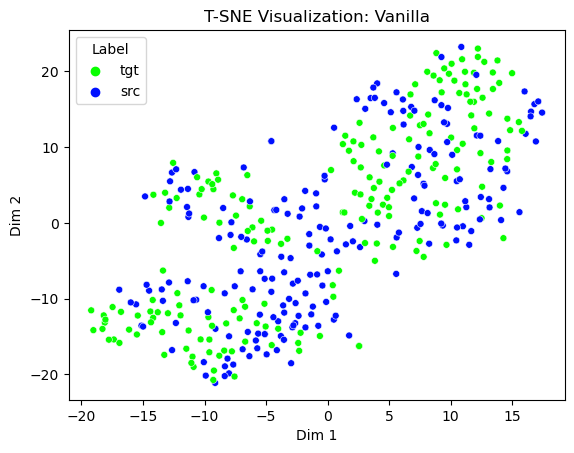

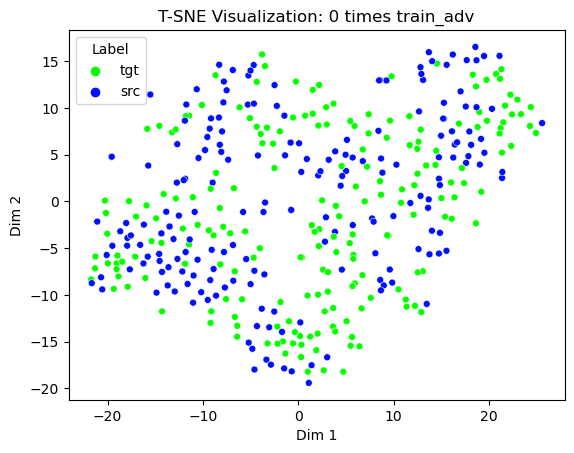

데이터 전체 개수: 160


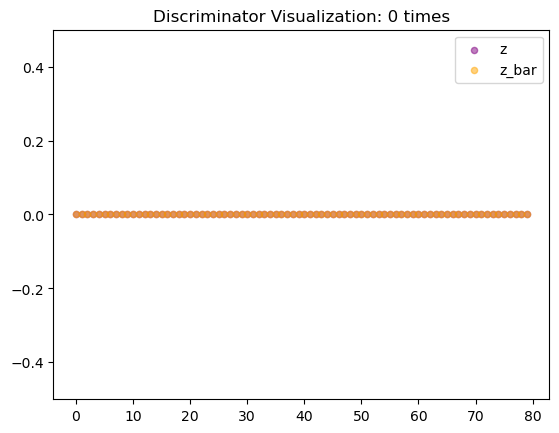

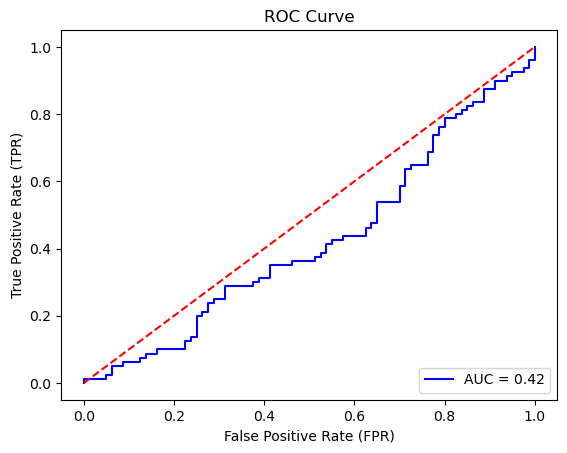

[iter: 0]
train_ae_nl_src: 4.857029, train_ae_nl_tgt: 3.097461
train_discr: -0.000632, train_ae_by_discr: -0.000176
******************** source sample ********************
[original    ]: i would totally recommend this location and i will be returning!
[generate_ori]: i would totally recommend this location and i will be returning! https
[generate_tst]: i would totally recommend this location and i will be returning! https 

[original    ]: eggs come out a perfect over medium every time and look so pretty.
[generate_ori]: Is come out a perfect over medium every time and look so pretty..
[generate_tst]: Thes come out a perfect over medium every time and look so pretty.. 

[original    ]: they have great sweet treats and their subs are awesome.
[generate_ori]: The have great sweet treats and their subs are awesome......ner......................................................................................................innerinnerinner....
[generate_tst]: The have great sweet treats an

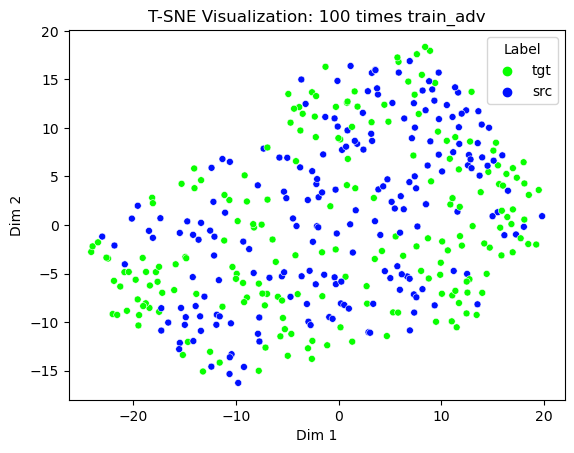

데이터 전체 개수: 160


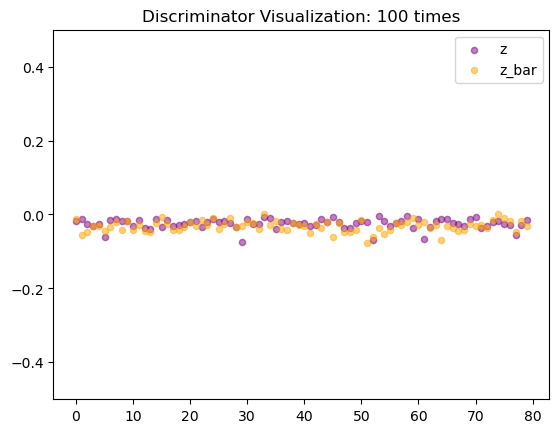

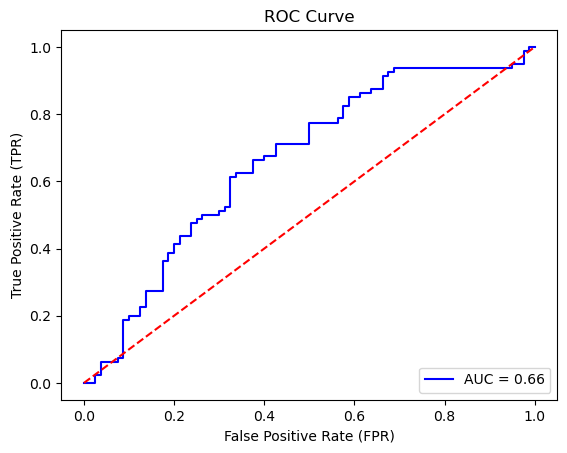

[iter: 100]
train_ae_nl_src: 4.294886, train_ae_nl_tgt: 3.022315
train_discr: -0.000892, train_ae_by_discr: 0.007338
******************** source sample ********************
[original    ]: the food portions are huge for a great price.
[generate_ori]: the food portions are huge for a great price..
[generate_tst]: the food portions are huge for a great price.. 

[original    ]: the deli is great, good fresh bread & meat.
[generate_ori]: the deli is great, good fresh bread & meat..
[generate_tst]: the deli is great, good fresh bread & meat.. 

[original    ]: this store has a great staff!
[generate_ori]: this store has a great staff!
[generate_tst]: this store has a great staff! 

[original    ]: i get the best service and friendly attitudes when i visit in the morning.
[generate_ori]: i get the best service and friendly attitudes when i visit in the morning..
[generate_tst]: i get the best service and friendly attitudes when i visit in the morning.. 

******************** target sample *

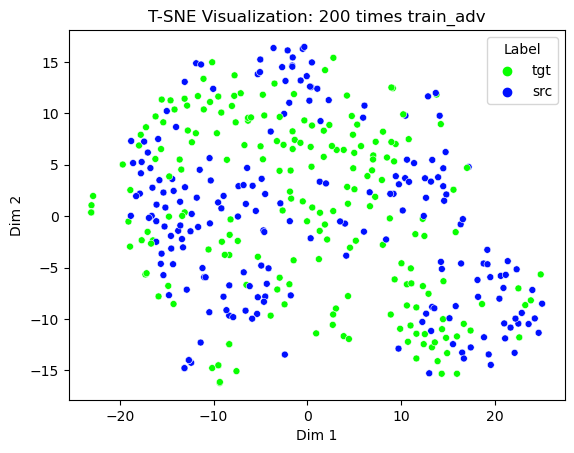

데이터 전체 개수: 160


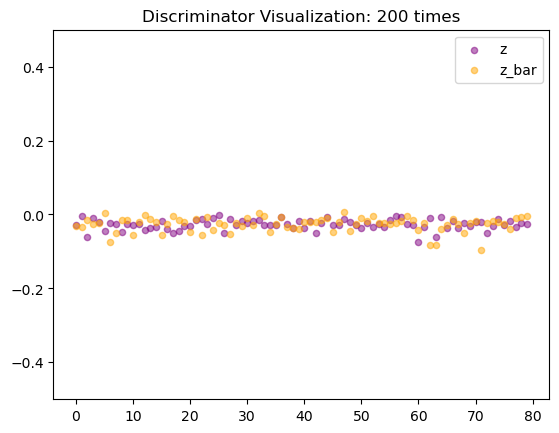

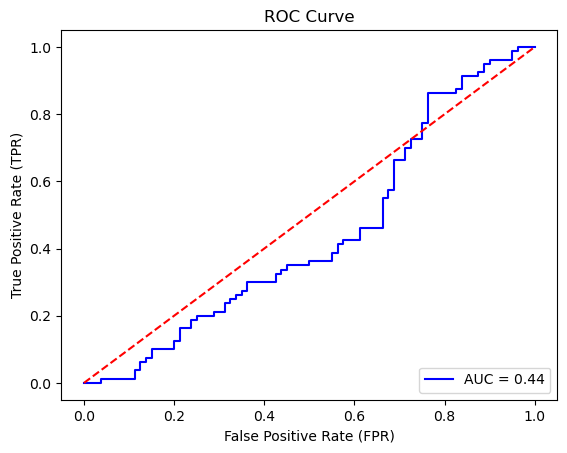

[iter: 200]
train_ae_nl_src: 3.150970, train_ae_nl_tgt: 2.752640
train_discr: -0.003889, train_ae_by_discr: 0.007891
******************** source sample ********************
[original    ]: all their fried food is good.
[generate_ori]: all their fried food is good..
[generate_tst]: all their fried food is good.. 

[original    ]: the food is fantastic and very reasonably priced.
[generate_ori]: the food is fantastic and very reasonably priced.
[generate_tst]: the food is fantastic and very reasonably priced. 

[original    ]: i love their green chili burger, fries with gravy and sweet tea.
[generate_ori]: i love their green chili burger, fries with gravy and sweet tea..
[generate_tst]: i love their green chili burger, fries with gravy and sweet tea.. 

[original    ]: the staff is super friendly, and eager to serve!
[generate_ori]: the staff is super friendly, and eager to serve! https
[generate_tst]: the staff is super friendly, and eager to serve! https 

******************** target s

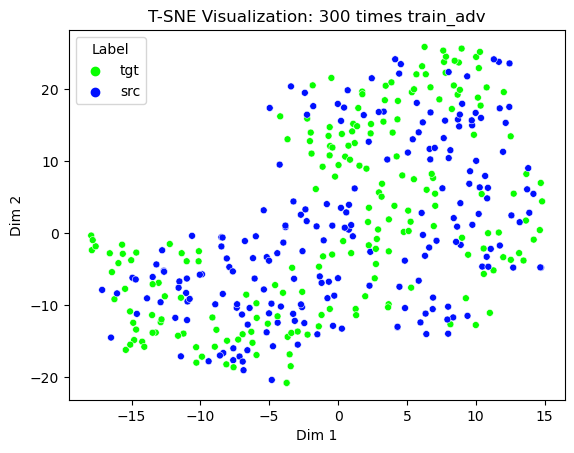

데이터 전체 개수: 160


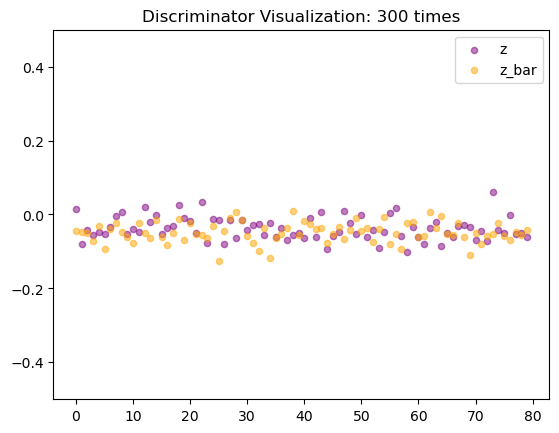

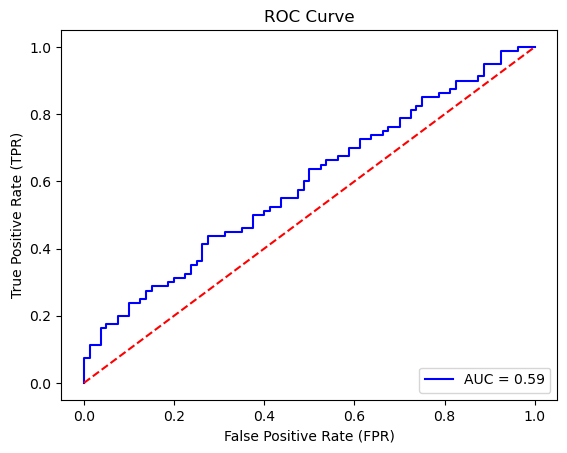

[iter: 300]
train_ae_nl_src: 3.975307, train_ae_nl_tgt: 2.621324
train_discr: -0.022075, train_ae_by_discr: 0.018099
******************** source sample ********************
[original    ]: she was amazing!
[generate_ori]: she was amazing!
[generate_tst]: she was amazing! 

[original    ]: the service is fast and friendly.
[generate_ori]: the service is fast and friendly.
[generate_tst]: the service is fast and friendly. 

[original    ]: alex our waiter, did an exceptional job.
[generate_ori]: alex our waiter, did an exceptional job.
[generate_tst]: alex our waiter, did an exceptional job. 

[original    ]: he fully explained my new family plan and how to use my iphone.
[generate_ori]: he fully explained my new family plan and how to use my iphone.
[generate_tst]: he fully explained my new family plan and how to use my iphone. 

******************** target sample ********************
[original    ]: man, was he rude.
[generate_ori]: man, was he rude..
[generate_tst]: man, was he rude..

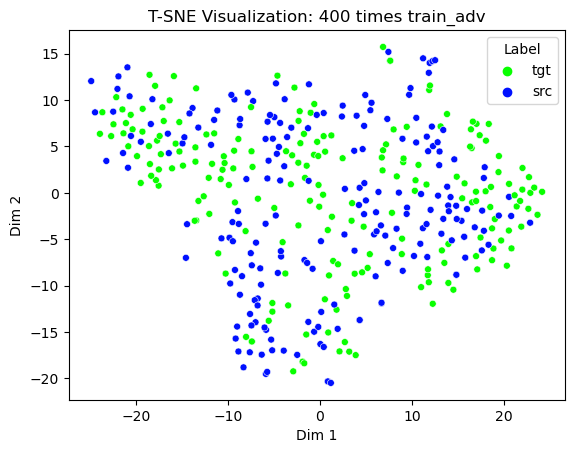

데이터 전체 개수: 160


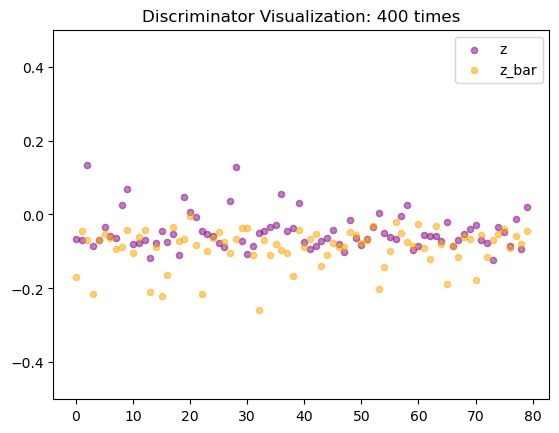

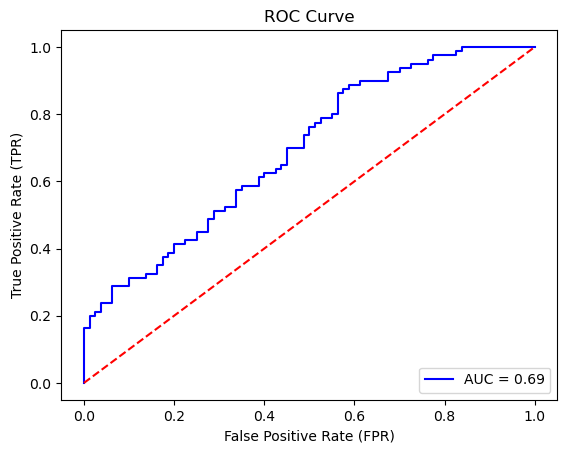

[iter: 400]
train_ae_nl_src: 2.731632, train_ae_nl_tgt: 2.172465
train_discr: -0.014546, train_ae_by_discr: 0.041036
******************** source sample ********************
[original    ]: wings always made to my liking and very crispy.
[generate_ori]: wings always made to my liking and very crispy..
[generate_tst]: wings always made to my liking and very crispy.. 

[original    ]: i receive great customer service.
[generate_ori]: i receive great customer service..
[generate_tst]: i receive great customer service.. 

[original    ]: their cookies are tasty too.
[generate_ori]: their cookies are tasty too..
[generate_tst]: their cookies are tasty too.. 

[original    ]: it was great.
[generate_ori]: it was great.
[generate_tst]: it was great. 

******************** target sample ********************
[original    ]: terrible experience.
[generate_ori]: terrible experience.
[generate_tst]: terrible experience. 

[original    ]: it's just too weird.
[generate_ori]: it's just too weird.
[ge

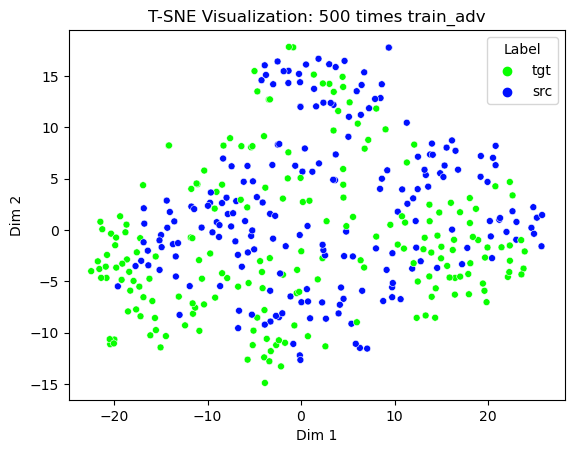

데이터 전체 개수: 160


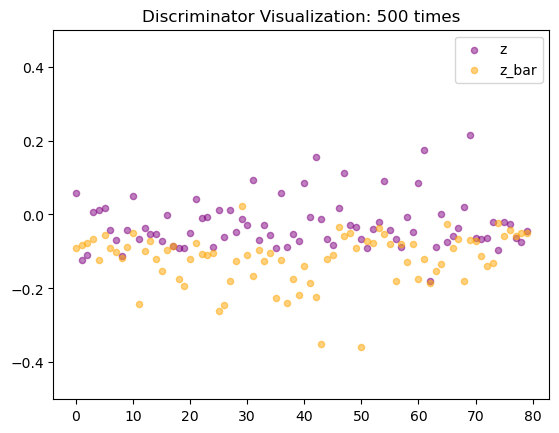

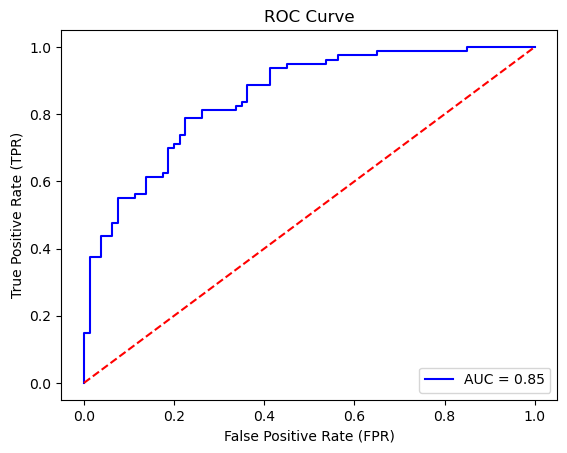

[iter: 500]
train_ae_nl_src: 2.330964, train_ae_nl_tgt: 3.124798
train_discr: -0.057759, train_ae_by_discr: 0.031685
******************** source sample ********************
[original    ]: actually, this location ( campus for compassion ) is truly magnificent.
[generate_ori]: actually, this location ( campus for the ) is truly magnificent.
[generate_tst]: actually, this location ( campus for the ) is truly magnificent. 

[original    ]: delicious carne asada!
[generate_ori]: delicious carne asada!
[generate_tst]: delicious carne asada! 

[original    ]: great atmosphere and team.
[generate_ori]: great atmosphere and team.
[generate_tst]: great atmosphere and team. 

[original    ]: this restaurant!
[generate_ori]: this is!
[generate_tst]: this is! 

******************** target sample ********************
[original    ]: our main course came out before the soup!
[generate_ori]: our main course came out before the soup!
[generate_tst]: our main course came out before the soup! 

[origina

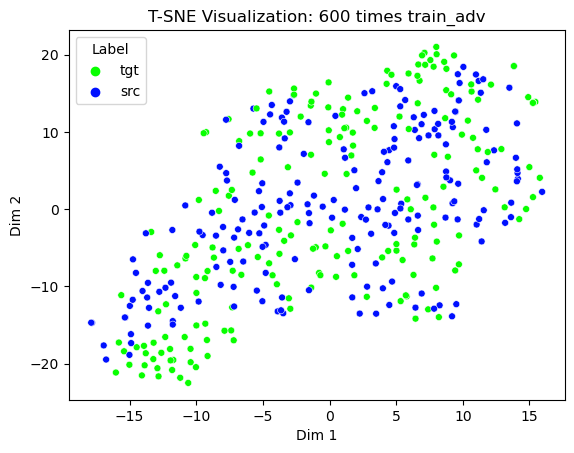

데이터 전체 개수: 160


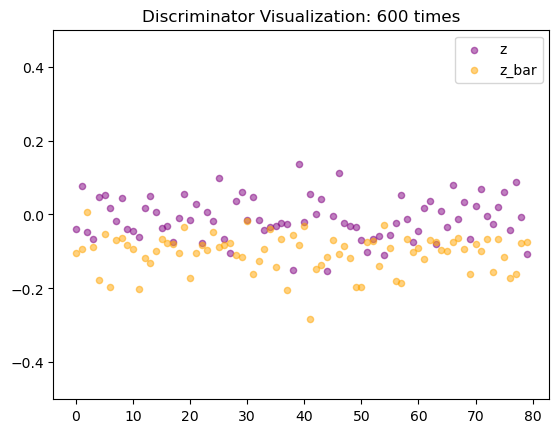

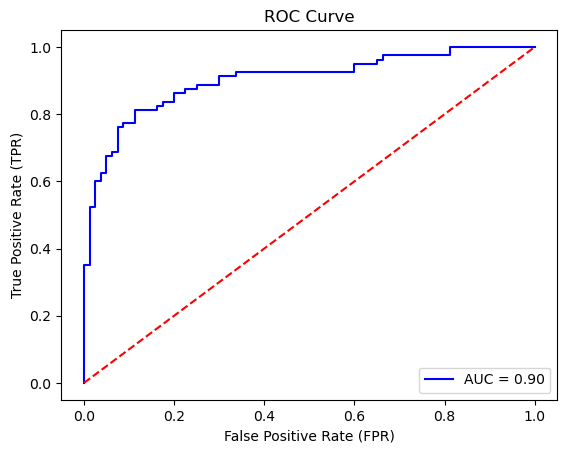

[iter: 600]
train_ae_nl_src: 2.348478, train_ae_nl_tgt: 2.322735
train_discr: -0.059051, train_ae_by_discr: 0.051511
******************** source sample ********************
[original    ]: they have great sweet treats and their subs are awesome.
[generate_ori]: they have great sweet treats and their subs are awesome.
[generate_tst]: they have great sweet treats and their subs are awesome. 

[original    ]: they have never changed any items over the years and it always tastes amazing!
[generate_ori]: they have never changed any items over the years and it always tastes amazing!
[generate_tst]: they have never changed any items over the years and it always tastes amazing! 

[original    ]: huge assortment of meats and cheeses.
[generate_ori]: huge assortment of meats and cheeses.
[generate_tst]: huge assortment of meats and cheeses. 

[original    ]: hopefully they will open up somewhere else, when their lease is up.
[generate_ori]: hopefully they will open up somewhere else, when their 

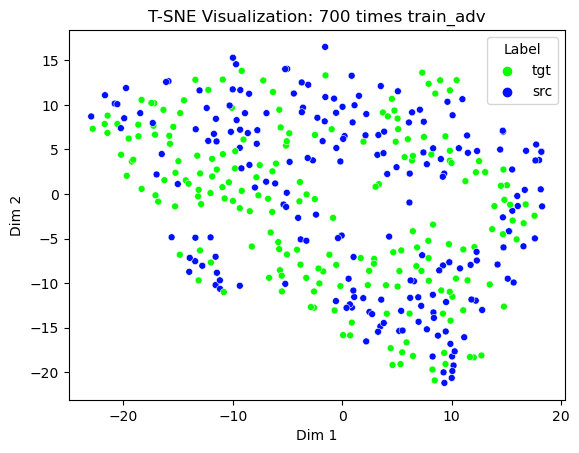

데이터 전체 개수: 160


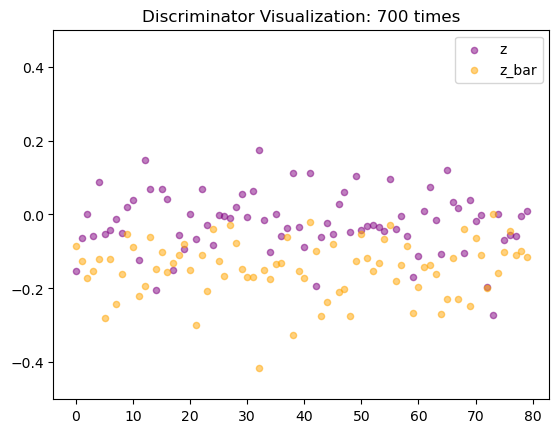

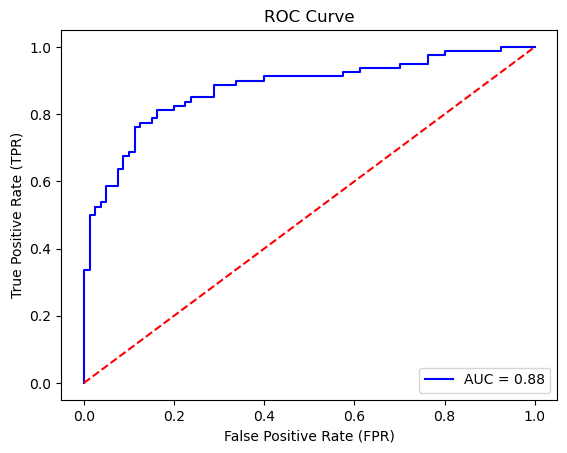

[iter: 700]
train_ae_nl_src: 1.929389, train_ae_nl_tgt: 2.071936
train_discr: -0.067301, train_ae_by_discr: 0.037386
******************** source sample ********************
[original    ]: nice small atmosphere that brings out the bosnian culture.
[generate_ori]: nice small atmosphere that brings out the bosnian culture.
[generate_tst]: nice small atmosphere that brings out the bosnian culture. 

[original    ]: excellent food and wonderful service.
[generate_ori]: excellent food and wonderful service.
[generate_tst]: excellent food and wonderful service. 

[original    ]: i totally recommend her.
[generate_ori]: i totally recommend her.
[generate_tst]: i totally recommend her. 

[original    ]: highly recommend it!
[generate_ori]: highly recommend it!
[generate_tst]: highly recommend it! 

******************** target sample ********************
[original    ]: cheap drink specials.
[generate_ori]: cheap drink specials..
[generate_tst]: cheap drink specials.. 

[original    ]: plus gum

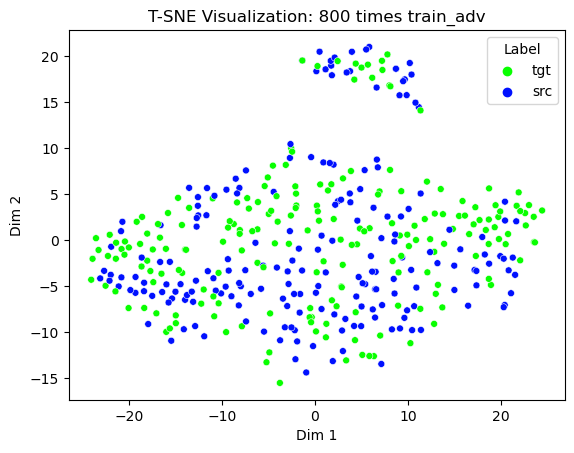

데이터 전체 개수: 160


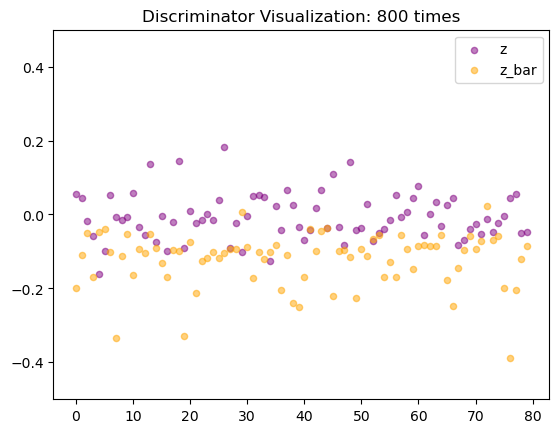

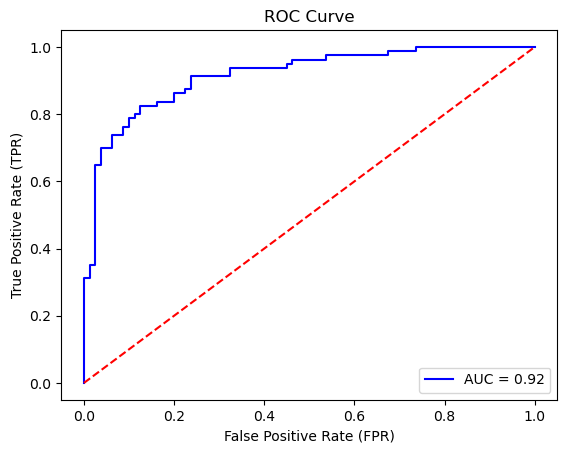

[iter: 800]
train_ae_nl_src: 1.960222, train_ae_nl_tgt: 2.243719
train_discr: -0.052719, train_ae_by_discr: 0.077405
******************** source sample ********************
[original    ]: miles were good and were good buys.
[generate_ori]: miles were good and were good buys.
[generate_tst]: miles were good and were good buys. 

[original    ]: great great great.
[generate_ori]: great great great.
[generate_tst]: great great great. 

[original    ]: it's not gourmet but it's great eats at unbeatable prices.
[generate_ori]: it's not gourmet but it's great eats at unbeatable prices.
[generate_tst]: it's not gourmet but it's great eats at unbeatable prices. 

[original    ]: the customer service was just amazing.
[generate_ori]: the customer service was just amazing.
[generate_tst]: the customer service was just amazing. 

******************** target sample ********************
[original    ]: i have been here _num_ times.
[generate_ori]: i have been here _num_ times.
[generate_tst]: i ha

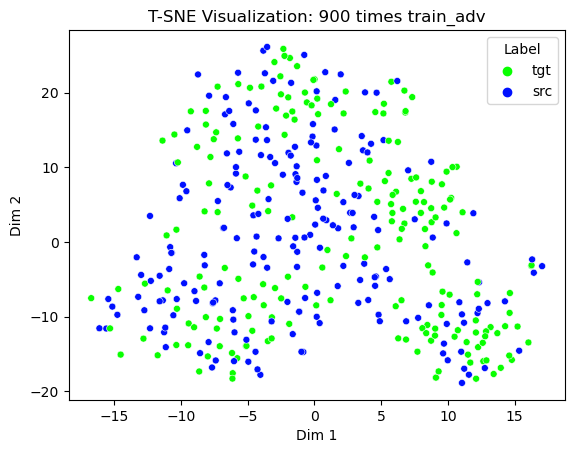

데이터 전체 개수: 160


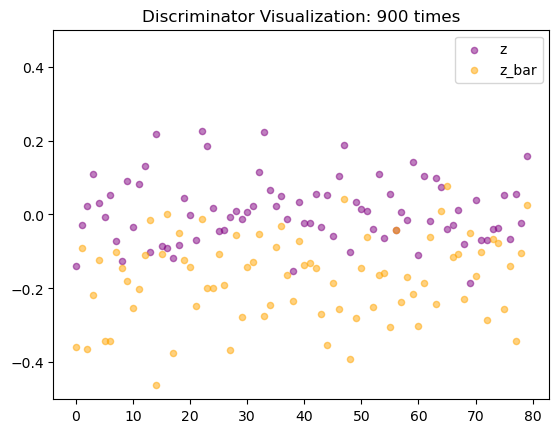

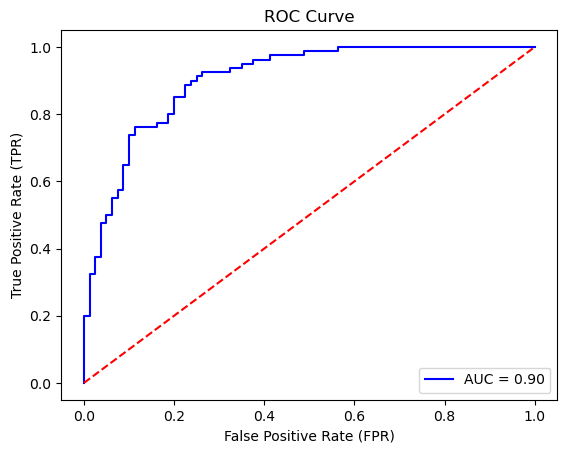

[iter: 900]
train_ae_nl_src: 1.978742, train_ae_nl_tgt: 1.818009
train_discr: -0.079711, train_ae_by_discr: 0.059528
******************** source sample ********************
[original    ]: moved to goodyear from phoenix.
[generate_ori]: moved to goodyear from phoenix.
[generate_tst]: moved to goodyear from phoenix. 

[original    ]: love it!
[generate_ori]: love it!
[generate_tst]: love it! 

[original    ]: so much food, we had to take it home.
[generate_ori]: so much food, we had to take it home.
[generate_tst]: so much food, we had to take it home. 

[original    ]: we both had the shrimp trio and we got a cheesecake to go.
[generate_ori]: we both had the shrimp trio and we got a cheesecake to go.
[generate_tst]: we both had the shrimp trio and we got a cheesecake to go. 

******************** target sample ********************
[original    ]: i didn't care for the food, thought it was bland.
[generate_ori]: i didn't care for the food, thought it was bland.
[generate_tst]: i didn't 

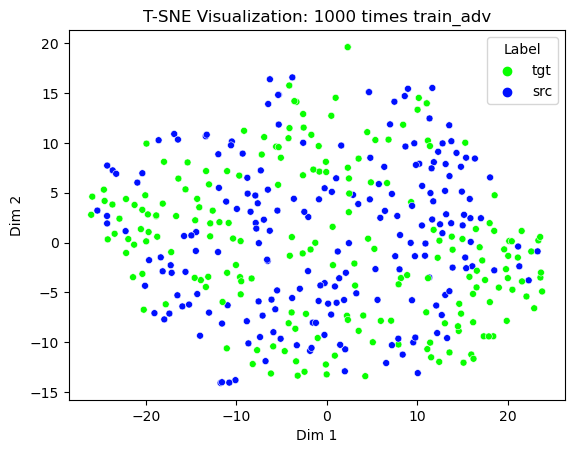

데이터 전체 개수: 160


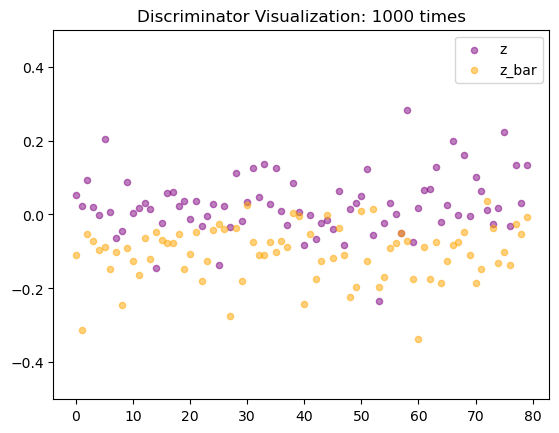

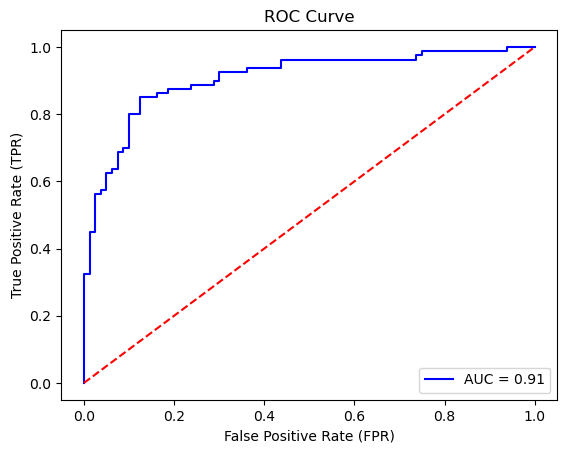

[iter: 1000]
train_ae_nl_src: 1.515094, train_ae_nl_tgt: 2.077959
train_discr: -0.061067, train_ae_by_discr: 0.094872
******************** source sample ********************
[original    ]: love her, `` honey ''!
[generate_ori]: love her, `` honey ''!
[generate_tst]: love her, `` honey ''! 

[original    ]: first time here and the service was very good.
[generate_ori]: first time here and the service was very good.
[generate_tst]: first time here and the service was very good. 

[original    ]: the grocery prices are excellent!
[generate_ori]: the grocery prices are excellent!
[generate_tst]: the grocery prices are excellent! 

[original    ]: incredible service by francisco.
[generate_ori]: incredible service by francisco.
[generate_tst]: incredible service by francisco. 

******************** target sample ********************
[original    ]: would leave _num_ stars if i could.
[generate_ori]: would leave _num_ stars if i could.
[generate_tst]: would leave _num_ stars if i could. 

[

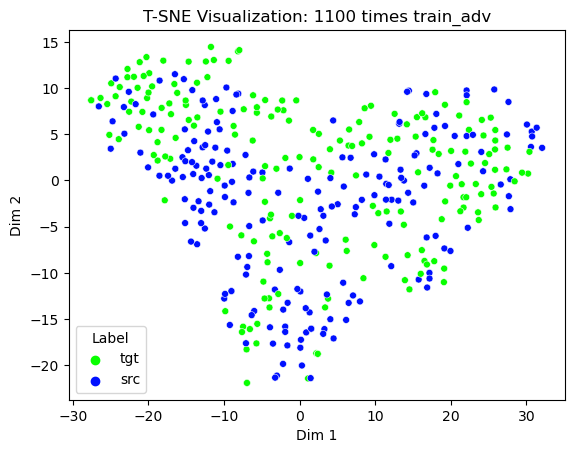

데이터 전체 개수: 160


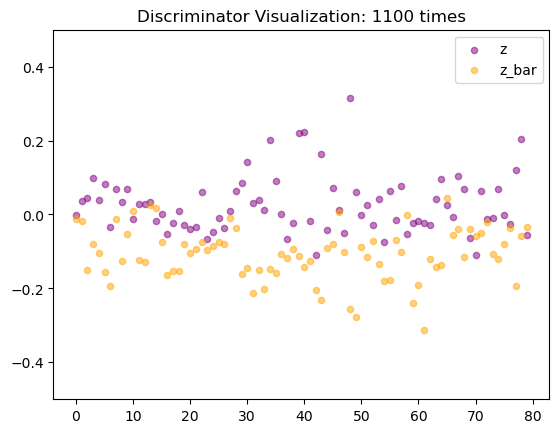

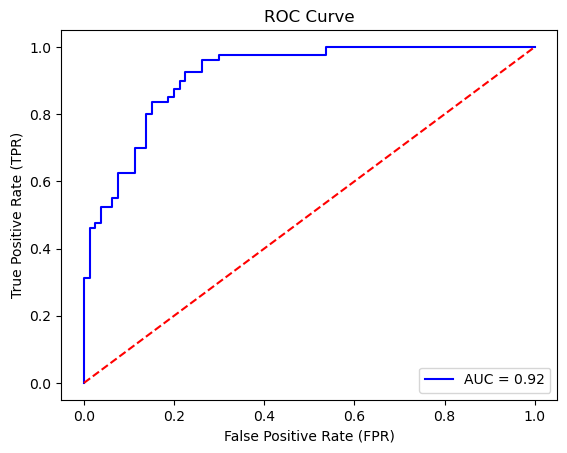

[iter: 1100]
train_ae_nl_src: 1.864319, train_ae_nl_tgt: 1.655043
train_discr: -0.089168, train_ae_by_discr: 0.071211
******************** source sample ********************
[original    ]: i will definitely come back for that and the singapore noodles.
[generate_ori]: i will definitely come back for that and the singapore noodles.
[generate_tst]: i will definitely come back for that and the singapore noodles. 

[original    ]: if you haven't been here or are thinking of checking it.
[generate_ori]: if you haven't been here or are thinking of checking it. Please
[generate_tst]: if you haven't been here or are thinking of checking it. Please 

[original    ]: friendly staff and big selection of almost anything you want.
[generate_ori]: friendly staff and big selection of almost anything you want.
[generate_tst]: friendly staff and big selection of almost anything you want. 

[original    ]: so far so good.
[generate_ori]: so far so good.
[generate_tst]: so far so good. 

***************

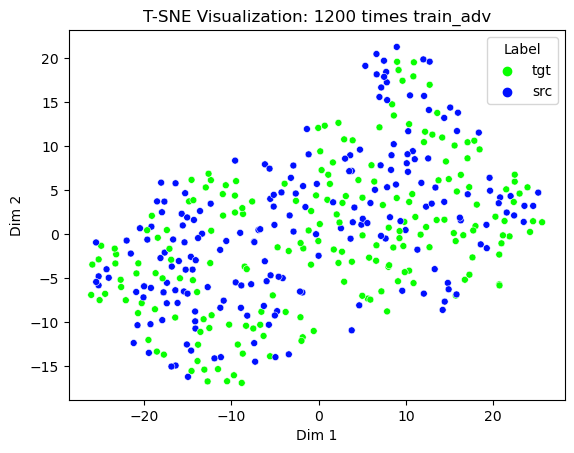

데이터 전체 개수: 160


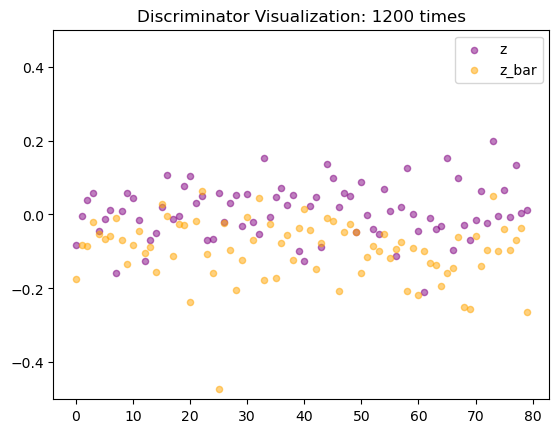

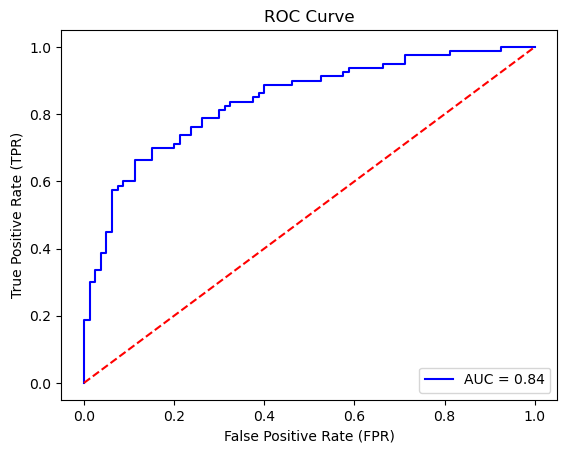

[iter: 1200]
train_ae_nl_src: 2.026010, train_ae_nl_tgt: 2.341240
train_discr: -0.101077, train_ae_by_discr: 0.116968
******************** source sample ********************
[original    ]: awesome place!
[generate_ori]: awesome place!
[generate_tst]: awesome place! 

[original    ]: the new course is great!
[generate_ori]: the new course is great!
[generate_tst]: the new course is great! 

[original    ]: we got a couple of cannolis that were very good.
[generate_ori]: we got a couple of cannolis that were very good.
[generate_tst]: we got a couple of cannolis that were very good. 

[original    ]: just amazing.
[generate_ori]: just amazing.
[generate_tst]: just amazing. 

******************** target sample ********************
[original    ]: bye bye forever mean people!
[generate_ori]: bye bye forever mean people!
[generate_tst]: bye bye forever mean people! 

[original    ]: wish i could give them zero stars.
[generate_ori]: wish i could give them zero stars.
[generate_tst]: wish i

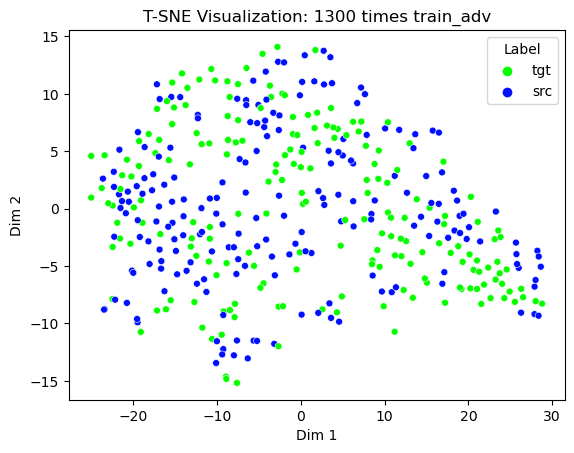

데이터 전체 개수: 160


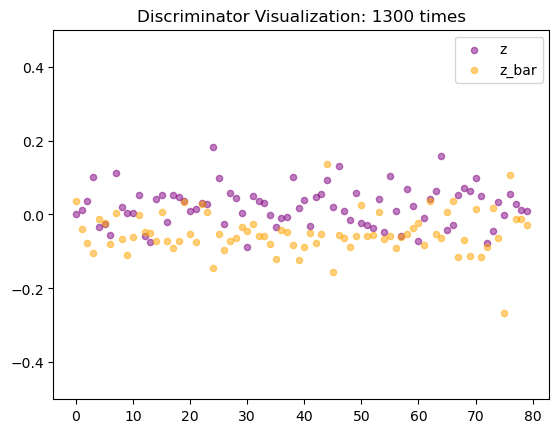

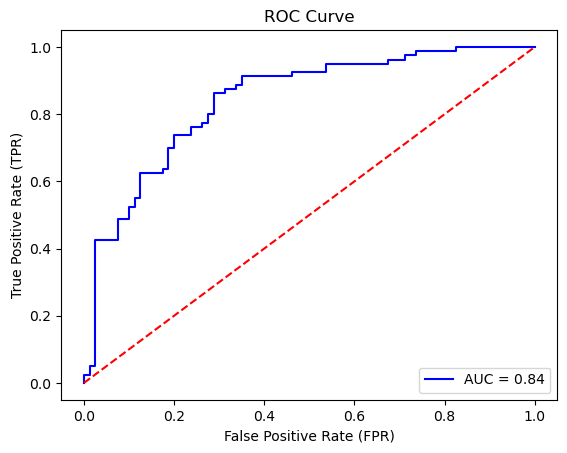

[iter: 1300]
train_ae_nl_src: 1.735537, train_ae_nl_tgt: 1.514625
train_discr: -0.073395, train_ae_by_discr: 0.064622
******************** source sample ********************
[original    ]: dr ho is the best dr i could have asked for.
[generate_ori]: dr ho is the best dr i could have asked for.
[generate_tst]: dr ho is the best dr i could have asked for. 

[original    ]: it reminds me of home.
[generate_ori]: it reminds me of home.
[generate_tst]: it reminds me of home. 

[original    ]: greens were good.
[generate_ori]: greens were good.
[generate_tst]: greens were good. 

[original    ]: definitely worth checking out especially after drinking all night... really hits the spot.
[generate_ori]: definitely worth checking out especially after drinking all night... really hits the spot.
[generate_tst]: definitely worth checking out especially after drinking all night... really hits the spot. 

******************** target sample ********************
[original    ]: walgreen's is dead to m

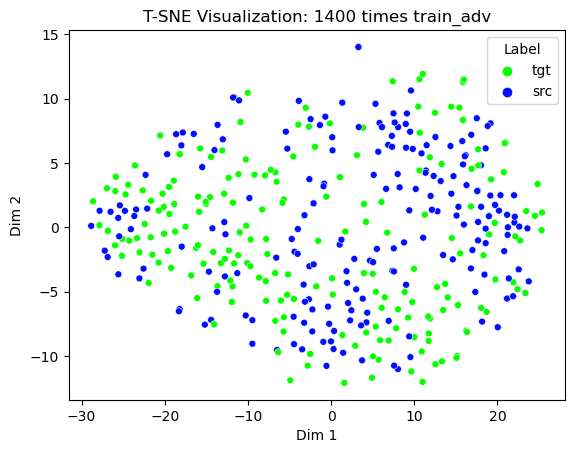

데이터 전체 개수: 160


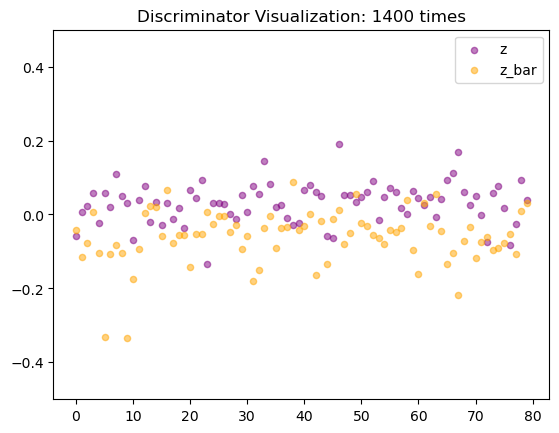

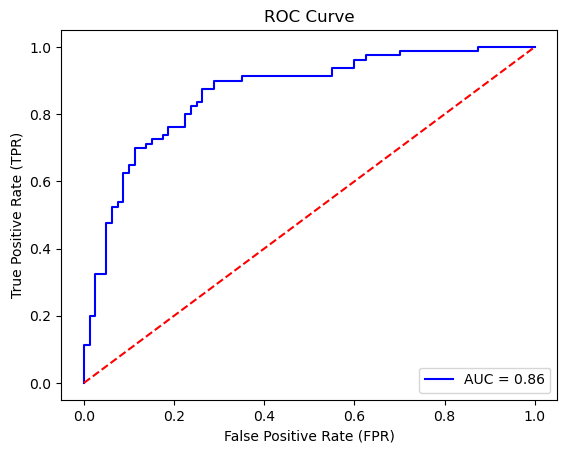

[iter: 1400]
train_ae_nl_src: 1.478235, train_ae_nl_tgt: 2.412063
train_discr: -0.126370, train_ae_by_discr: 0.089545
******************** source sample ********************
[original    ]: the have good sports, great music and cheap beer!
[generate_ori]: the have good sports, great music and cheap beer!
[generate_tst]: the have good sports, great music and cheap beer! 

[original    ]: i'm impressed with how fast they can make the food.
[generate_ori]: i'm impressed with how fast they can make the food.
[generate_tst]: i'm impressed with how fast they can make the food. 

[original    ]: very friendly people!
[generate_ori]: very friendly people!
[generate_tst]: very friendly people! 

[original    ]: i love the staff here as well.
[generate_ori]: i love the staff here as well.
[generate_tst]: i love the staff here as well. 

******************** target sample ********************
[original    ]: the exam was decent, but after that it went downhill!
[generate_ori]: the exam was decent

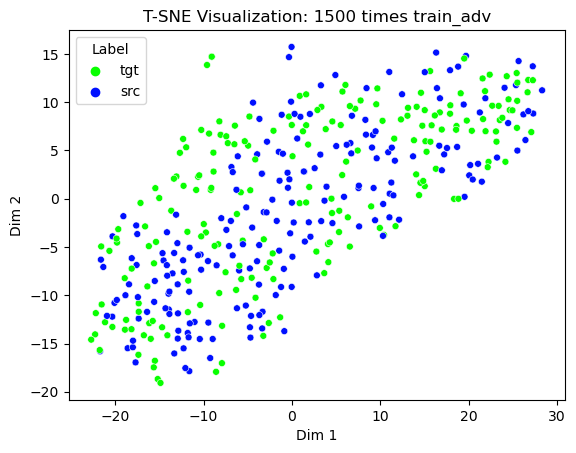

데이터 전체 개수: 160


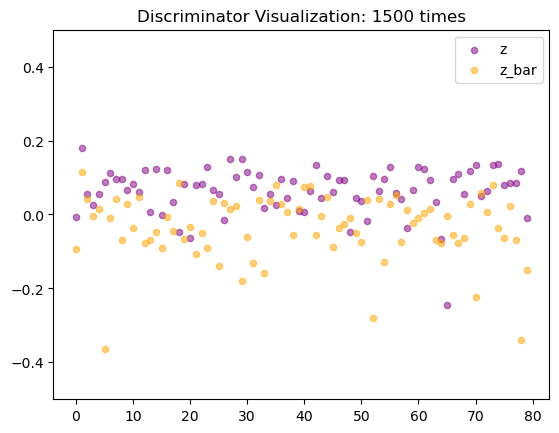

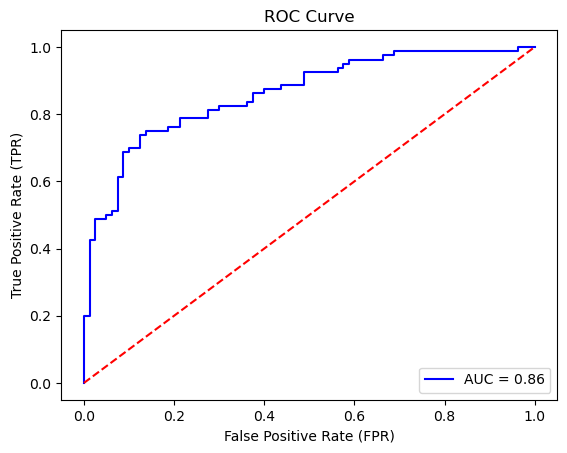

[iter: 1500]
train_ae_nl_src: 1.825898, train_ae_nl_tgt: 1.366955
train_discr: -0.099533, train_ae_by_discr: 0.066276
******************** source sample ********************
[original    ]: best place in phx.
[generate_ori]: best place in phx.
[generate_tst]: best place in phx. 

[original    ]: will continue to go here for my chickens needs.
[generate_ori]: will continue to go here for my chickens needs.
[generate_tst]: will continue to go here for my chickens needs. 

[original    ]: great place with lots of compassion for animals.
[generate_ori]: great place with lots of compassion for animals.
[generate_tst]: great place with lots of compassion for animals. 

[original    ]: they have great specials and prices are very reasonable.
[generate_ori]: they have great specials and prices are very reasonable.
[generate_tst]: they have great specials and prices are very reasonable. 

******************** target sample ********************
[original    ]: are you freaking kidding me?
[gener

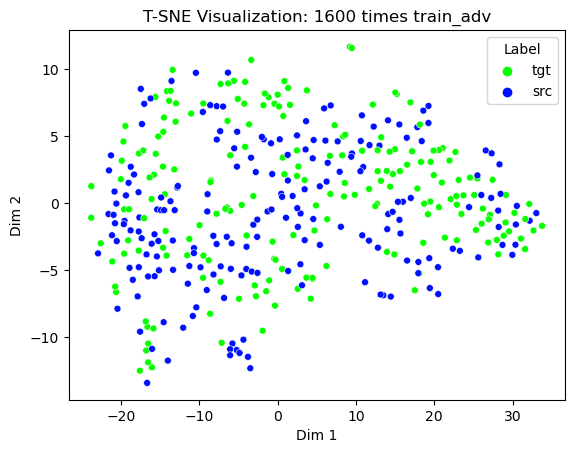

데이터 전체 개수: 160


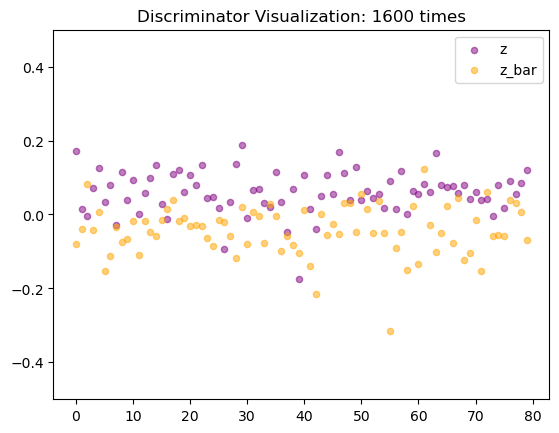

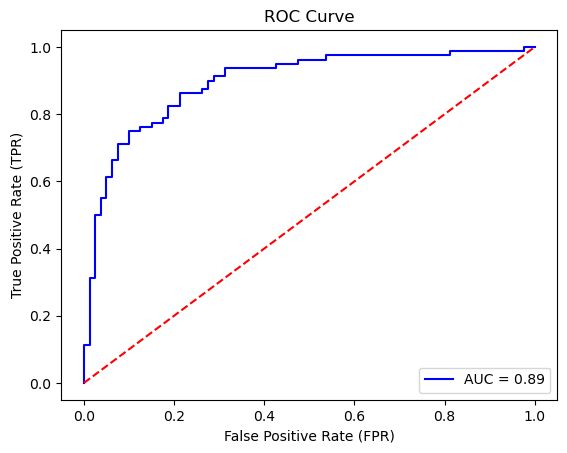

[iter: 1600]
train_ae_nl_src: 1.528835, train_ae_nl_tgt: 1.569769
train_discr: -0.123340, train_ae_by_discr: 0.060366
******************** source sample ********************
[original    ]: it is quiet and great to take friends.
[generate_ori]: it is quiet and great to take friends.
[generate_tst]: it is quiet and great to take friends. 

[original    ]: quaint.
[generate_ori]: quaint.
[generate_tst]: quaint. 

[original    ]: it was very good....
[generate_ori]: it was very good....
[generate_tst]: it was very good.... 

[original    ]: they have several really great salsas.
[generate_ori]: they have several really great salsas.
[generate_tst]: they have several really great salsas. 

******************** target sample ********************
[original    ]: that's too bad.
[generate_ori]: that's too bad.
[generate_tst]: that's too bad. 

[original    ]: i guess everyone is so used to their mcdonalds and microwave dinners.
[generate_ori]: i guess everyone is so used to their mcdonalds an

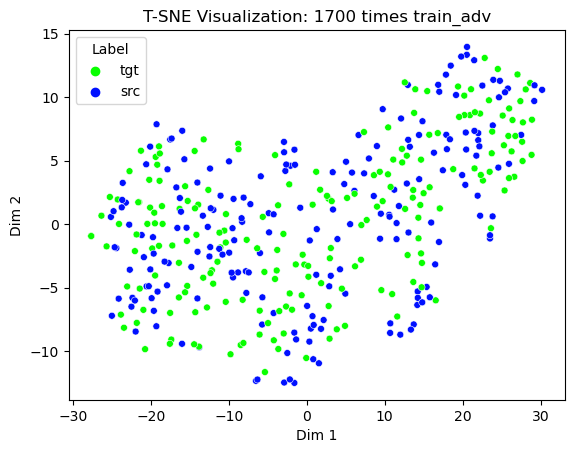

데이터 전체 개수: 160


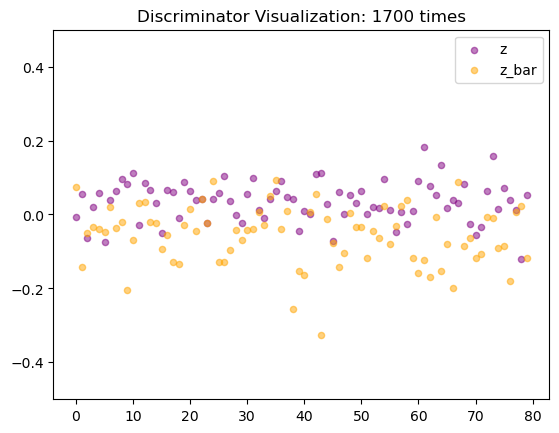

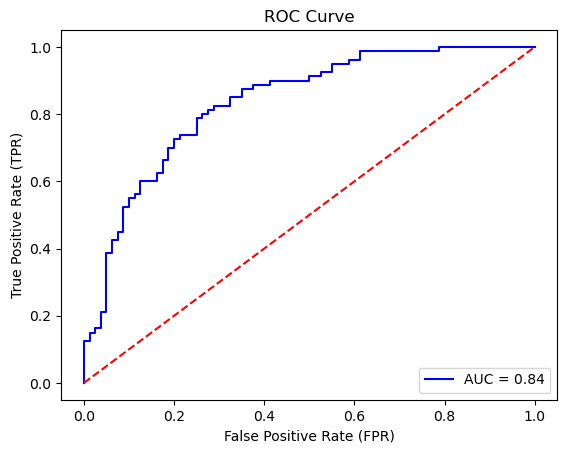

[iter: 1700]
train_ae_nl_src: 1.418652, train_ae_nl_tgt: 1.581611
train_discr: -0.080062, train_ae_by_discr: 0.064597
******************** source sample ********************
[original    ]: i'm in love with their food.
[generate_ori]: i'm in love with their food.
[generate_tst]: i'm in love with their food. 

[original    ]: it's pretty decent and the food is great.
[generate_ori]: it's pretty decent and the food is great.
[generate_tst]: it's pretty decent and the food is great. 

[original    ]: it's a favorite for my family!
[generate_ori]: it's a favorite for my family!
[generate_tst]: it's a favorite for my family! 

[original    ]: great bunch of people!
[generate_ori]: great bunch of people!
[generate_tst]: great bunch of people! 

******************** target sample ********************
[original    ]: place is in desperate need of some renovation.
[generate_ori]: place is in desperate need of some renovation.
[generate_tst]: place is in desperate need of some renovation. 

[ori

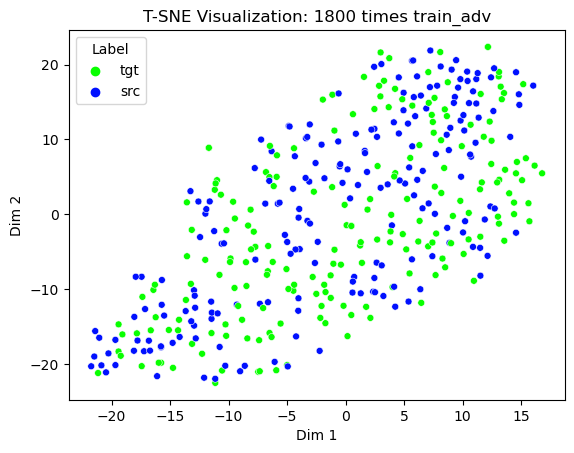

데이터 전체 개수: 160


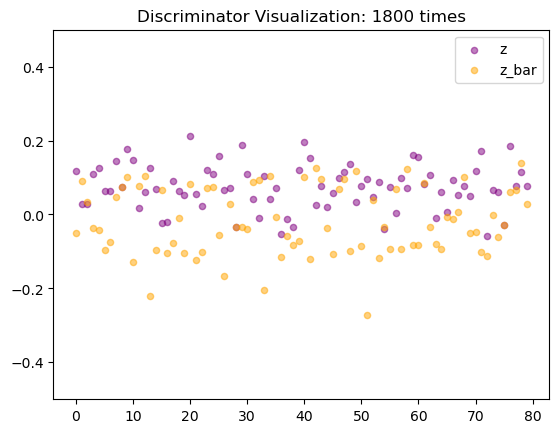

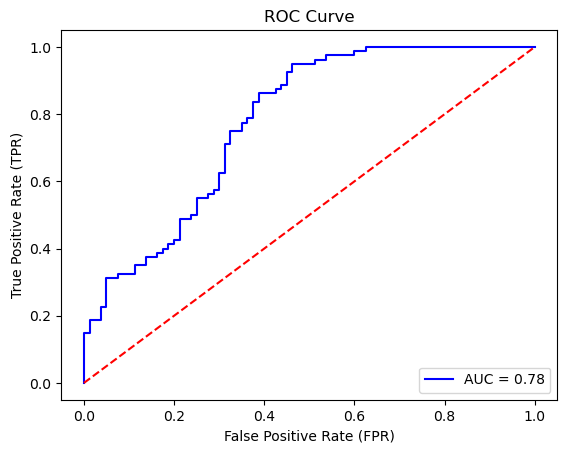

[iter: 1800]
train_ae_nl_src: 1.938141, train_ae_nl_tgt: 1.610325
train_discr: -0.085644, train_ae_by_discr: 0.097884
******************** source sample ********************
[original    ]: will definitely be back.
[generate_ori]: will definitely be back.
[generate_tst]: will definitely be back. 

[original    ]: this store has a great staff!
[generate_ori]: this store has a great staff!
[generate_tst]: this store has a great staff! 

[original    ]: really love this place.
[generate_ori]: really love this place.
[generate_tst]: really love this place. 

[original    ]: best place for eyebrows!
[generate_ori]: best place for eyebrows!
[generate_tst]: best place for eyebrows! 

******************** target sample ********************
[original    ]: bathrooms were disgusting.
[generate_ori]: bathrooms were disgusting.
[generate_tst]: bathrooms were disgusting. 

[original    ]: no problem, i 'll take my business somewhere else.
[generate_ori]: no problem, i 'll take my business somewhere

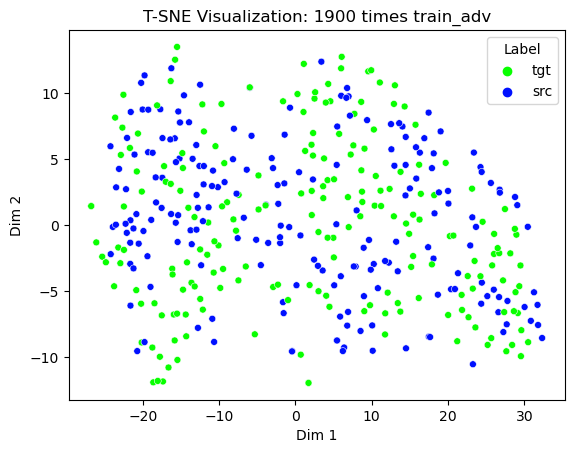

데이터 전체 개수: 160


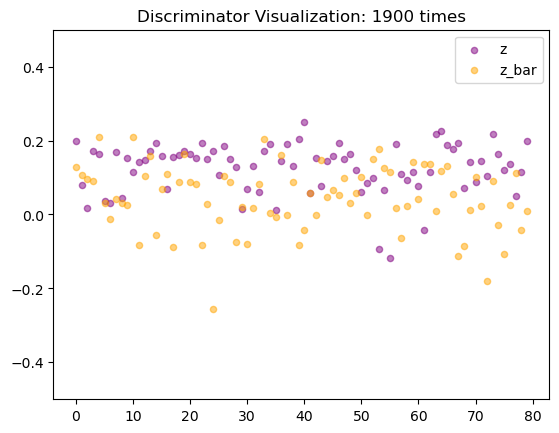

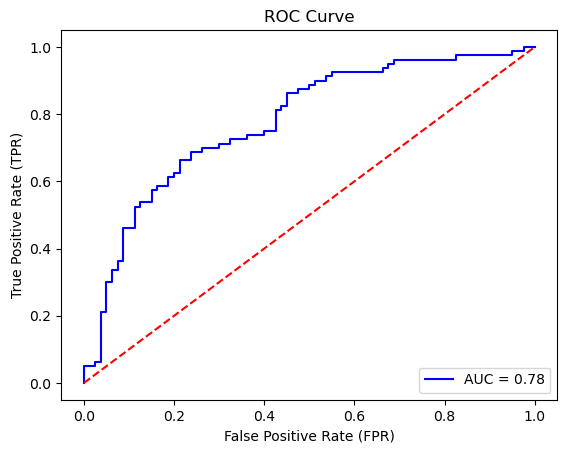

[iter: 1900]
train_ae_nl_src: 1.839631, train_ae_nl_tgt: 1.110217
train_discr: -0.075645, train_ae_by_discr: 0.043170
******************** source sample ********************
[original    ]: love it!
[generate_ori]: love it!
[generate_tst]: love it! 

[original    ]: great local business, the food is always great.
[generate_ori]: great local business, the food is always great.
[generate_tst]: great local business, the food is always great. 

[original    ]: francisco was wonderful.
[generate_ori]: francisco was wonderful.
[generate_tst]: francisco was wonderful. 

[original    ]: it does help out with you have children.
[generate_ori]: it does help with with you have children.
[generate_tst]: it does help out with you have children. 

******************** target sample ********************
[original    ]: how absurd!
[generate_ori]: how absurd!
[generate_tst]: how absurd! 

[original    ]: the server nikki was awful, the food was mediocre at best.
[generate_ori]: the server nikki was aw

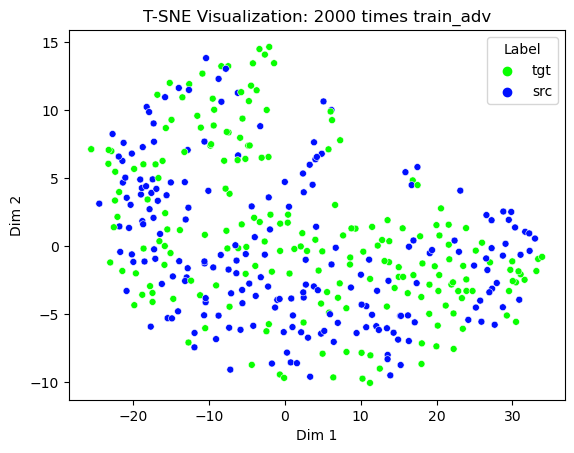

데이터 전체 개수: 160


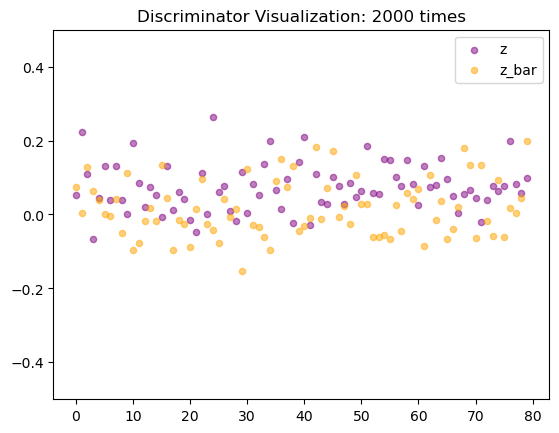

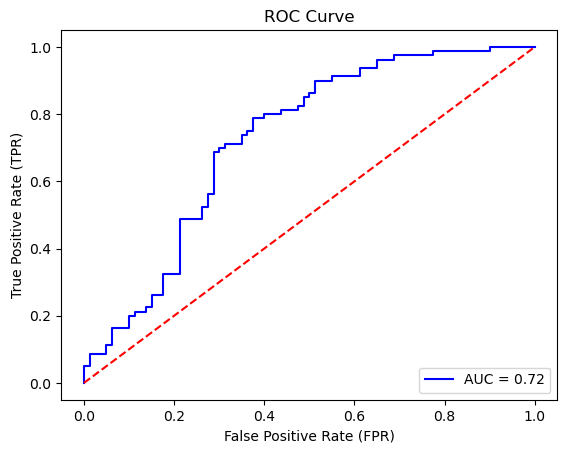

[iter: 2000]
train_ae_nl_src: 1.584887, train_ae_nl_tgt: 1.494547
train_discr: 0.014588, train_ae_by_discr: 0.121777
******************** source sample ********************
[original    ]: on top of that the steak here is excellent!
[generate_ori]: on top of that the steak here is excellent!
[generate_tst]: on top of that the steak here is excellent! 

[original    ]: as well as the other employees there.
[generate_ori]: as well as the other employees there.
[generate_tst]: as well as the other employees there. 

[original    ]: also have good specials and great customer service.
[generate_ori]: also have good specials and great customer service.
[generate_tst]: also have good specials and great customer service. 

[original    ]: i absolutely love this place!
[generate_ori]: i absolutely love this place!
[generate_tst]: i absolutely love this place! 

******************** target sample ********************
[original    ]: i was so very disappointed.
[generate_ori]: i was so very disap

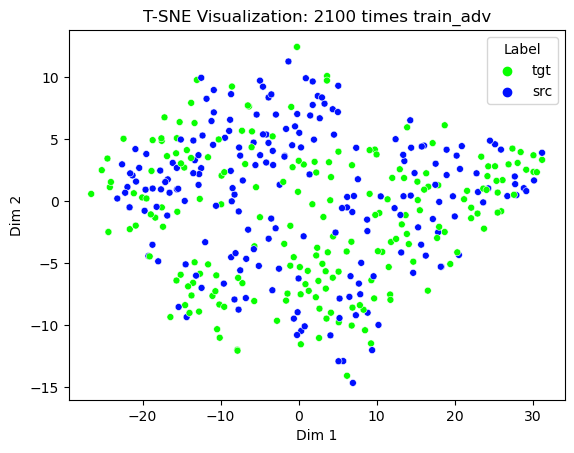

데이터 전체 개수: 160


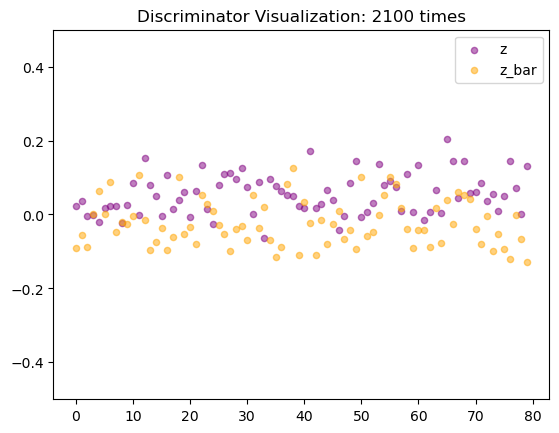

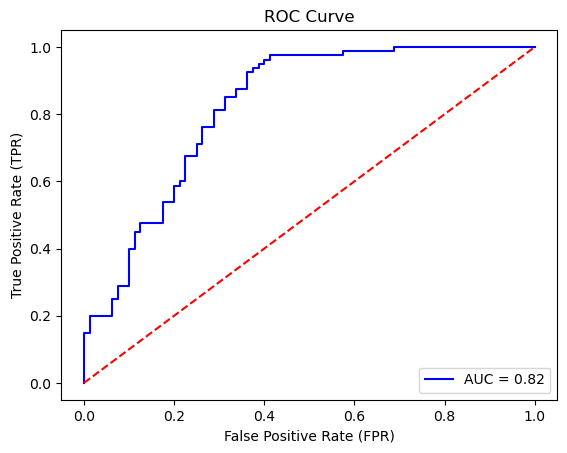

[iter: 2100]
train_ae_nl_src: 1.634183, train_ae_nl_tgt: 1.292547
train_discr: 0.007199, train_ae_by_discr: 0.020113
******************** source sample ********************
[original    ]: the place is nicely decorated, clean, and cozy.
[generate_ori]: the place is nicely decorated, clean, and cozy.
[generate_tst]: the place is nicely decorated, clean, and cozy. 

[original    ]: best place in town for a great burger and fries!
[generate_ori]: best place in town for a great burger and fries!
[generate_tst]: best place in town for a great burger and fries! 

[original    ]: everything is delicious from the soup to the pitas!
[generate_ori]: everything is delicious from the soup to the pitas!
[generate_tst]: everything is delicious from the soup to the pitas! 

[original    ]: everyone in the salon is amazing!
[generate_ori]: everyone in the salon is amazing!
[generate_tst]: everyone in the salon is amazing! 

******************** target sample ********************
[original    ]: i tell

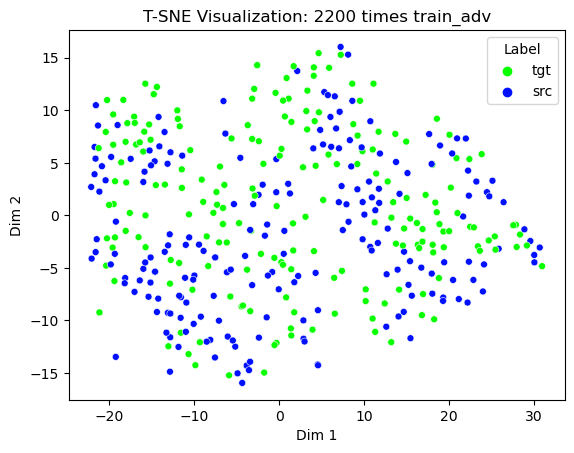

데이터 전체 개수: 160


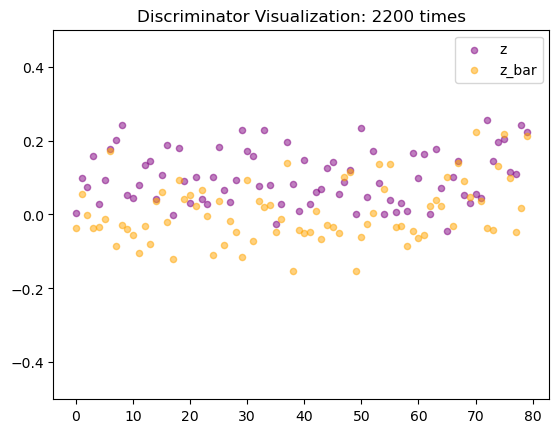

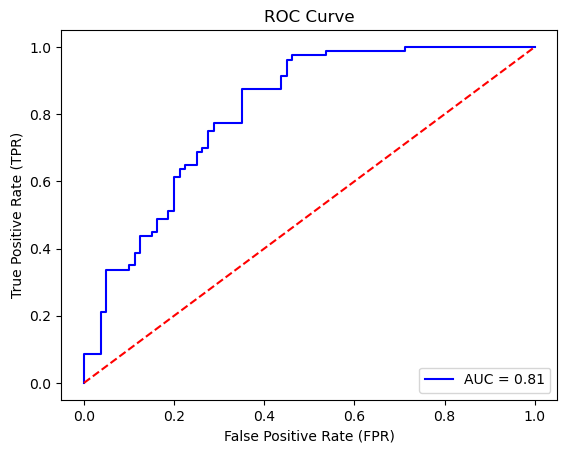

[iter: 2200]
train_ae_nl_src: 1.586322, train_ae_nl_tgt: 1.336886
train_discr: -0.070821, train_ae_by_discr: -0.006766
******************** source sample ********************
[original    ]: food is great!
[generate_ori]: food is great!
[generate_tst]: food is great! 

[original    ]: old school deli that has amazing food.
[generate_ori]: old school deli that has amazing food.
[generate_tst]: old school deli that has amazing food. 

[original    ]: and this restaurant hits all those dishes with top marks.
[generate_ori]: and this restaurant hits all those dishes with top marks.
[generate_tst]: and this restaurant hits all those dishes with top marks. 

[original    ]: the staff is always attentive certainly not friendly.
[generate_ori]: the staff is always attentive certainly not friendly.
[generate_tst]: the staff is always attentive certainly not friendly. 

******************** target sample ********************
[original    ]: you won't get good sleep due to being worried about you

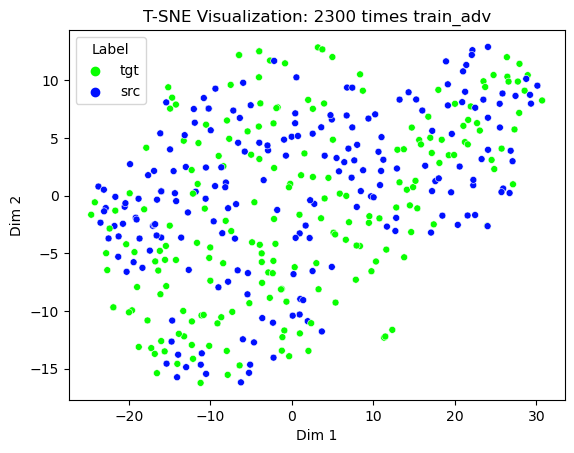

데이터 전체 개수: 160


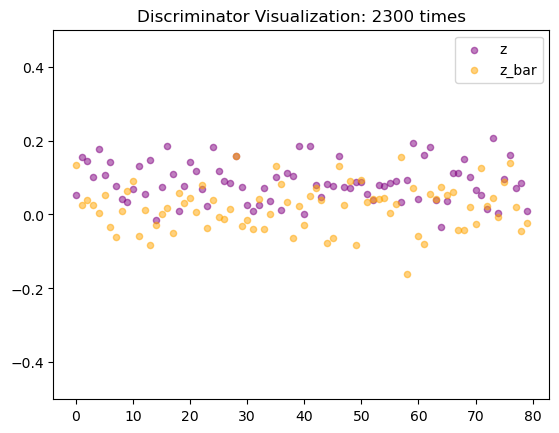

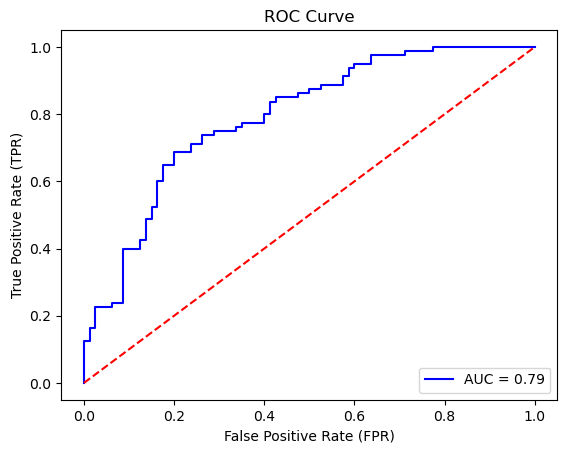

[iter: 2300]
train_ae_nl_src: 1.330902, train_ae_nl_tgt: 1.684487
train_discr: -0.047204, train_ae_by_discr: 0.092147
******************** source sample ********************
[original    ]: the food is absolutely delicious and you can't beat the price.
[generate_ori]: the food is absolutely delicious and you can't beat the price.
[generate_tst]: the food is absolutely delicious and you can't beat the price. 

[original    ]: love this place.
[generate_ori]: love this place.
[generate_tst]: love this place. 

[original    ]: one of our family favorites.
[generate_ori]: one of our family favorites.
[generate_tst]: one of our family favorites. 

[original    ]: always a good thing.
[generate_ori]: always a good thing.
[generate_tst]: always a good thing. 

******************** target sample ********************
[original    ]: it wasn't terrible, but it wasn't pleasant.
[generate_ori]: it wasn't terrible, but it wasn't pleasant.
[generate_tst]: it wasn't terrible, but it wasn't pleasant. 

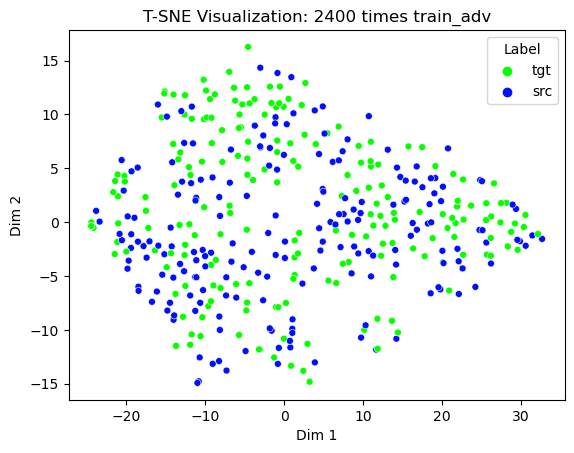

데이터 전체 개수: 160


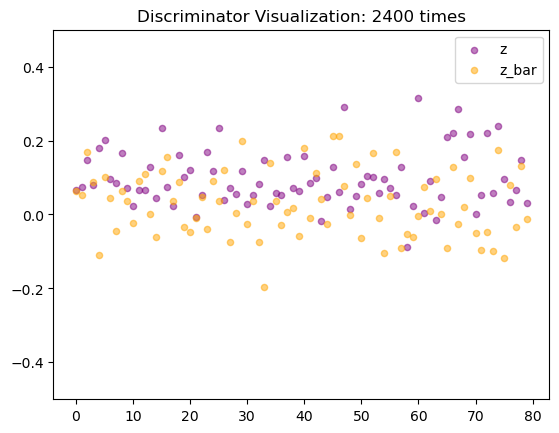

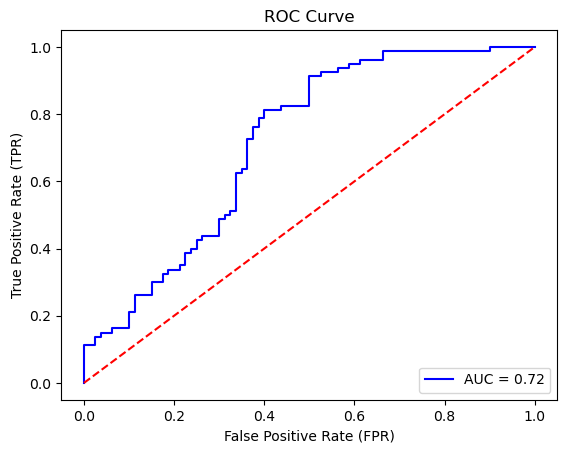

[iter: 2400]
train_ae_nl_src: 1.242429, train_ae_nl_tgt: 1.608867
train_discr: -0.098518, train_ae_by_discr: 0.056665
******************** source sample ********************
[original    ]: so close to my house, i 'll definitely become a regular!
[generate_ori]: so close to my house, i 'll definitely become a regular!
[generate_tst]: so close to my house, i 'll definitely become a regular! 

[original    ]: the food is very fresh.
[generate_ori]: the food is very fresh.
[generate_tst]: the food is very fresh. 

[original    ]: its a great course, some beautiful views and amazing holes.
[generate_ori]: its a great course, some beautiful views and amazing holes.
[generate_tst]: its a great course, some beautiful views and amazing holes. 

[original    ]: the food is delicious and the staff is attentive to our needs.
[generate_ori]: the food is delicious and the staff is attentive to our needs.
[generate_tst]: the food is delicious and the staff is attentive to our needs. 

**************

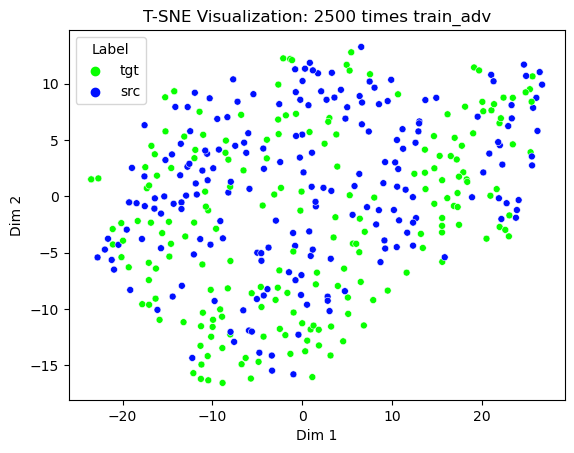

데이터 전체 개수: 160


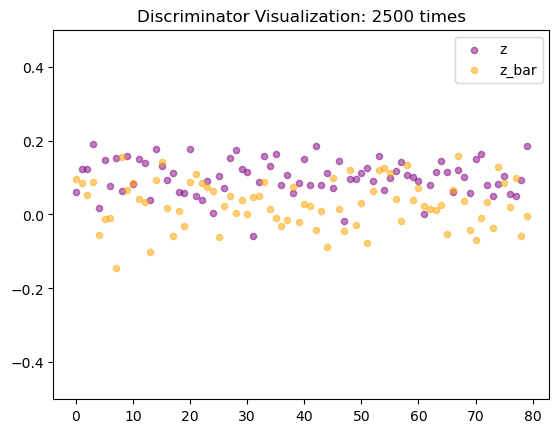

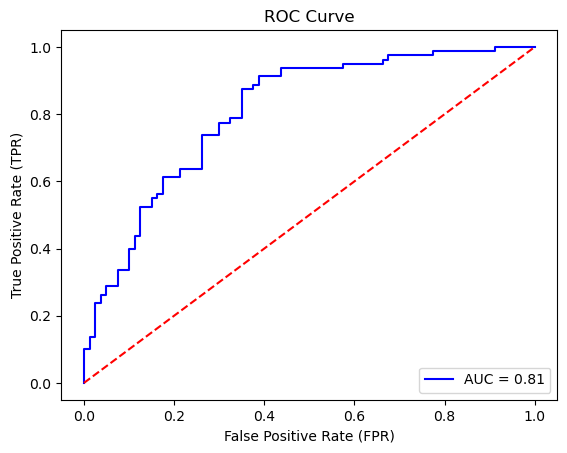

[iter: 2500]
train_ae_nl_src: 1.425730, train_ae_nl_tgt: 1.279355
train_discr: -0.010379, train_ae_by_discr: 0.061578
******************** source sample ********************
[original    ]: the girls who work in the office are very sweet and helpful.
[generate_ori]: the girls who work in the office are very sweet and helpful.
[generate_tst]: the girls who work in the office are very sweet and helpful. 

[original    ]: me and my wife come here all the time on special occasions.
[generate_ori]: me and my wife come here all the time on special occasions.
[generate_tst]: me and my wife come here all the time on special occasions. 

[original    ]: this place is awsome!
[generate_ori]: this place is awsome!
[generate_tst]: this place is awsome! 

[original    ]: always clean and tables wiped down.
[generate_ori]: always clean and tables wiped down.
[generate_tst]: always clean and tables wiped down. 

******************** target sample ********************
[original    ]: having to wait a 

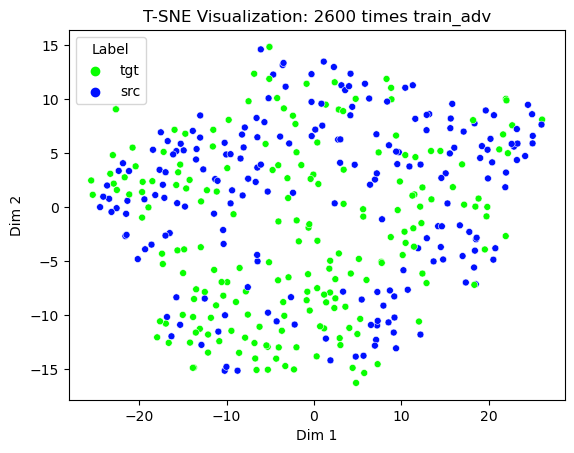

데이터 전체 개수: 160


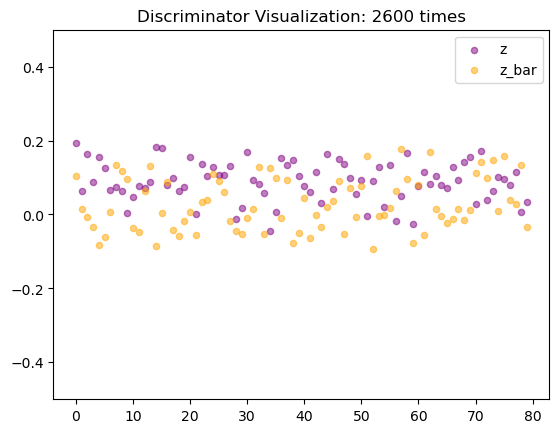

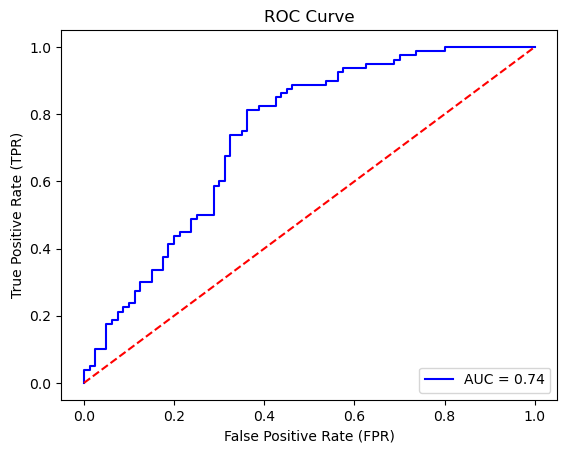

[iter: 2600]
train_ae_nl_src: 1.684085, train_ae_nl_tgt: 1.375483
train_discr: -0.026100, train_ae_by_discr: 0.051096
******************** source sample ********************
[original    ]: foods delicious and very affordable.
[generate_ori]: foods delicious and very affordable.
[generate_tst]: foods delicious and very affordable. 

[original    ]: i always say communication is the best way to get what you want!
[generate_ori]: i always say communication is the best way to get what you want!
[generate_tst]: i always say communication is the best way to get what you want! 

[original    ]: the food is always hot and fresh.
[generate_ori]: the food is always hot and fresh.
[generate_tst]: the food is always hot and fresh. 

[original    ]: great staff - funny old timer men sitting at the bar.
[generate_ori]: great staff - funny old timer men sitting at the bar.
[generate_tst]: great staff - funny old timer men sitting at the bar. 

******************** target sample ********************


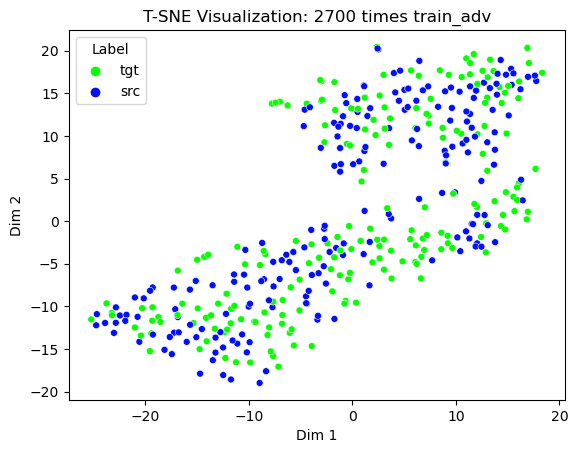

데이터 전체 개수: 160


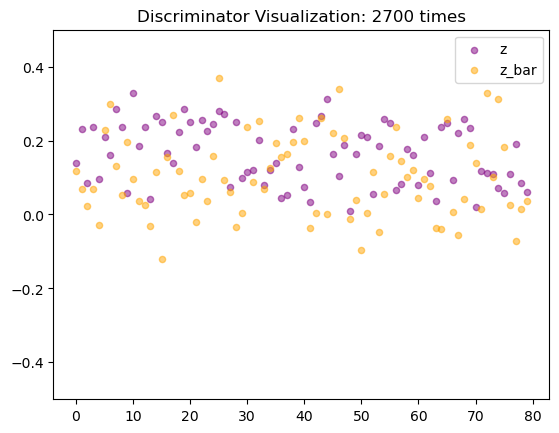

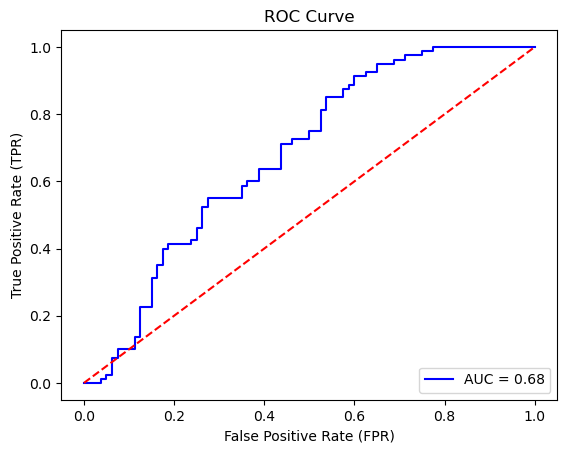

[iter: 2700]
train_ae_nl_src: 1.327605, train_ae_nl_tgt: 1.510611
train_discr: -0.049811, train_ae_by_discr: 0.093680
******************** source sample ********************
[original    ]: service - top notch.
[generate_ori]: service - top notch.
[generate_tst]: service - top notch. 

[original    ]: they know their stuff about the horses and the area and they're authentic.
[generate_ori]: they know their stuff about the horses and the area and they're authentic.
[generate_tst]: they know their stuff about the horses and the area and they're authentic. 

[original    ]: my new favorite restaurant!
[generate_ori]: my new favorite restaurant!
[generate_tst]: my new favorite restaurant! 

[original    ]: you gave to try their wings so good.
[generate_ori]: you gave to try their wings so good.
[generate_tst]: you gave to try their wings so good. 

******************** target sample ********************
[original    ]: _num_ and a half hours for a quoted _num_ min oil change.
[generate_ori

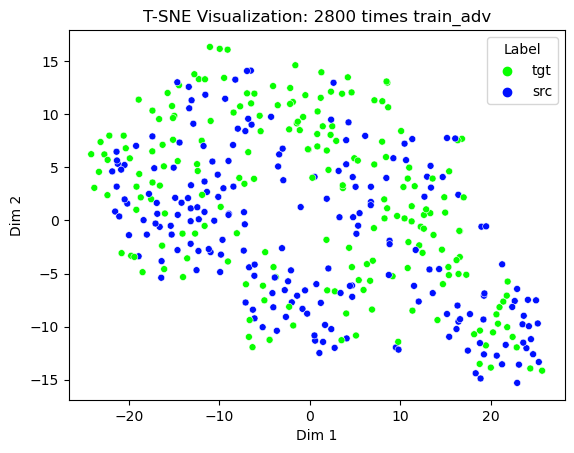

데이터 전체 개수: 160


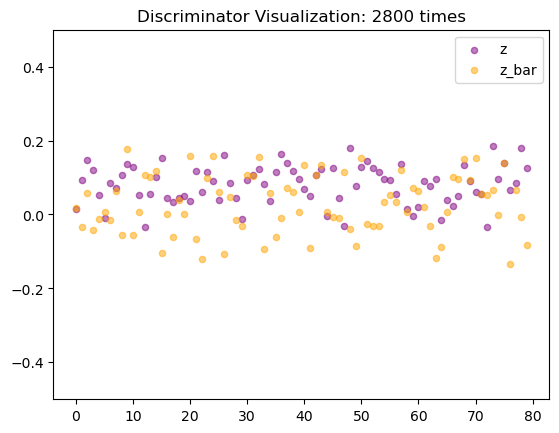

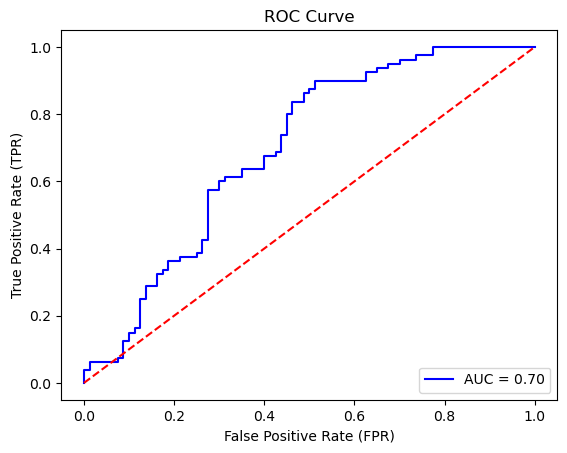

[iter: 2800]
train_ae_nl_src: 1.289689, train_ae_nl_tgt: 1.451046
train_discr: -0.092114, train_ae_by_discr: 0.058349
******************** source sample ********************
[original    ]: Neutral
[generate_ori]: Neutral
[generate_tst]: Neutral 

[original    ]: i highly recomend!
[generate_ori]: i highly recomend!
[generate_tst]: i highly recomend! 

[original    ]: deli also has a good variety of meats.
[generate_ori]: deli also has a good variety of meats.
[generate_tst]: deli also has a good variety of meats. 

[original    ]: i always order it when i go there and it is always awesome.
[generate_ori]: i always order it when i go there and it is always awesome.
[generate_tst]: i always order it when i go there and it is always awesome. 

******************** target sample ********************
[original    ]: he was extremely rude, and he hung up on me!
[generate_ori]: he was extremely rude, and he hung up on me!
[generate_tst]: he was extremely rude, and he hung up on me! 

[origin

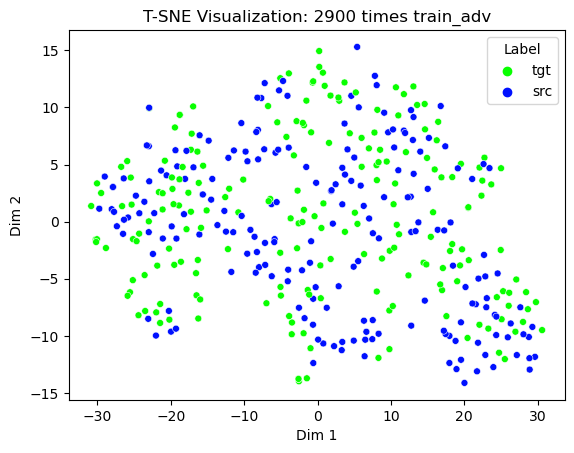

데이터 전체 개수: 160


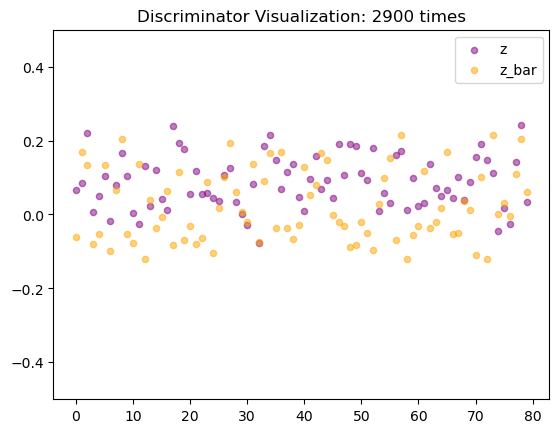

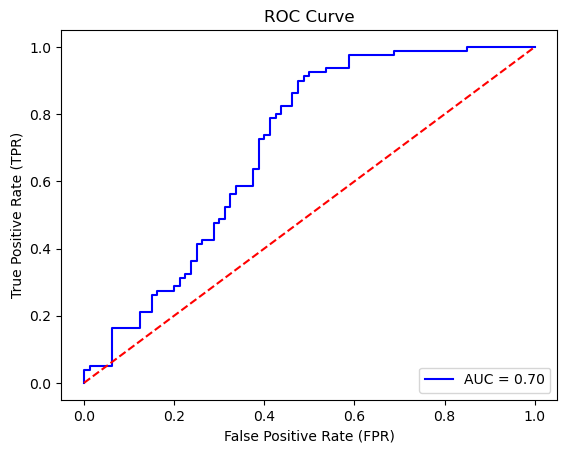

[iter: 2900]
train_ae_nl_src: 1.635341, train_ae_nl_tgt: 1.279070
train_discr: -0.068232, train_ae_by_discr: 0.046157
******************** source sample ********************
[original    ]: it's a beautiful location with a real focus on animals of all kinds.
[generate_ori]: it's a beautiful location with a real focus on animals of all kinds.
[generate_tst]: it's a beautiful location with a real focus on animals of all kinds. 

[original    ]: staff was very attentive and friendly, and the restaurant was extremely inviting.
[generate_ori]: staff was very attentive and friendly, and the restaurant was extremely inviting.
[generate_tst]: staff was very attentive and friendly, and the restaurant was extremely inviting. 

[original    ]: i ordered the bosnian sausage and was good.
[generate_ori]: i ordered the bosnian sausage and was good.
[generate_tst]: i ordered the bosnian sausage and was good. 

[original    ]: i've been coming for many many years and they have the best wings.
[generat

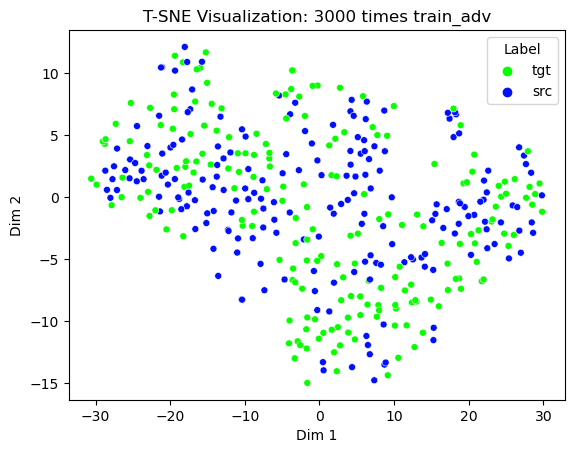

데이터 전체 개수: 160


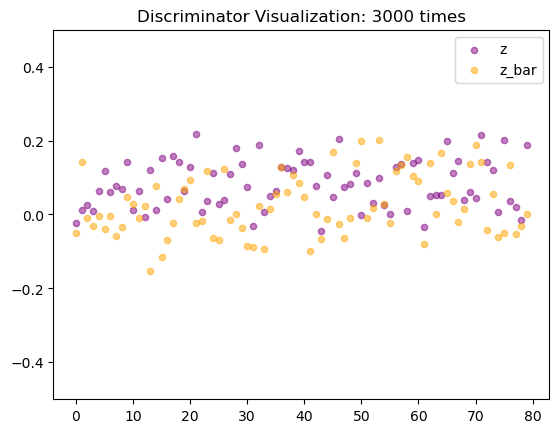

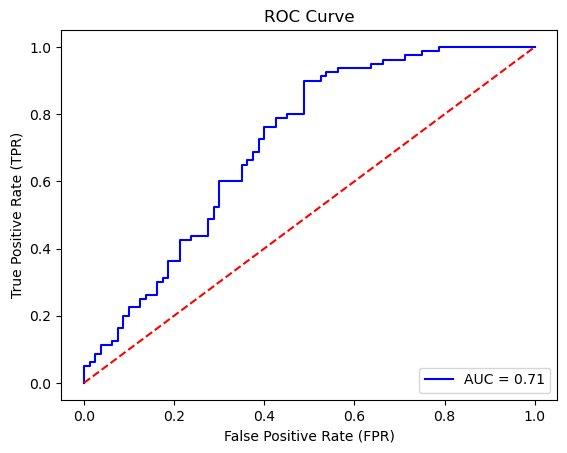

[iter: 3000]
train_ae_nl_src: 1.230123, train_ae_nl_tgt: 1.410100
train_discr: -0.028924, train_ae_by_discr: 0.064464
******************** source sample ********************
[original    ]: we also had turkish coffee... it blew my mind.
[generate_ori]: we also had turkish coffee... it blew my mind.
[generate_tst]: we also had turkish coffee... it blew my mind. 

[original    ]: great wall buffet is an excellent value!
[generate_ori]: great wall buffet is an excellent value!
[generate_tst]: great wall buffet is an excellent value! 

[original    ]: the food is very fresh.
[generate_ori]: the food is very fresh.
[generate_tst]: the food is very fresh. 

[original    ]: they welcome you with open arms and are always there when your in need.
[generate_ori]: they welcome you with open arms and are always there when your in need.
[generate_tst]: they welcome you with open arms and are always there when your in need. 

******************** target sample ********************
[original    ]: i'

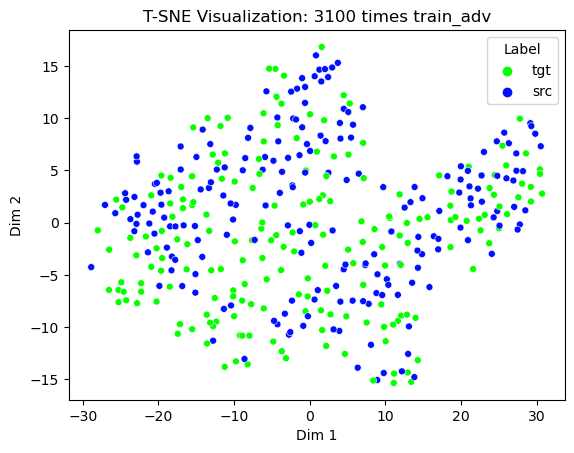

데이터 전체 개수: 160


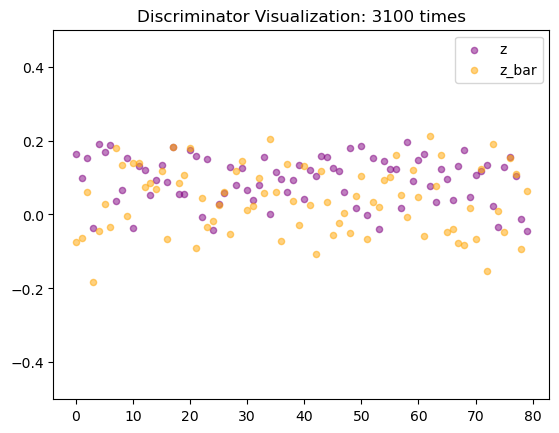

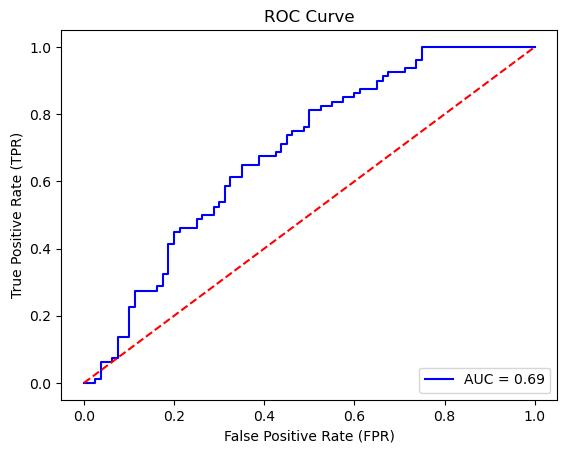

[iter: 3100]
train_ae_nl_src: 1.132469, train_ae_nl_tgt: 1.594629
train_discr: -0.053824, train_ae_by_discr: 0.010040
******************** source sample ********************
[original    ]: the place is definitely divey, but it was pretty spotless.
[generate_ori]: the place is definitely divey, but it was pretty spotless.
[generate_tst]: the place is definitely divey, but it was pretty spotless. 

[original    ]: the prices are pretty cheap and the food is flavorful and traditional.
[generate_ori]: the prices are pretty cheap and the food is flavorful and traditional.
[generate_tst]: the prices are pretty cheap and the food is flavorful and traditional. 

[original    ]: highly recommended.
[generate_ori]: highly recommended.
[generate_tst]: highly recommended. 

[original    ]: i am definitely a fan!
[generate_ori]: i am definitely a fan!
[generate_tst]: i am definitely a fan! 

******************** target sample ********************
[original    ]: got to the room and it had a horrib

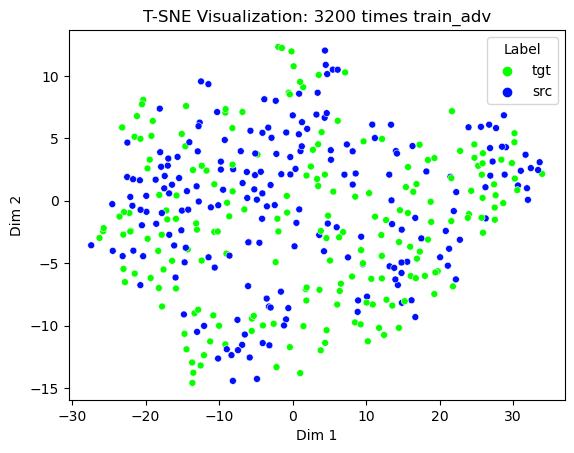

데이터 전체 개수: 160


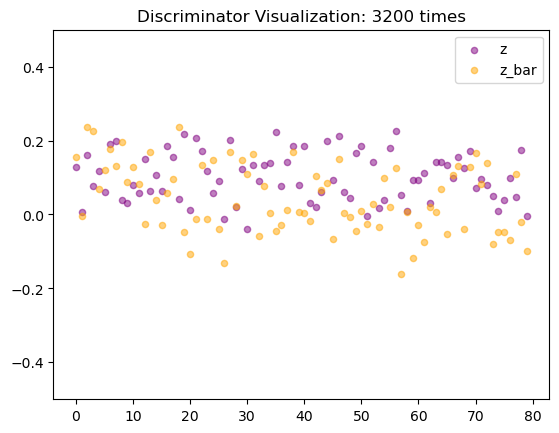

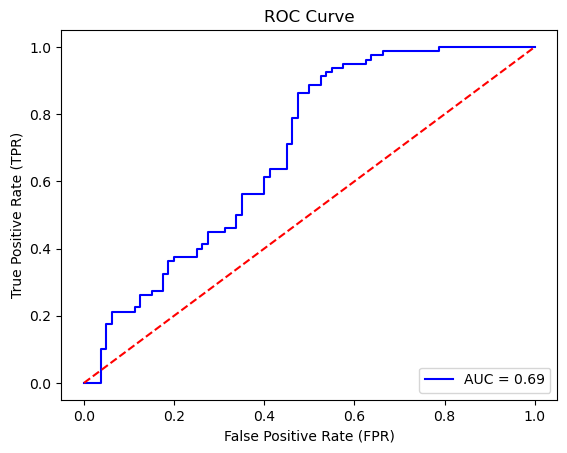

[iter: 3200]
train_ae_nl_src: 1.377277, train_ae_nl_tgt: 1.478275
train_discr: -0.053668, train_ae_by_discr: 0.061157
******************** source sample ********************
[original    ]: dr ho is the best dr i could have asked for.
[generate_ori]: dr ho is the best dr i could have asked for.
[generate_tst]: dr ho is the best dr i could have asked for. 

[original    ]: the prices are reasonable and even better when you get their earlier.
[generate_ori]: the prices are reasonable and even better when you get their earlier.
[generate_tst]: the prices are reasonable and even better when you get their earlier. 

[original    ]: we both love it!
[generate_ori]: we both love it!
[generate_tst]: we both love it! 

[original    ]: the hot sauce is even better!
[generate_ori]: the hot sauce is even better!
[generate_tst]: the hot sauce is even better! 

******************** target sample ********************
[original    ]: the sandwich was dressed with a not so tasty dressing.
[generate_ori

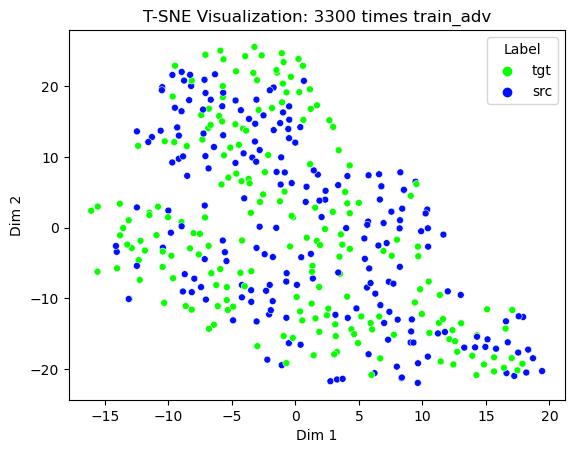

데이터 전체 개수: 160


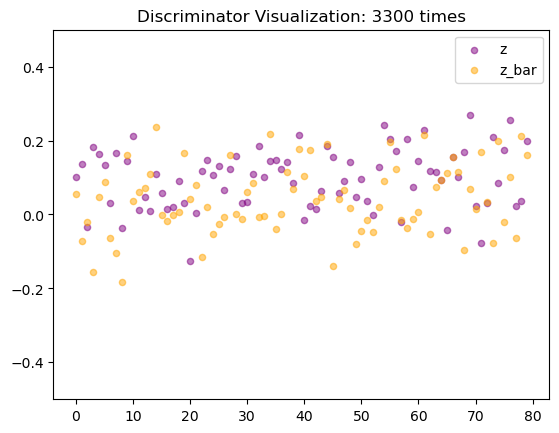

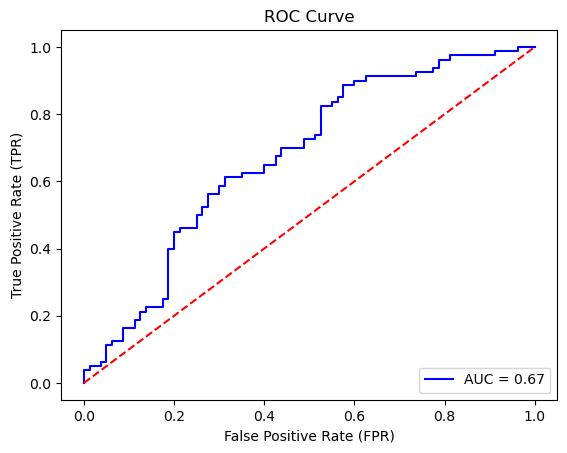

[iter: 3300]
train_ae_nl_src: 1.267675, train_ae_nl_tgt: 1.517055
train_discr: -0.027819, train_ae_by_discr: 0.042429
******************** source sample ********************
[original    ]: we made the right choice!
[generate_ori]: we made the right choice!
[generate_tst]: we made the right choice! 

[original    ]: i have played this course several times and i really enjoy it.
[generate_ori]: i have played this course several times and i really enjoy it.
[generate_tst]: i have played this course several times and i really enjoy it. 

[original    ]: friendly and fast, this location is fast food done right.
[generate_ori]: friendly and fast, this location is fast food done right.
[generate_tst]: friendly and fast, this location is fast food done right. 

[original    ]: the new course is great!
[generate_ori]: the new course is great!
[generate_tst]: the new course is great! 

******************** target sample ********************
[original    ]: my pasta was so dry that it was almost

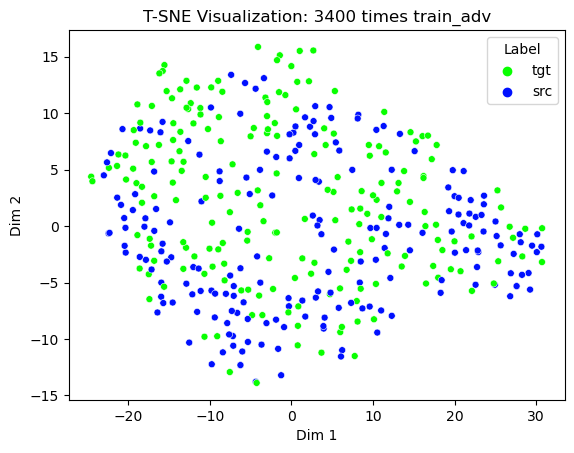

데이터 전체 개수: 160


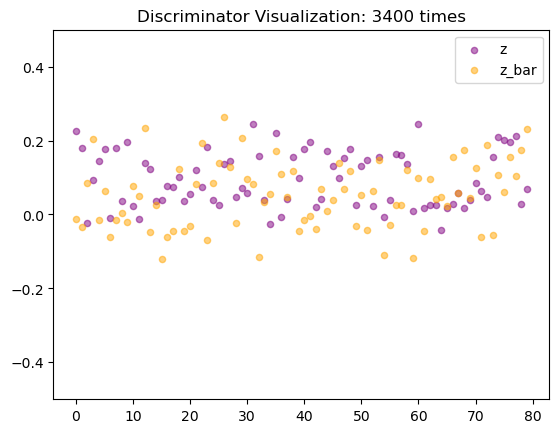

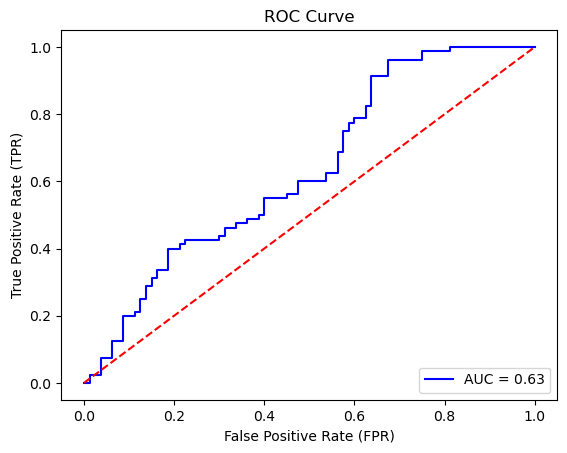

[iter: 3400]
train_ae_nl_src: 1.271640, train_ae_nl_tgt: 1.357930
train_discr: 0.028477, train_ae_by_discr: 0.077542
******************** source sample ********************
[original    ]: the food is excellent and plentiful.
[generate_ori]: the food is excellent and plentiful.
[generate_tst]: the food is excellent and plentiful. 

[original    ]: never has any issues with this place at all, always friendly and correct.
[generate_ori]: never has any issues with this place at all, always friendly and correct.
[generate_tst]: never has any issues with this place at all, always friendly and correct. 

[original    ]: not the best area, but worth the trip!
[generate_ori]: not the best area, but worth the trip!
[generate_tst]: not the best area, but worth the trip! 

[original    ]: i love the crust and their wings are great too!
[generate_ori]: i love the crust and their wings are great too!
[generate_tst]: i love the crust and their wings are great too! 

******************** target sampl

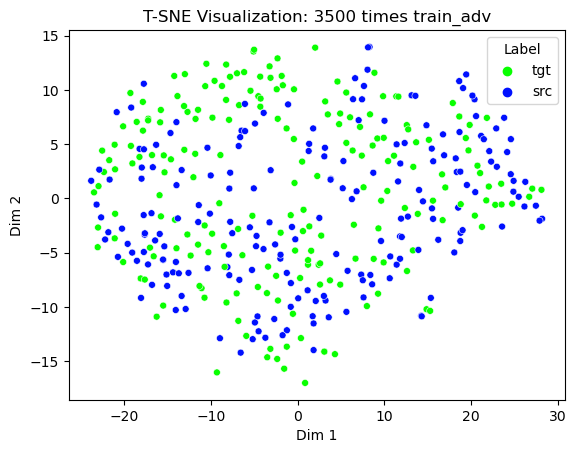

데이터 전체 개수: 160


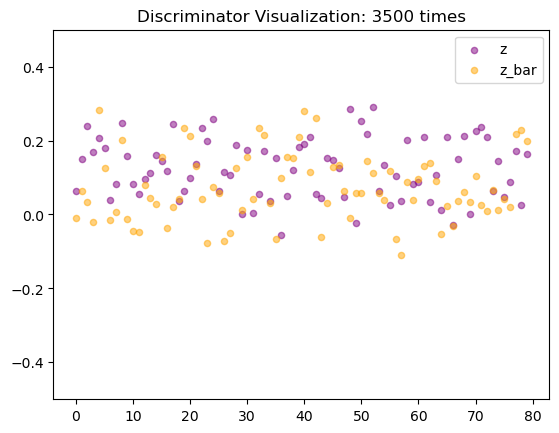

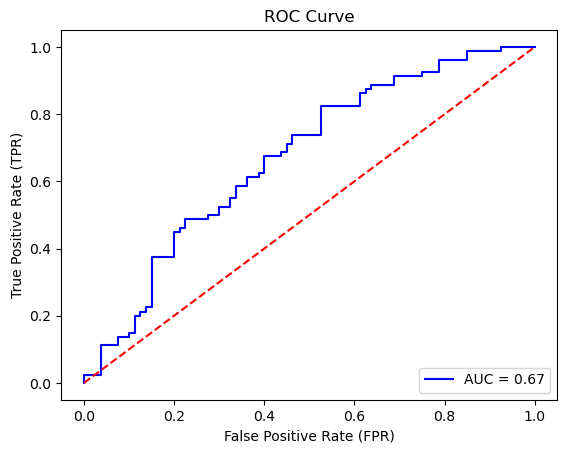

[iter: 3500]
train_ae_nl_src: 1.849788, train_ae_nl_tgt: 1.340063
train_discr: -0.078234, train_ae_by_discr: 0.045832
******************** source sample ********************
[original    ]: cashier was very friendly and always willing to help.
[generate_ori]: cashier was very friendly and always willing to help.
[generate_tst]: cashier was very friendly and always willing to help. 

[original    ]: this food is so delicious.
[generate_ori]: this food is so delicious.
[generate_tst]: this food is so delicious. 

[original    ]: they are friendly and have wonderful attitudes.
[generate_ori]: they are friendly and have wonderful attitudes.
[generate_tst]: they are friendly and have wonderful attitudes. 

[original    ]: the girls are very fast and accurate when putting orders in.
[generate_ori]: the girls are very fast and accurate when putting orders in.
[generate_tst]: the girls are very fast and accurate when putting orders in. 

******************** target sample ********************


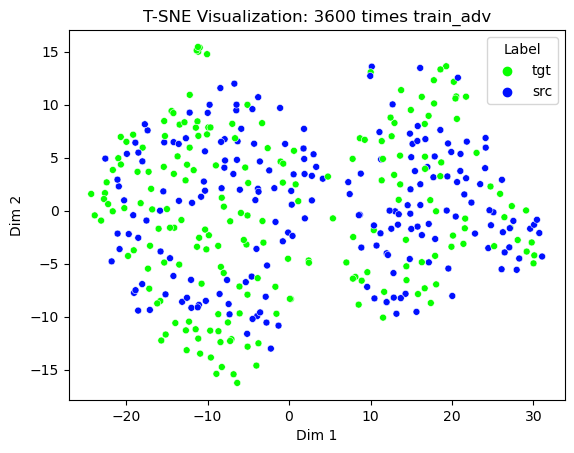

데이터 전체 개수: 160


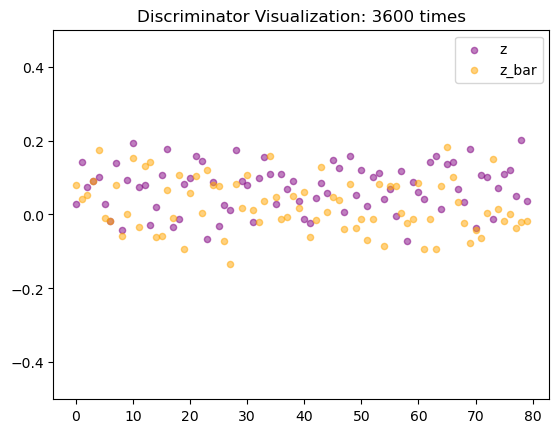

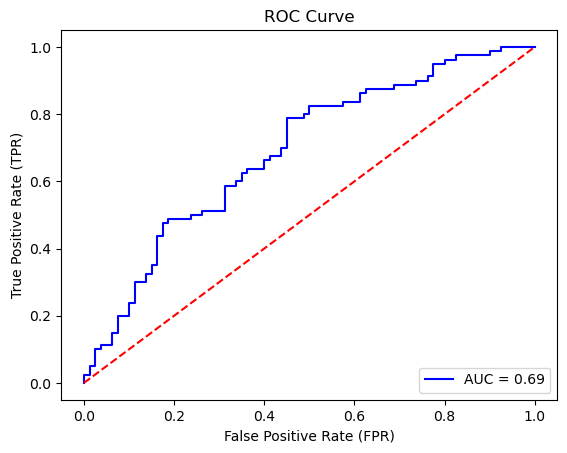

[iter: 3600]
train_ae_nl_src: 1.490184, train_ae_nl_tgt: 1.349226
train_discr: -0.025085, train_ae_by_discr: 0.058059
******************** source sample ********************
[original    ]: good service with big portion great tasting food.
[generate_ori]: good service with big portion great tasting food.
[generate_tst]: good service with big portion great tasting food. 

[original    ]: they seem to sincerely care about my cat.
[generate_ori]: they seem to sincerely care about my cat.
[generate_tst]: they seem to sincerely care about my cat. 

[original    ]: the service was fantastic.
[generate_ori]: the service was fantastic.
[generate_tst]: the service was fantastic. 

[original    ]: moved to goodyear from phoenix.
[generate_ori]: moved to goodyear from phoenix.
[generate_tst]: moved to goodyear from phoenix. 

******************** target sample ********************
[original    ]: first, the cashier clearly didn't want to be there.
[generate_ori]: first, the cashier clearly didn't

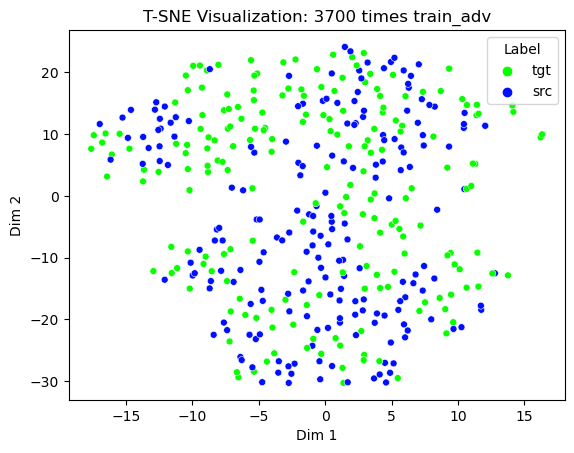

데이터 전체 개수: 160


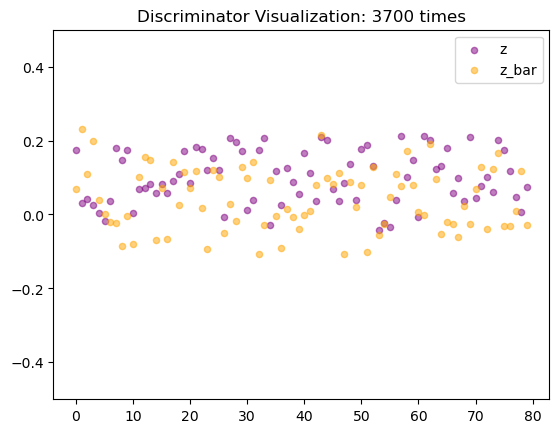

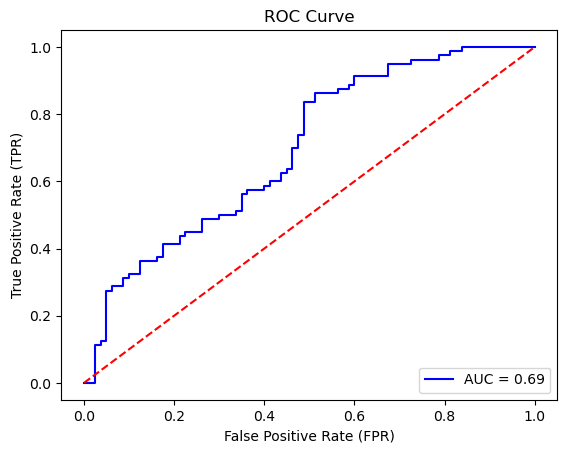

[iter: 3700]
train_ae_nl_src: 1.397033, train_ae_nl_tgt: 1.243518
train_discr: -0.050880, train_ae_by_discr: 0.072847
******************** source sample ********************
[original    ]: tvs are now bigger and better big upgrade from when i last stayed here.
[generate_ori]: tvs are now bigger and better big upgrade from when i last stayed here.
[generate_tst]: tvs are now bigger and better big upgrade from when i last stayed here. 

[original    ]: great challenge of golf especially from the tips.
[generate_ori]: great challenge of golf especially from the tips.
[generate_tst]: great challenge of golf especially from the tips. 

[original    ]: amazing milk!
[generate_ori]: amazing milk!
[generate_tst]: amazing milk! 

[original    ]: always a good thing.
[generate_ori]: always a good thing.
[generate_tst]: always a good thing. 

******************** target sample ********************
[original    ]: the lobby stinks.
[generate_ori]: the lobby stinks.
[generate_tst]: the lobby stink

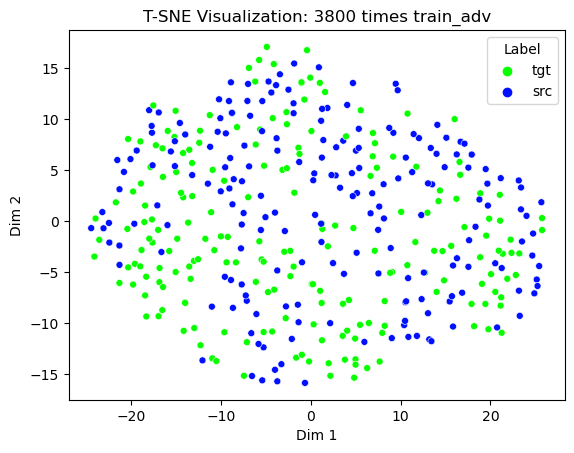

데이터 전체 개수: 160


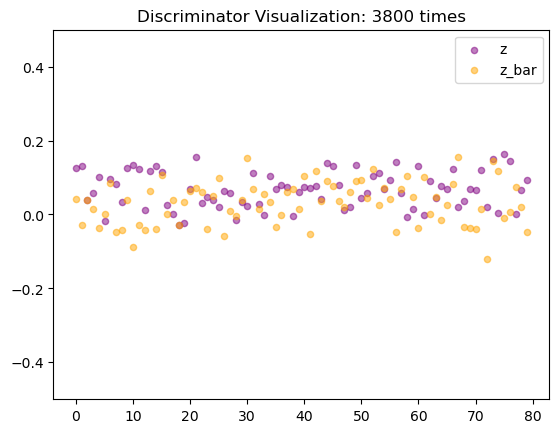

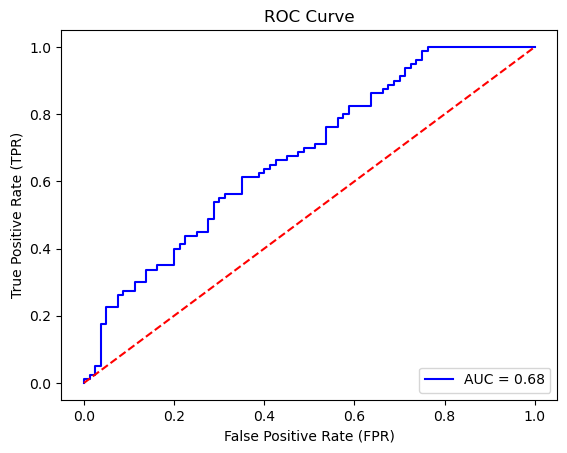

[iter: 3800]
train_ae_nl_src: 1.369490, train_ae_nl_tgt: 1.315075
train_discr: -0.068674, train_ae_by_discr: 0.032220
******************** source sample ********************
[original    ]: the food was pretty good and the servings are huge!
[generate_ori]: the food was pretty good and the servings are huge!
[generate_tst]: the food was pretty good and the servings are huge! 

[original    ]: they're food is always freshly cooked and cooked well.
[generate_ori]: they're food is always freshly cooked and cooked well.
[generate_tst]: they're food is always freshly cooked and cooked well. 

[original    ]: first time to the place & it is an awesome place for breakfast.
[generate_ori]: first time to the place & it is an awesome place for breakfast.
[generate_tst]: first time to the place & it is an awesome place for breakfast. 

[original    ]: great value and super good food.
[generate_ori]: great value and super good food.
[generate_tst]: great value and super good food. 

**************

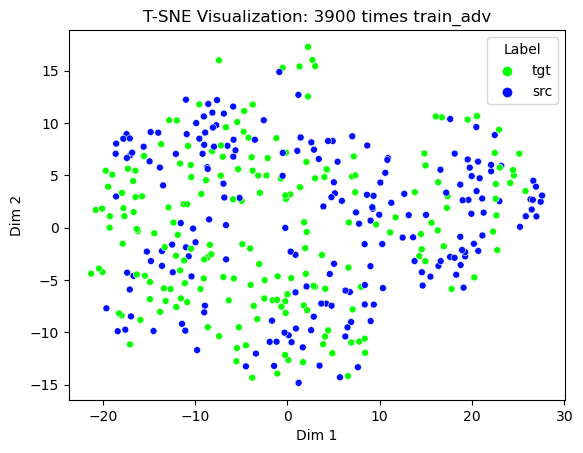

데이터 전체 개수: 160


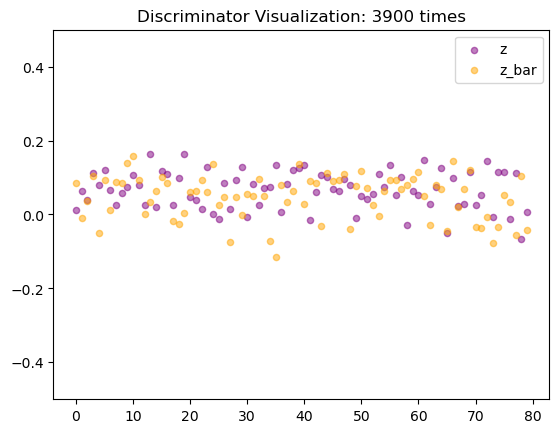

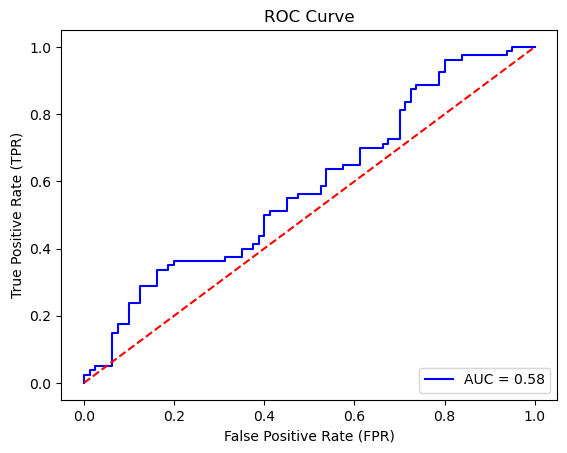

[iter: 3900]
train_ae_nl_src: 1.333143, train_ae_nl_tgt: 1.615136
train_discr: -0.070885, train_ae_by_discr: 0.045007
******************** source sample ********************
[original    ]: they have great lunch specials worth every last penny.
[generate_ori]: they have great lunch specials worth every last penny.
[generate_tst]: they have great lunch specials worth every last penny. 

[original    ]: quality and quantity is given here.
[generate_ori]: quality and quantity is given here.
[generate_tst]: quality and quantity is given here. 

[original    ]: this is the best chinese food i have tasted in a long time.
[generate_ori]: this is the best chinese food i have tasted in a long time.
[generate_tst]: this is the best chinese food i have tasted in a long time. 

[original    ]: the portions are good and the chicken is always really good.
[generate_ori]: the portions are good and the chicken is always really good.
[generate_tst]: the portions are good and the chicken is always reall

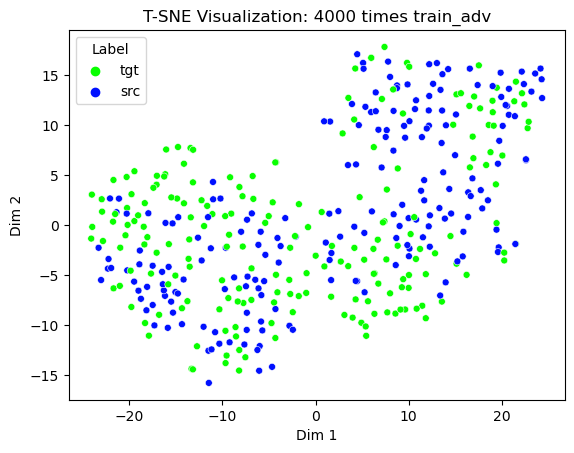

데이터 전체 개수: 160


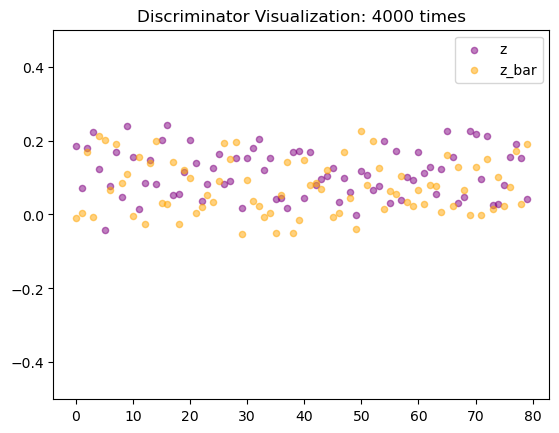

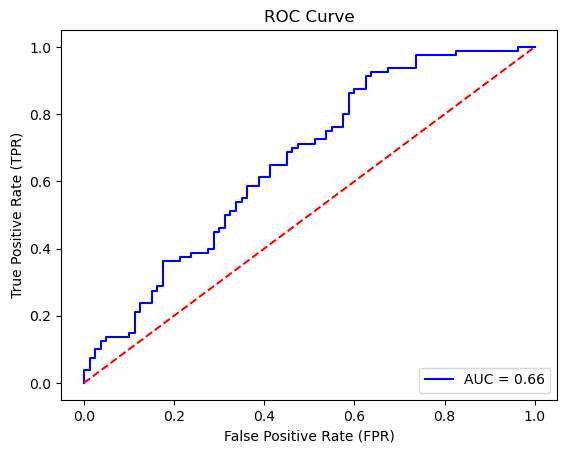

[iter: 4000]
train_ae_nl_src: 1.682345, train_ae_nl_tgt: 1.295115
train_discr: -0.048889, train_ae_by_discr: 0.087223
******************** source sample ********************
[original    ]: love this course and staff.
[generate_ori]: love this course and staff.
[generate_tst]: love this course and staff. 

[original    ]: there food is fresh and the service is great.
[generate_ori]: there food is fresh and the service is great.
[generate_tst]: there food is fresh and the service is great. 

[original    ]: the bread is so buttery and the meat is so good!
[generate_ori]: the bread is so buttery and the meat is so good!
[generate_tst]: the bread is so buttery and the meat is so good! 

[original    ]: highly recommended!
[generate_ori]: highly recommended!
[generate_tst]: highly recommended! 

******************** target sample ********************
[original    ]: the only thing worse than the room was the staff.
[generate_ori]: the only thing worse than the room was the staff.
[generate

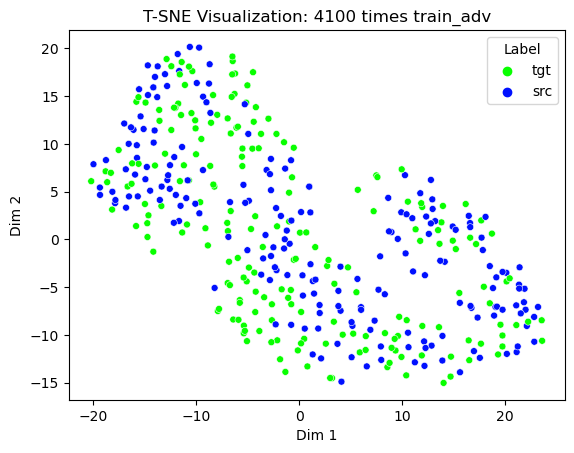

데이터 전체 개수: 160


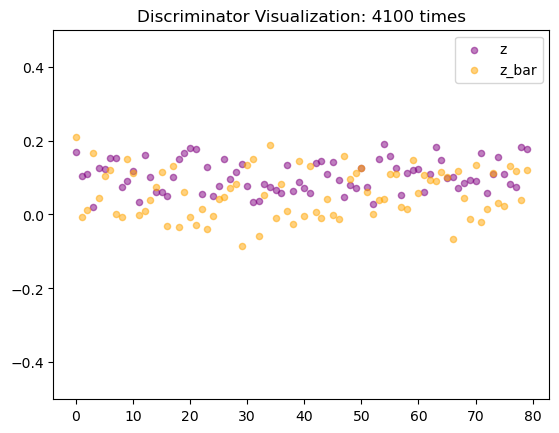

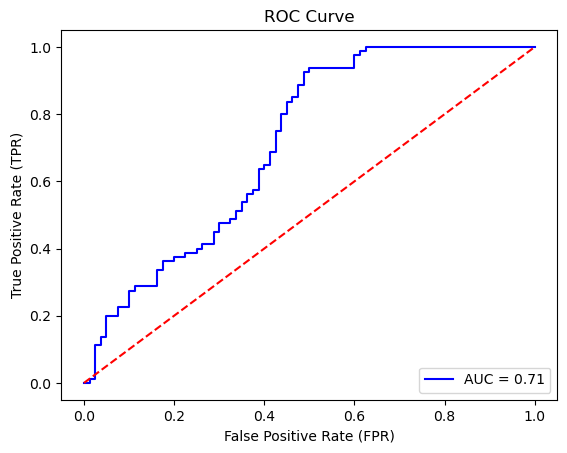

[iter: 4100]
train_ae_nl_src: 1.369986, train_ae_nl_tgt: 1.082904
train_discr: -0.046916, train_ae_by_discr: 0.049942
******************** source sample ********************
[original    ]: kung delight thumbs up.
[generate_ori]: kung delight thumbs up.
[generate_tst]: kung delight thumbs up. 

[original    ]: carlos and anthony are really professional.
[generate_ori]: carlos and anthony are really professional.
[generate_tst]: carlos and anthony are really professional. 

[original    ]: can't say i've ever liked a dentist until now.
[generate_ori]: can't say i've ever liked a dentist until now.
[generate_tst]: can't say i've ever liked a dentist until now. 

[original    ]: the girls are very fast and accurate when putting orders in.
[generate_ori]: the girls are very fast and accurate when putting orders in.
[generate_tst]: the girls are very fast and accurate when putting orders in. 

******************** target sample ********************
[original    ]: the only good thing about 

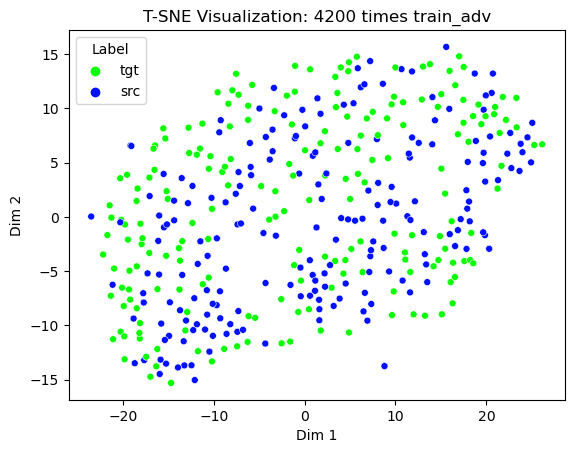

데이터 전체 개수: 160


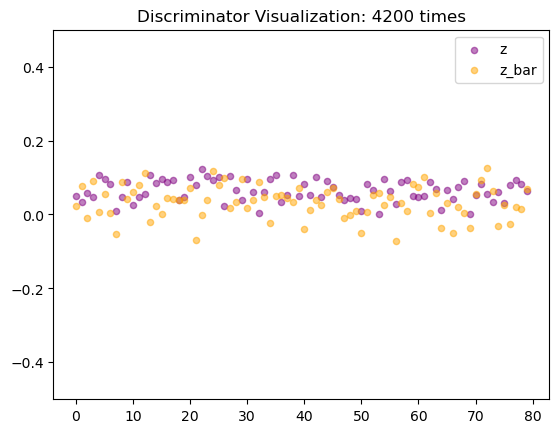

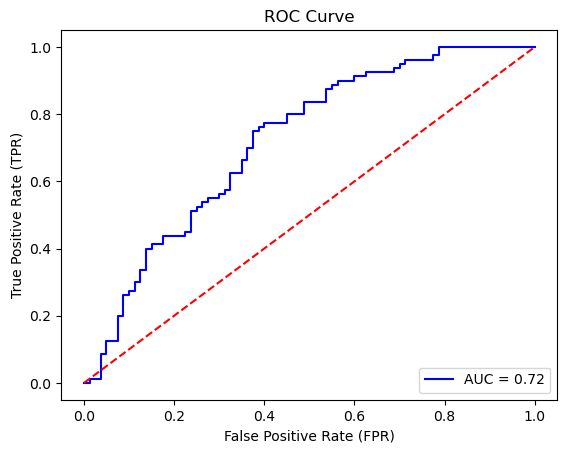

[iter: 4200]
train_ae_nl_src: 1.465637, train_ae_nl_tgt: 1.448041
train_discr: -0.095001, train_ae_by_discr: 0.061940
******************** source sample ********************
[original    ]: love going here for lunch.
[generate_ori]: love going here for lunch.
[generate_tst]: love going here for lunch. 

[original    ]: this restaurant is the best kept secret in all of phoenix.
[generate_ori]: this restaurant is the best kept secret in all of phoenix.
[generate_tst]: this restaurant is the best kept secret in all of phoenix. 

[original    ]: it was fun!
[generate_ori]: it was fun!
[generate_tst]: it was fun! 

[original    ]: would definitely recommend it for a quick local flavorful bite to eat.
[generate_ori]: would definitely recommend it for a quick local flavorful bite to eat.
[generate_tst]: would definitely recommend it for a quick local flavorful bite to eat. 

******************** target sample ********************
[original    ]: we waited _num_ minutes we were not even offere

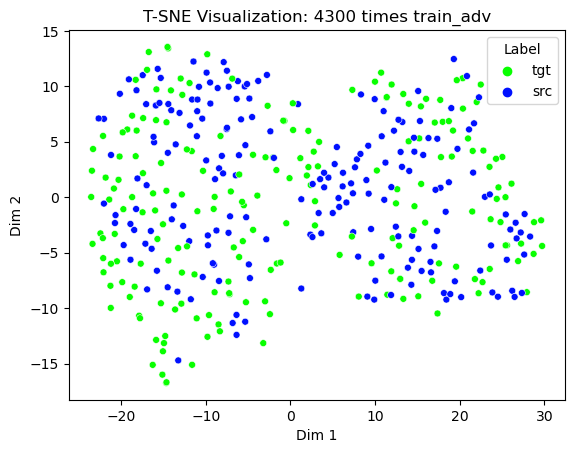

데이터 전체 개수: 160


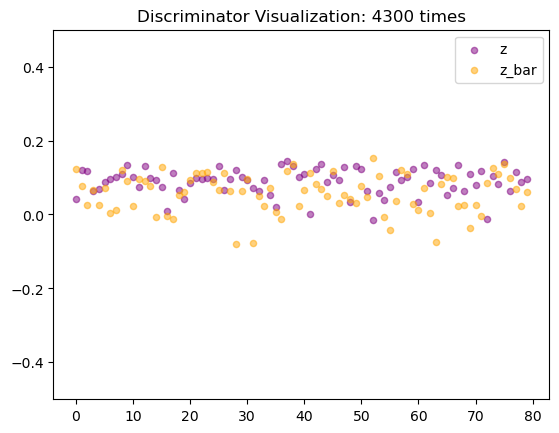

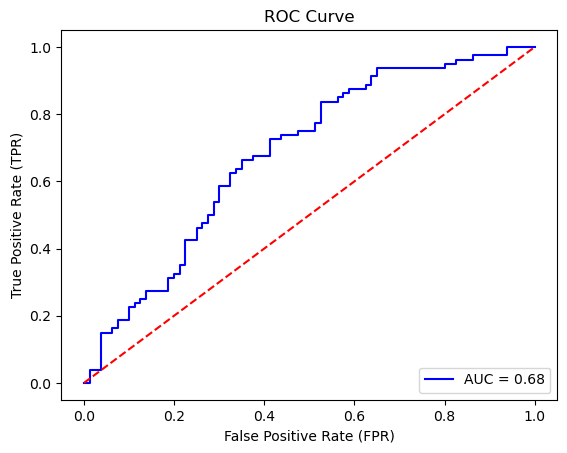

[iter: 4300]
train_ae_nl_src: 1.535653, train_ae_nl_tgt: 1.246100
train_discr: 0.000730, train_ae_by_discr: 0.023911
******************** source sample ********************
[original    ]: each serving could easily feed two.
[generate_ori]: each serving could easily feed two.
[generate_tst]: each serving could easily feed two. 

[original    ]: just wanted to send a big thank you to francisco!
[generate_ori]: just wanted to send a big thank you to francisco!
[generate_tst]: just wanted to send a big thank you to francisco! 

[original    ]: my son worked there and worked with the greatest people.
[generate_ori]: my son worked there and worked with the greatest people.
[generate_tst]: my son worked there and worked with the greatest people. 

[original    ]: my fianc and i had an amazing dining experience.
[generate_ori]: my fianc and i had an amazing dining experience.
[generate_tst]: my fianc and i had an amazing dining experience. 

******************** target sample ****************

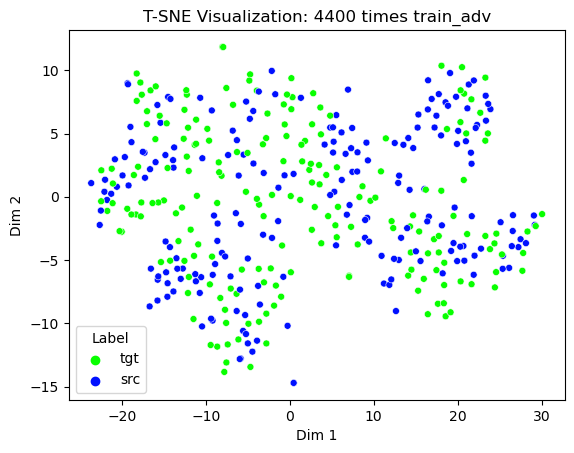

데이터 전체 개수: 160


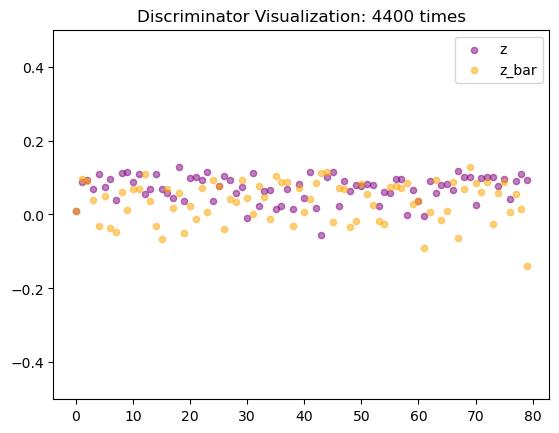

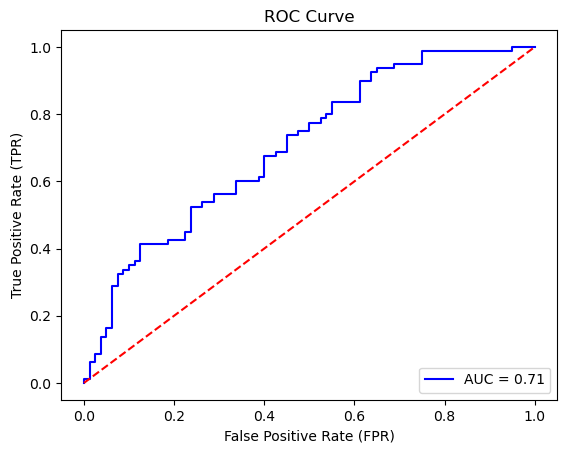

[iter: 4400]
train_ae_nl_src: 1.023825, train_ae_nl_tgt: 1.342486
train_discr: -0.021513, train_ae_by_discr: 0.048580
******************** source sample ********************
[original    ]: staff was very friendly.
[generate_ori]: staff was very friendly.
[generate_tst]: staff was very friendly. 

[original    ]: real food, great value.
[generate_ori]: real food, great value.
[generate_tst]: real food, great value. 

[original    ]: the people are really nice too.
[generate_ori]: the people are really nice too.
[generate_tst]: the people are really nice too. 

[original    ]: a must try and a new favorite.
[generate_ori]: a must try and a new favorite.
[generate_tst]: a must try and a new favorite. 

******************** target sample ********************
[original    ]: it was horrible.
[generate_ori]: it was horrible.
[generate_tst]: it was horrible. 

[original    ]: she spoke english when she took my money.
[generate_ori]: she spoke english when she took my money.
[generate_tst]: s

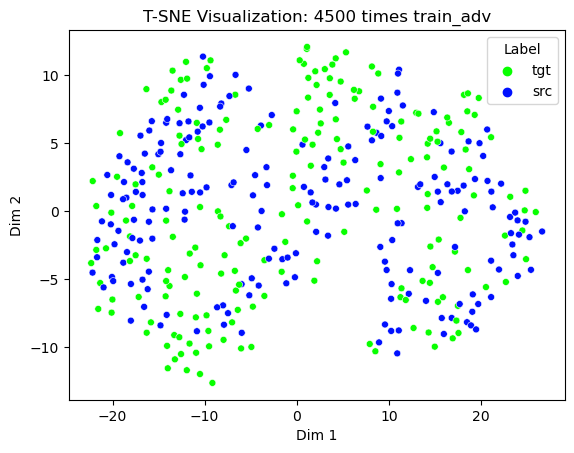

데이터 전체 개수: 160


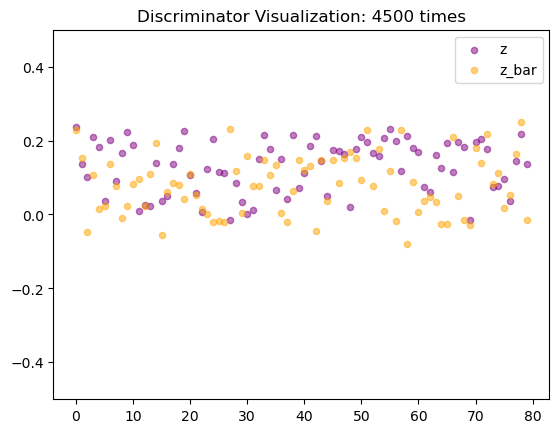

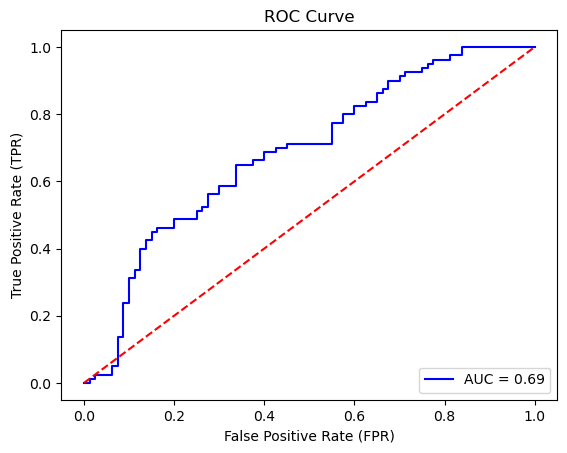

[iter: 4500]
train_ae_nl_src: 1.304694, train_ae_nl_tgt: 1.526487
train_discr: -0.037485, train_ae_by_discr: 0.022207
******************** source sample ********************
[original    ]: got a good haircut, everything was nice and even.
[generate_ori]: got a good haircut, everything was nice and even.
[generate_tst]: got a good haircut, everything was nice and even. 

[original    ]: food is always good.
[generate_ori]: food is always good.
[generate_tst]: food is always good. 

[original    ]: great food, low prices, and huge quantity!
[generate_ori]: great food, low prices, and huge quantity!
[generate_tst]: great food, low prices, and huge quantity! 

[original    ]: what an amazing restaurant!
[generate_ori]: what an amazing restaurant!
[generate_tst]: what an amazing restaurant! 

******************** target sample ********************
[original    ]: also, the noodles were halfway over cooked.
[generate_ori]: also, the noodles were halfway over cooked.
[generate_tst]: also, th

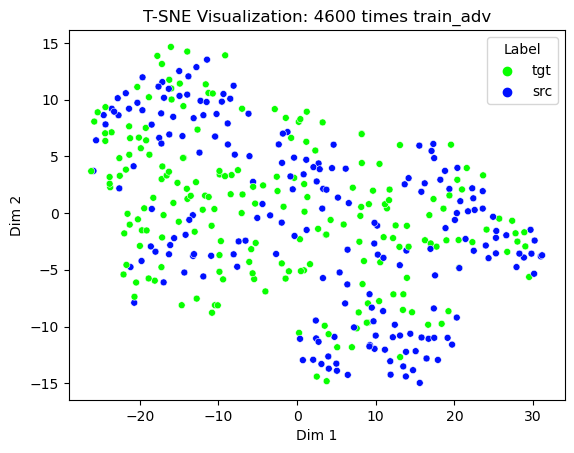

데이터 전체 개수: 160


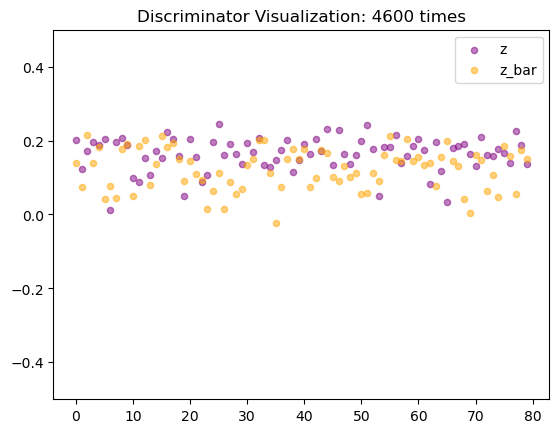

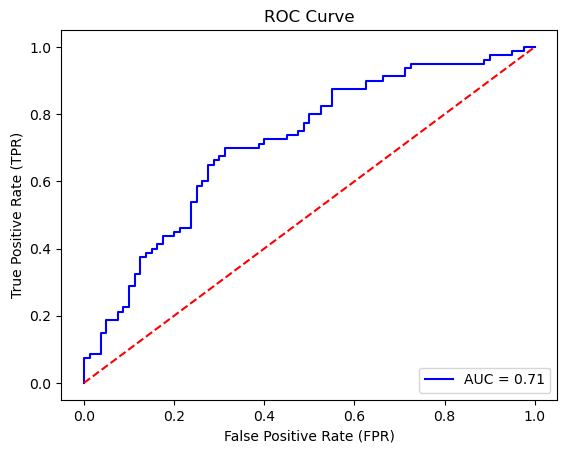

[iter: 4600]
train_ae_nl_src: 1.368112, train_ae_nl_tgt: 1.067603
train_discr: -0.035288, train_ae_by_discr: 0.018976
******************** source sample ********************
[original    ]: we got some appetizers which were very good as well.
[generate_ori]: we got some appetizers which were very good as well.
[generate_tst]: we got some appetizers which were very good as well. 

[original    ]: amazing prices too!
[generate_ori]: amazing prices too!
[generate_tst]: amazing prices too! 

[original    ]: francisco was very professional and really helpful.
[generate_ori]: francisco was very professional and really helpful.
[generate_tst]: francisco was very professional and really helpful. 

[original    ]: great subs!
[generate_ori]: great subs!
[generate_tst]: great subs! 

******************** target sample ********************
[original    ]: no napkins in main lobby.
[generate_ori]: no napkins in main lobby.
[generate_tst]: no napkins in main lobby. 

[original    ]: i didn't want t

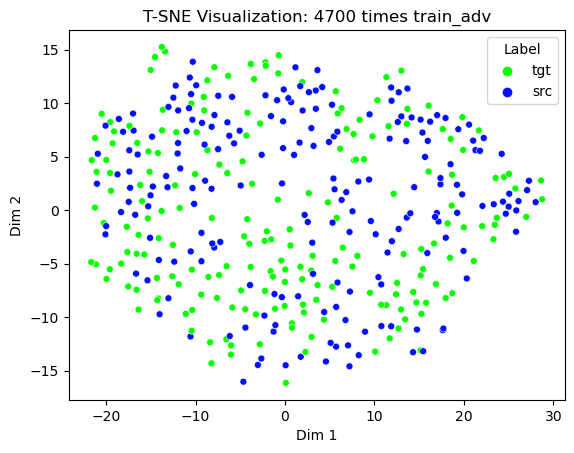

데이터 전체 개수: 160


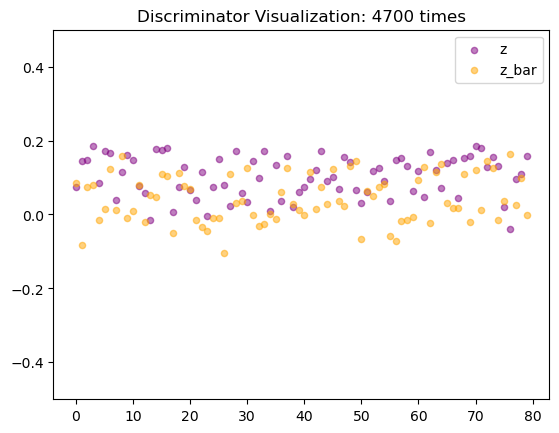

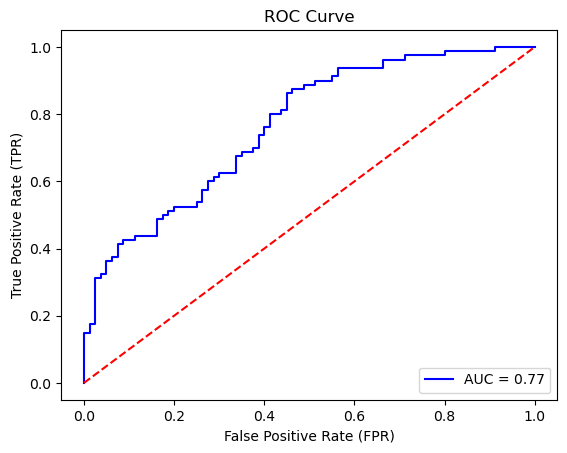

[iter: 4700]
train_ae_nl_src: 1.335999, train_ae_nl_tgt: 1.267786
train_discr: -0.011397, train_ae_by_discr: 0.021386
******************** source sample ********************
[original    ]: i am not a fan of milk, but love this milk.
[generate_ori]: i am not a fan of milk, but love this milk.
[generate_tst]: i am not a fan of milk, but love this milk. 

[original    ]: i also love to have a nice cup of hot tea too.
[generate_ori]: i also love to have a nice cup of hot tea too.
[generate_tst]: i also love to have a nice cup of hot tea too. 

[original    ]: he is an amazing dentist.
[generate_ori]: he is an amazing dentist.
[generate_tst]: he is an amazing dentist. 

[original    ]: really love this place.
[generate_ori]: really love this place.
[generate_tst]: really love this place. 

******************** target sample ********************
[original    ]: no problem with the actual care at the facility.
[generate_ori]: no problem with the actual care at the facility.
[generate_tst]: n

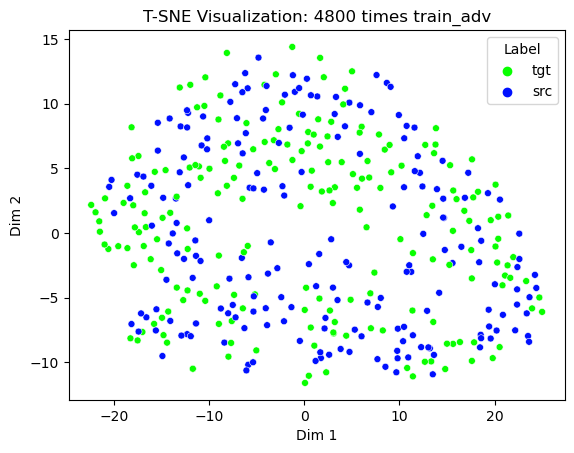

데이터 전체 개수: 160


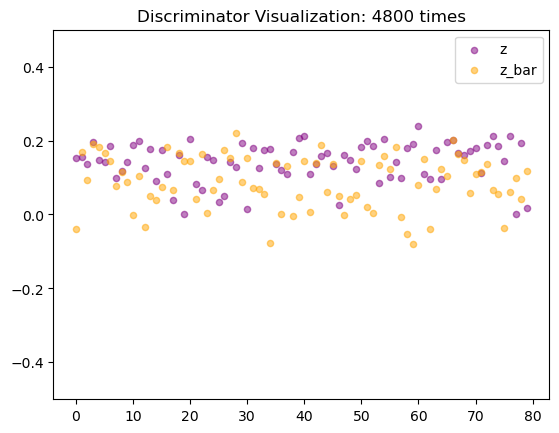

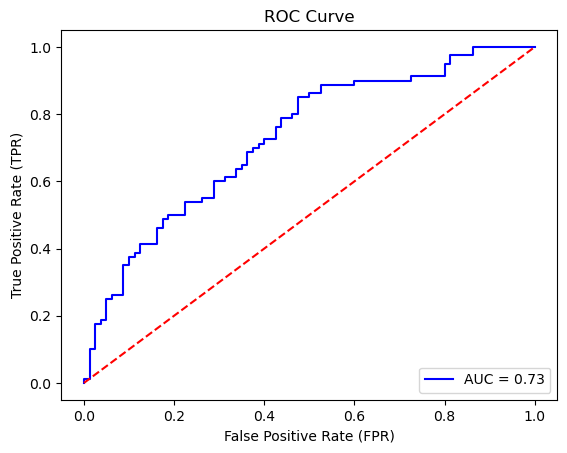

[iter: 4800]
train_ae_nl_src: 1.322273, train_ae_nl_tgt: 2.003387
train_discr: -0.015613, train_ae_by_discr: 0.030682
******************** source sample ********************
[original    ]: omg i'm hooked.
[generate_ori]: omg i'm hooked.
[generate_tst]: omg i'm hooked. 

[original    ]: the food is good, way better than panda express!
[generate_ori]: the food is good, way better than panda express!
[generate_tst]: the food is good, way better than panda express! 

[original    ]: great store.
[generate_ori]: great store.
[generate_tst]: great store. 

[original    ]: one of my favorite is the powdered donuts with blueberry filling!
[generate_ori]: one of my favorite is the powdered donuts with blueberry filling!
[generate_tst]: one of my favorite is the powdered donuts with blueberry filling! 

******************** target sample ********************
[original    ]: i'm never going there again.
[generate_ori]: i'm never going there again.
[generate_tst]: i'm never going there again. 

[

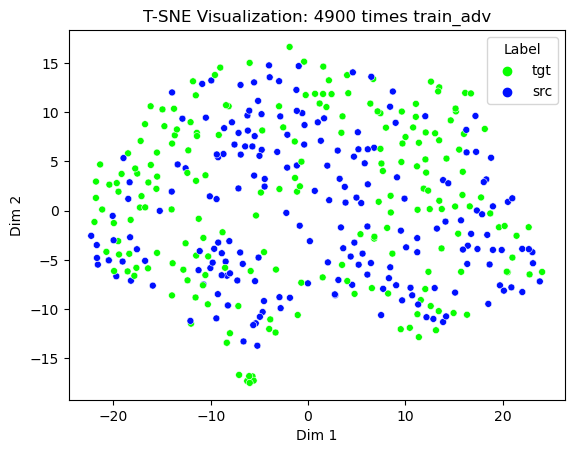

데이터 전체 개수: 160


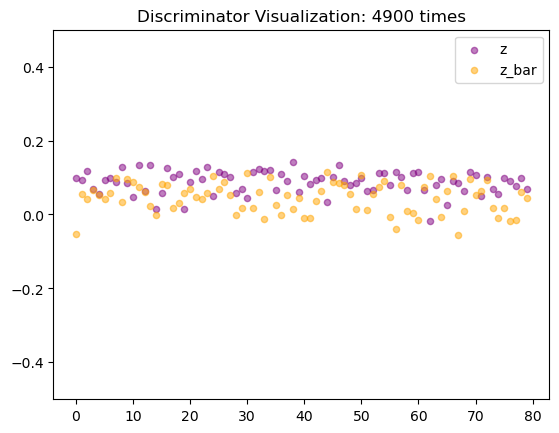

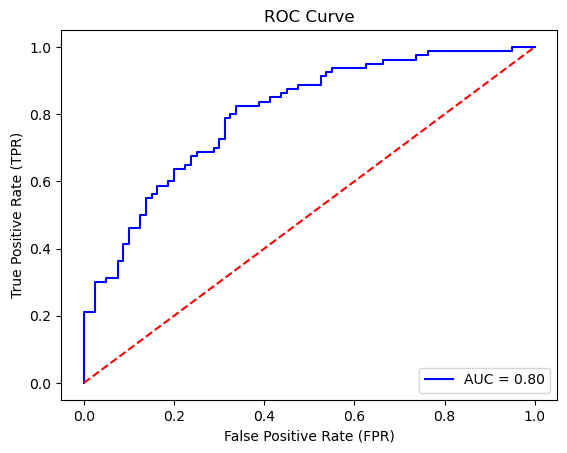

[iter: 4900]
train_ae_nl_src: 1.261556, train_ae_nl_tgt: 1.230639
train_discr: -0.018482, train_ae_by_discr: 0.047228
******************** source sample ********************
[original    ]: i recommend them to anyone.
[generate_ori]: i recommend them to anyone.
[generate_tst]: i recommend them to anyone. 

[original    ]: the rest was pretty good considering time of year.
[generate_ori]: the rest was pretty good considering time of year.
[generate_tst]: the rest was pretty good considering time of year. 

[original    ]: great doctor listens and is patient.
[generate_ori]: great doctor listens and is patient.
[generate_tst]: great doctor listens and is patient. 

[original    ]: the food was very good.
[generate_ori]: the food was very good.
[generate_tst]: the food was very good. 

******************** target sample ********************
[original    ]: _num_.
[generate_ori]: _num_.
[generate_tst]: _num_. 

[original    ]: when you're passing through town, get thee to the grocery.
[gen

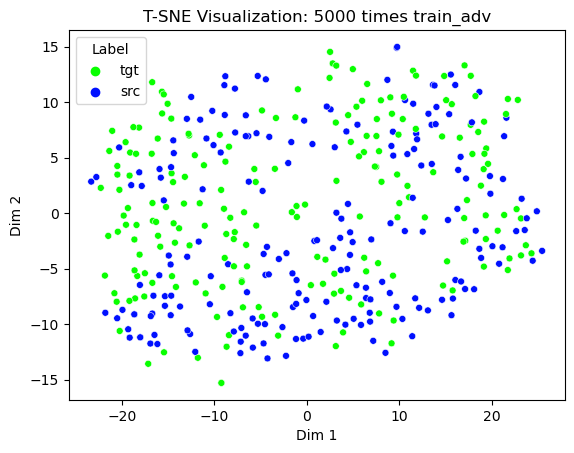

데이터 전체 개수: 160


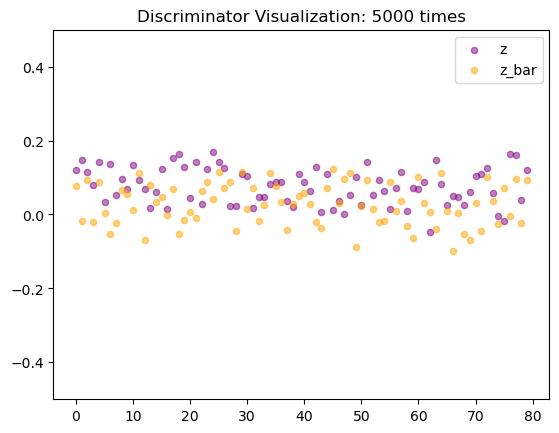

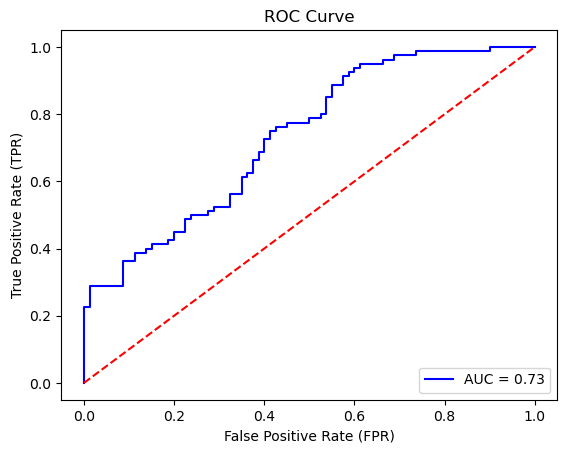

[iter: 5000]
train_ae_nl_src: 1.398955, train_ae_nl_tgt: 1.074340
train_discr: -0.053417, train_ae_by_discr: 0.019538
******************** source sample ********************
[original    ]: what an amazing restaurant!
[generate_ori]: what an amazing restaurant!
[generate_tst]: what an amazing restaurant! 

[original    ]: good portion of food and food is hot.
[generate_ori]: good portion of food and food is hot.
[generate_tst]: good portion of food and food is hot. 

[original    ]: i fell in love with the bagels!
[generate_ori]: i fell in love with the bagels!
[generate_tst]: i fell in love with the bagels! 

[original    ]: green corn tamale is so good!
[generate_ori]: green corn tamale is so good!
[generate_tst]: green corn tamale is so good! 

******************** target sample ********************
[original    ]: my tow assistance is set by progressive at 10am.
[generate_ori]: my tow assistance is set by progressive at 10am.
[generate_tst]: my tow assistance is set by progressive 

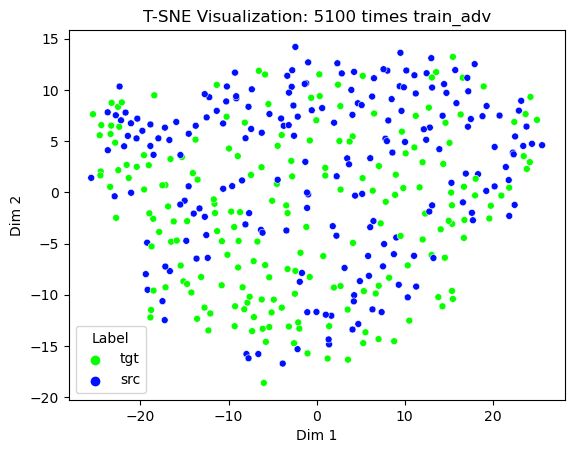

데이터 전체 개수: 160


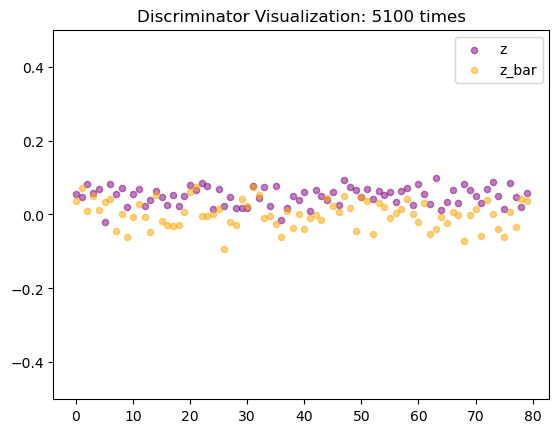

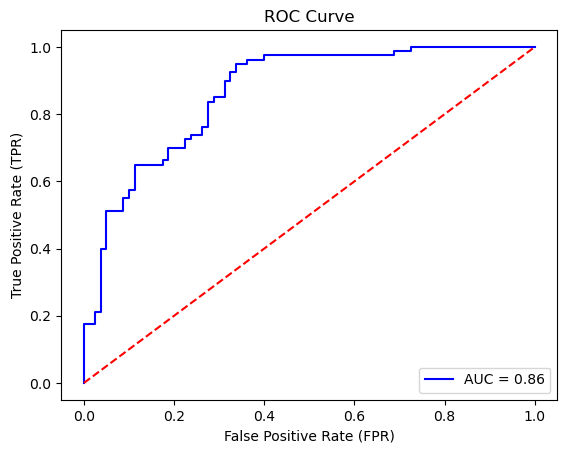

[iter: 5100]
train_ae_nl_src: 1.382481, train_ae_nl_tgt: 1.198366
train_discr: -0.033623, train_ae_by_discr: 0.046099
******************** source sample ********************
[original    ]: wow, what a great track.
[generate_ori]: wow, what a great track.
[generate_tst]: wow, what a great track. 

[original    ]: i have always received excellent service at this denny's.
[generate_ori]: i have always received excellent service at this denny's.
[generate_tst]: i have always received excellent service at this denny's. 

[original    ]: recently moved to the area.
[generate_ori]: recently moved to the area.
[generate_tst]: recently moved to the area. 

[original    ]: i will be back!
[generate_ori]: i will be back!
[generate_tst]: i will be back! 

******************** target sample ********************
[original    ]: it was totally bland and was overwhelmed with ricotta cheese.
[generate_ori]: it was totally bland and was overwhelmed with ricotta cheese.
[generate_tst]: it was totally bl

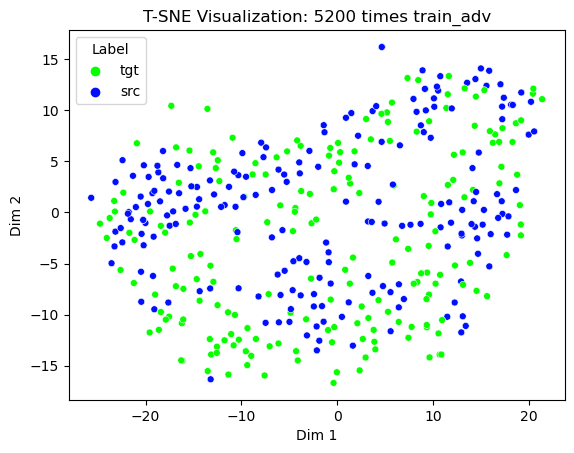

데이터 전체 개수: 160


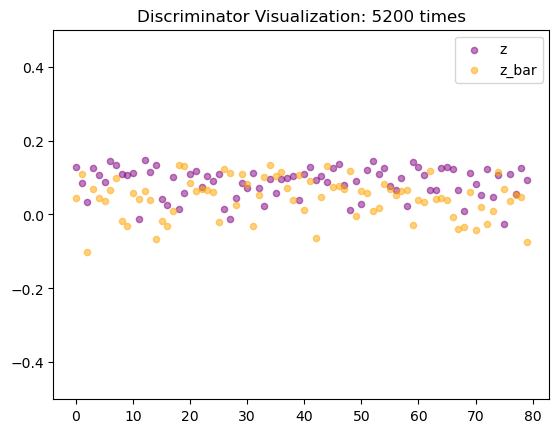

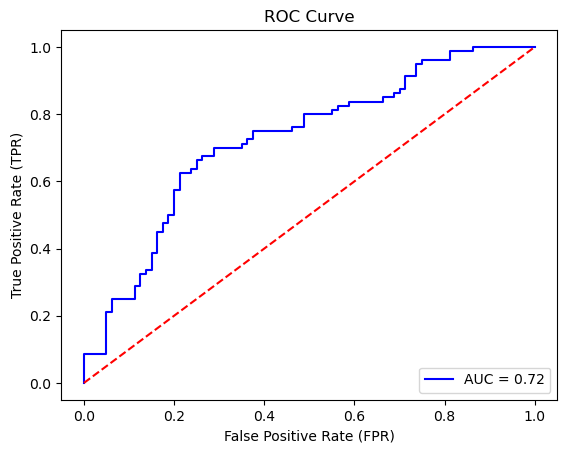

[iter: 5200]
train_ae_nl_src: 1.261312, train_ae_nl_tgt: 1.505971
train_discr: -0.038031, train_ae_by_discr: 0.049739
******************** source sample ********************
[original    ]: everything was good.
[generate_ori]: everything was good.
[generate_tst]: everything was good. 

[original    ]: the amount of business alone should make it worth your while.
[generate_ori]: the amount of business alone should make it worth your while.
[generate_tst]: the amount of business alone should make it worth your while. 

[original    ]: the prices are astounding.
[generate_ori]: the prices are astounding.
[generate_tst]: the prices are astounding. 

[original    ]: this was absolutely a hidden gem!
[generate_ori]: this was absolutely a hidden gem!
[generate_tst]: this was absolutely a hidden gem! 

******************** target sample ********************
[original    ]: where i come from they skate, not here.
[generate_ori]: where i come from they skate, not here.
[generate_tst]: where i co

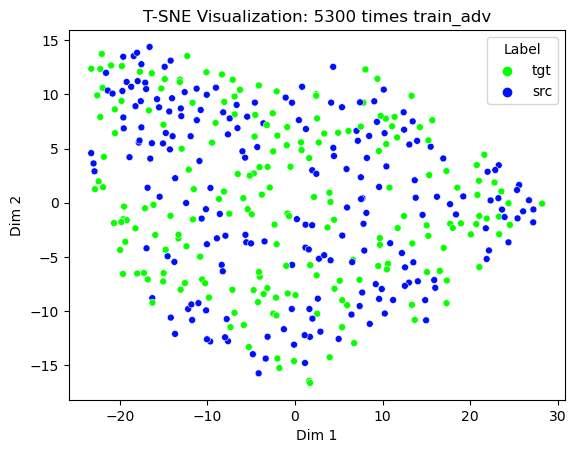

데이터 전체 개수: 160


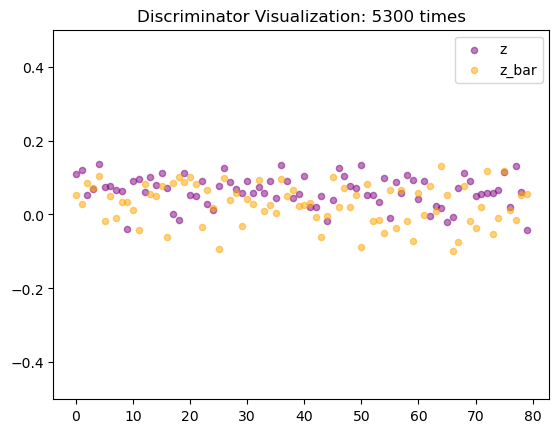

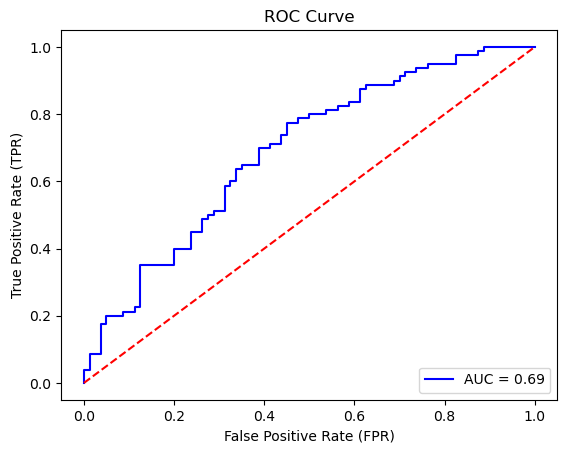

[iter: 5300]
train_ae_nl_src: 1.521189, train_ae_nl_tgt: 1.261581
train_discr: -0.039815, train_ae_by_discr: 0.038167
******************** source sample ********************
[original    ]: if you like olive garden this location is recommended.
[generate_ori]: if you like olive garden this location is recommended.
[generate_tst]: if you like olive garden this location is recommended. 

[original    ]: fantastic customer service and smiles.
[generate_ori]: fantastic customer service and smiles.
[generate_tst]: fantastic customer service and smiles. 

[original    ]: highly recommended.
[generate_ori]: highly recommended.
[generate_tst]: highly recommended. 

[original    ]: the place was clean and very big for a bigger party.
[generate_ori]: the place was clean and very big for a bigger party.
[generate_tst]: the place was clean and very big for a bigger party. 

******************** target sample ********************
[original    ]: just flat out rude.
[generate_ori]: just flat out rud

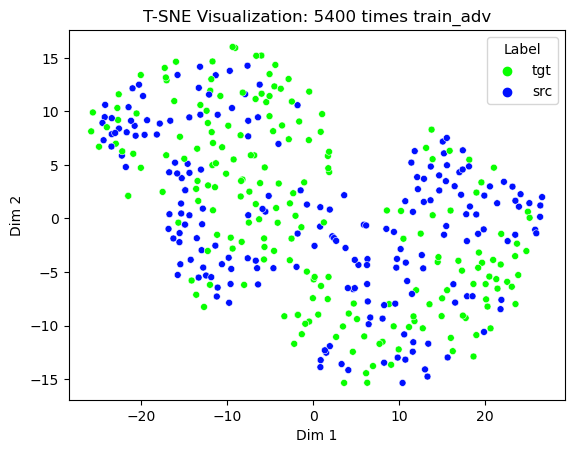

데이터 전체 개수: 160


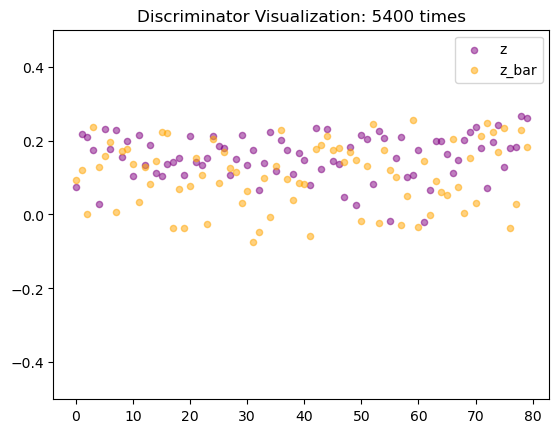

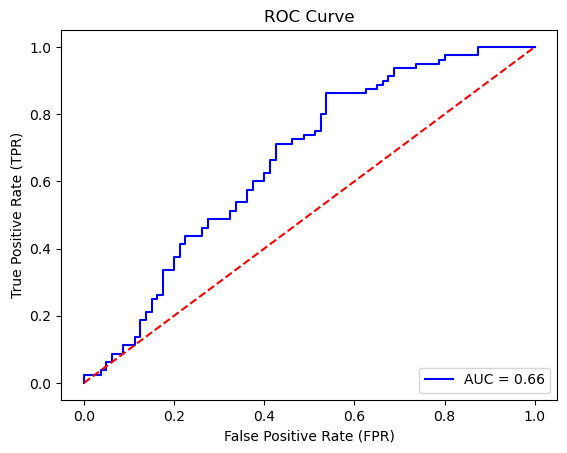

[iter: 5400]
train_ae_nl_src: 1.100198, train_ae_nl_tgt: 1.166316
train_discr: -0.023310, train_ae_by_discr: 0.020961
******************** source sample ********************
[original    ]: fair and knowledgable.
[generate_ori]: fair and knowledgable.
[generate_tst]: fair and knowledgable. 

[original    ]: the quality and quantity of food is exceptional.
[generate_ori]: the quality and quantity of food is exceptional.
[generate_tst]: the quality and quantity of food is exceptional. 

[original    ]: awesome team!
[generate_ori]: awesome team!
[generate_tst]: awesome team! 

[original    ]: the lo mein is amazing as are the cream puffs.
[generate_ori]: the lo mein is amazing as are the cream puffs.
[generate_tst]: the lo mein is amazing as are the cream puffs. 

******************** target sample ********************
[original    ]: it takes many appointments, and takes longer then _num_ minutes to do!
[generate_ori]: it takes many appointments, and takes longer then _num_ minutes to d

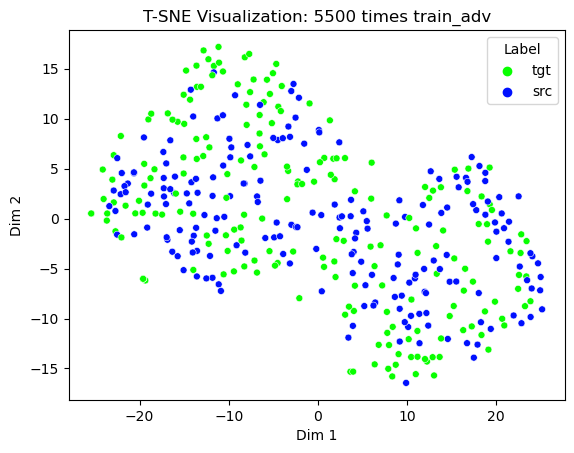

데이터 전체 개수: 160


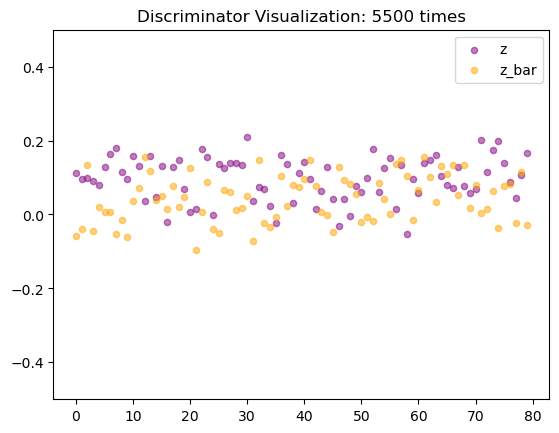

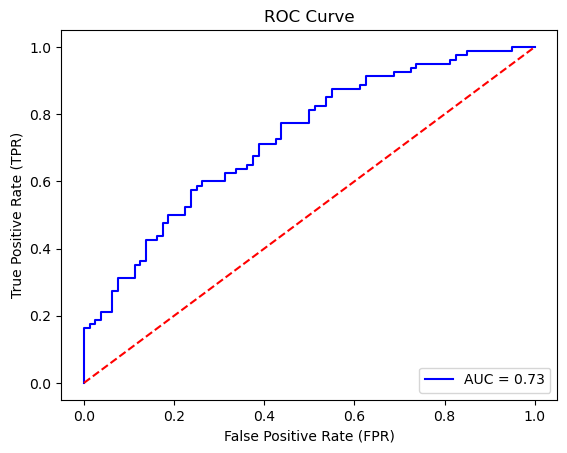

[iter: 5500]
train_ae_nl_src: 1.189117, train_ae_nl_tgt: 1.333832
train_discr: -0.055767, train_ae_by_discr: 0.056230
******************** source sample ********************
[original    ]: great customer service and prices.
[generate_ori]: great customer service and prices.
[generate_tst]: great customer service and prices. 

[original    ]: worth checking out if you are on that side of town.
[generate_ori]: worth checking out if you are on that side of town.
[generate_tst]: worth checking out if you are on that side of town. 

[original    ]: everything was good.
[generate_ori]: everything was good.
[generate_tst]: everything was good. 

[original    ]: definately a place you can bring the family or just go for happy hour!
[generate_ori]: definately a place you can bring the family or just go for happy hour!
[generate_tst]: definately a place you can bring the family or just go for happy hour! 

******************** target sample ********************
[original    ]: i was blatantly i

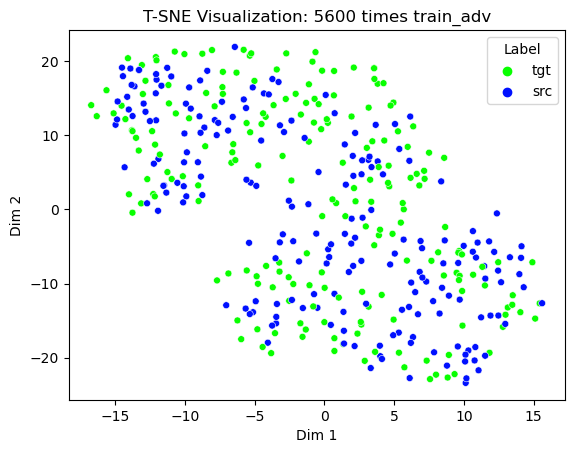

데이터 전체 개수: 160


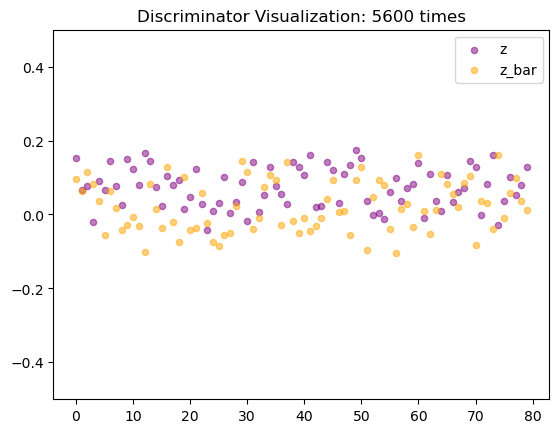

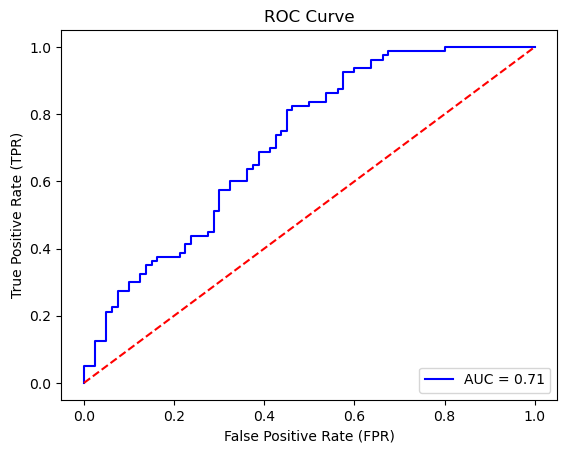

[iter: 5600]
train_ae_nl_src: 1.346973, train_ae_nl_tgt: 1.390394
train_discr: -0.032504, train_ae_by_discr: 0.041251
******************** source sample ********************
[original    ]: the best towing experience i've ever had!
[generate_ori]: the best towing experience i've ever had!
[generate_tst]: the best towing experience i've ever had! 

[original    ]: returns are easy with or without receipts.
[generate_ori]: returns are easy with or without receipts.
[generate_tst]: returns are easy with or without receipts. 

[original    ]: i love this place!
[generate_ori]: i love this place!
[generate_tst]: i love this place! 

[original    ]: both were amazing.
[generate_ori]: both were amazing.
[generate_tst]: both were amazing. 

******************** target sample ********************
[original    ]: horrible service!
[generate_ori]: horrible service!
[generate_tst]: horrible service! 

[original    ]: olive garden is olive garden.
[generate_ori]: olive garden is olive garden.
[gene

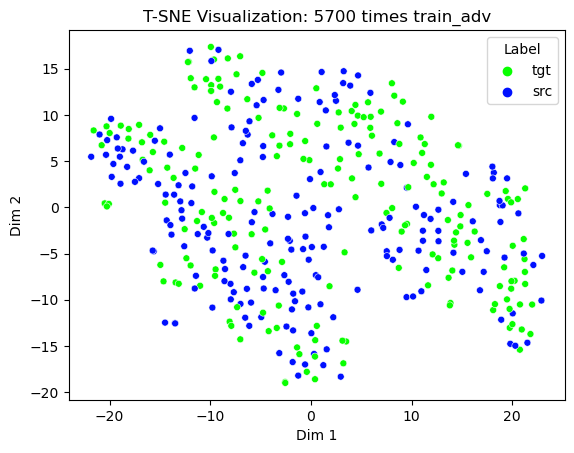

데이터 전체 개수: 160


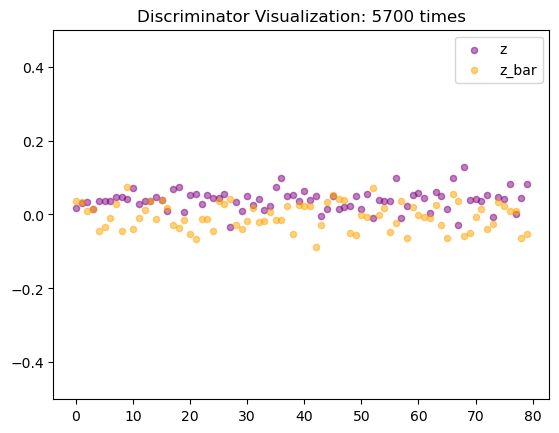

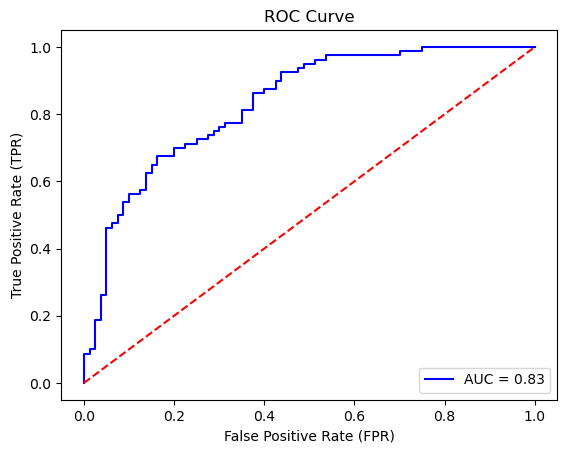

[iter: 5700]
train_ae_nl_src: 1.279061, train_ae_nl_tgt: 1.248411
train_discr: -0.053002, train_ae_by_discr: 0.019890
******************** source sample ********************
[original    ]: overall awesome service!
[generate_ori]: overall awesome service!
[generate_tst]: overall awesome service! 

[original    ]: well it doesn't.
[generate_ori]: well it doesn't.
[generate_tst]: well it doesn't. 

[original    ]: great prices!
[generate_ori]: great prices!
[generate_tst]: great prices! 

[original    ]: everything i have had on their menu is delicious.
[generate_ori]: everything i have had on their menu is delicious.
[generate_tst]: everything i have had on their menu is delicious. 

******************** target sample ********************
[original    ]: i could go on and on but i am sure you get the point.
[generate_ori]: i could go on and on but i am sure you get the point.
[generate_tst]: i could go on and on but i am sure you get the point. 

[original    ]: the experience was awful

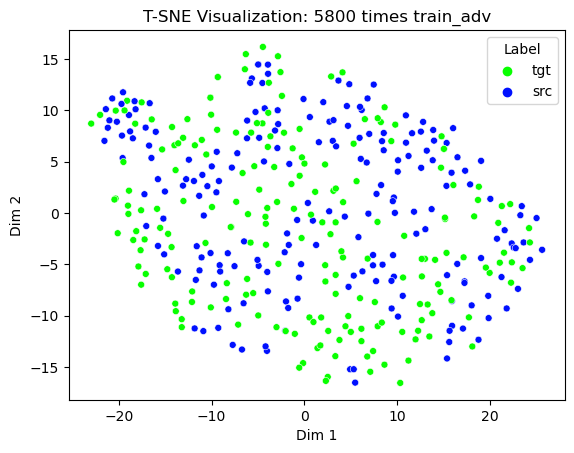

데이터 전체 개수: 160


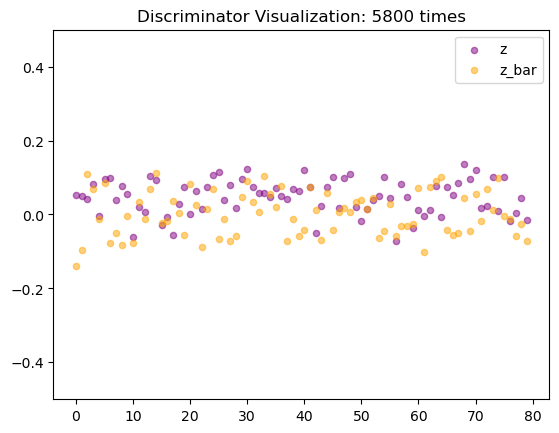

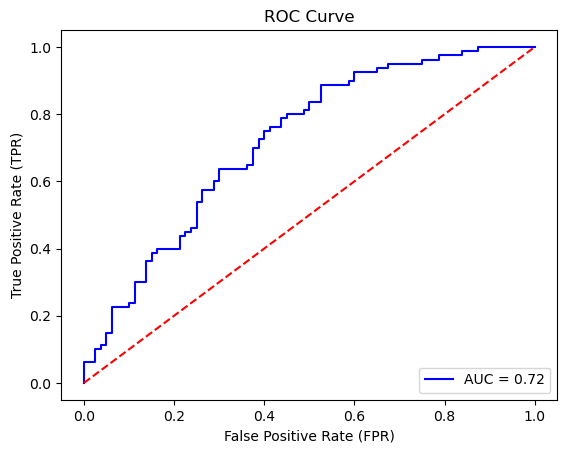

[iter: 5800]
train_ae_nl_src: 1.425293, train_ae_nl_tgt: 0.989660
train_discr: -0.008019, train_ae_by_discr: 0.061577
******************** source sample ********************
[original    ]: my feet feel so much better after she's done.
[generate_ori]: my feet feel so much better after she's done.
[generate_tst]: my feet feel so much better after she's done. 

[original    ]: use that gift card for your movie tickets.
[generate_ori]: use that gift card for your movie tickets.
[generate_tst]: use that gift card for your movie tickets. 

[original    ]: closest one to our house.
[generate_ori]: closest one to our house.
[generate_tst]: closest one to our house. 

[original    ]: we made the right choice!
[generate_ori]: we made the right choice!
[generate_tst]: we made the right choice! 

******************** target sample ********************
[original    ]: they were a soggy, greasy, tasteless mess.
[generate_ori]: they were a soggy, greasy, tasteless mess.
[generate_tst]: they were a s

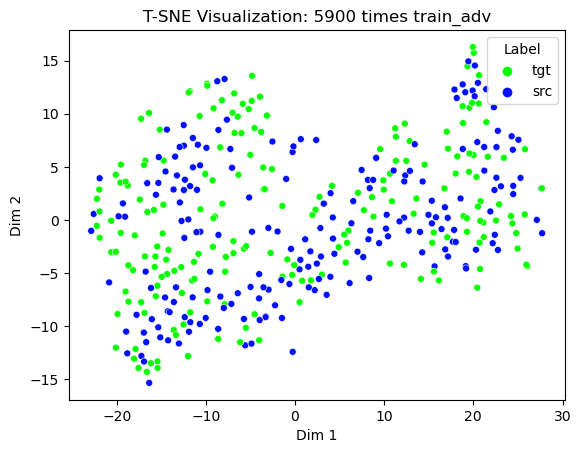

데이터 전체 개수: 160


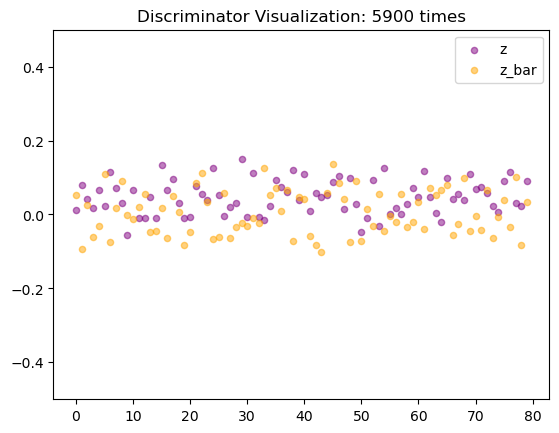

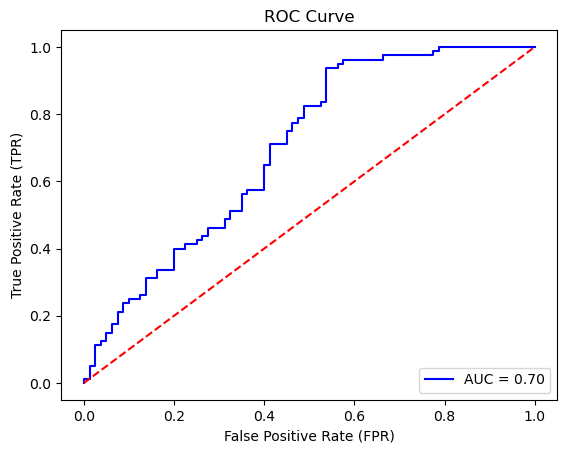

[iter: 5900]
train_ae_nl_src: 1.119959, train_ae_nl_tgt: 1.271203
train_discr: -0.066559, train_ae_by_discr: 0.026135
******************** source sample ********************
[original    ]: wonderful place.
[generate_ori]: wonderful place.
[generate_tst]: wonderful place. 

[original    ]: would definitely recommend.
[generate_ori]: would definitely recommend.
[generate_tst]: would definitely recommend. 

[original    ]: walked across the street and am sure glad i did.
[generate_ori]: walked across the street and am sure glad i did.
[generate_tst]: walked across the street and am sure glad i did. 

[original    ]: friendly staff.
[generate_ori]: friendly staff.
[generate_tst]: friendly staff. 

******************** target sample ********************
[original    ]: if i could give lower, i would.
[generate_ori]: if i could give lower, i would.
[generate_tst]: if i could give lower, i would. 

[original    ]: by far the worst dining experience i've ever had in my entire life.
[generate_

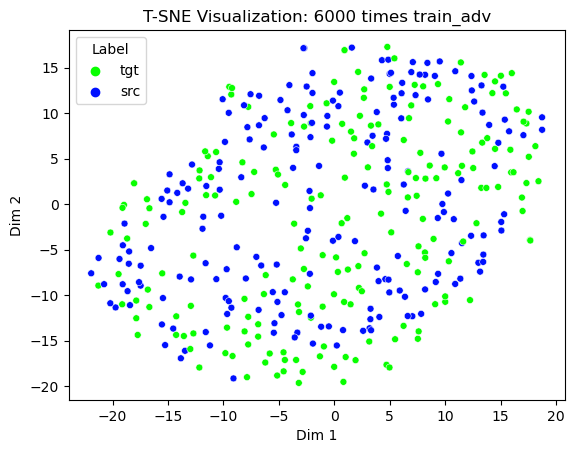

데이터 전체 개수: 160


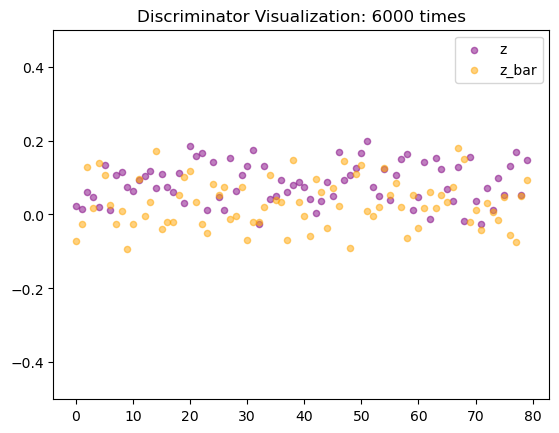

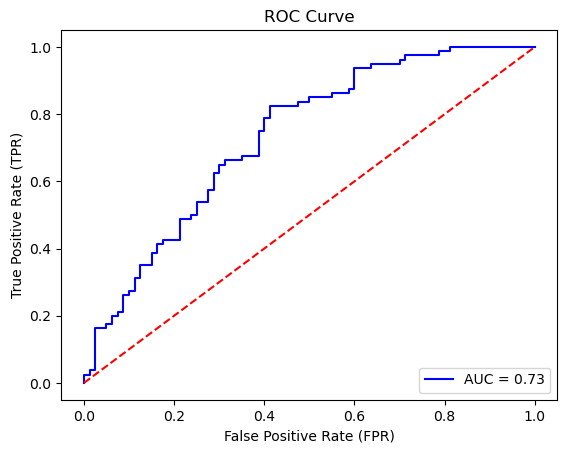

[iter: 6000]
train_ae_nl_src: 1.447873, train_ae_nl_tgt: 1.962807
train_discr: -0.071400, train_ae_by_discr: 0.021541
******************** source sample ********************
[original    ]: i had a bite of my husbands chicken tacos and it was delicious!
[generate_ori]: i had a bite of my husbands chicken tacos and it was delicious!
[generate_tst]: i had a bite of my husbands chicken tacos and it was delicious! 

[original    ]: beautiful cut and incredible color!
[generate_ori]: beautiful cut and incredible color!
[generate_tst]: beautiful cut and incredible color! 

[original    ]: this place is awsome!
[generate_ori]: this place is awsome!
[generate_tst]: this place is awsome! 

[original    ]: the orange chicken, sesame chicken and fried rice are very good as well.
[generate_ori]: the orange chicken, sesame chicken and fried rice are very good as well.
[generate_tst]: the orange chicken, sesame chicken and fried rice are very good as well. 

******************** target sample ******

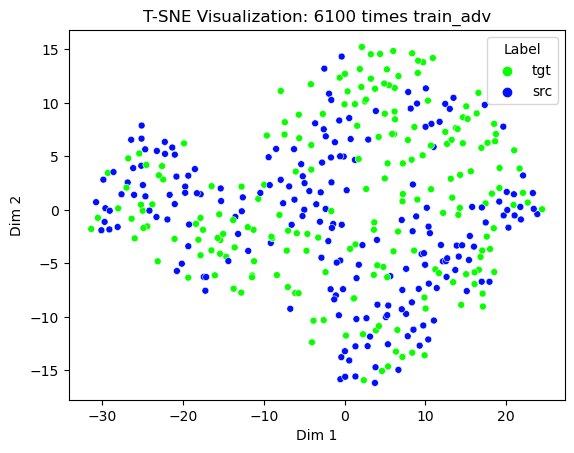

데이터 전체 개수: 160


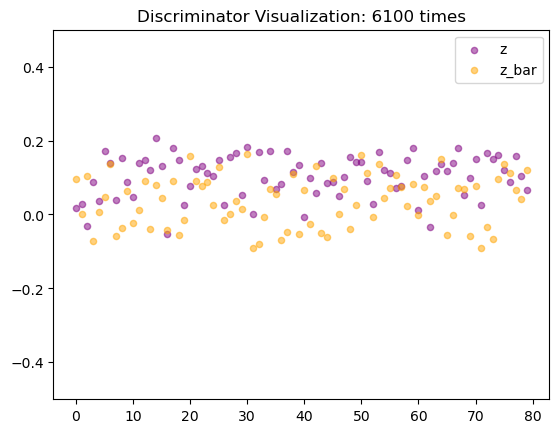

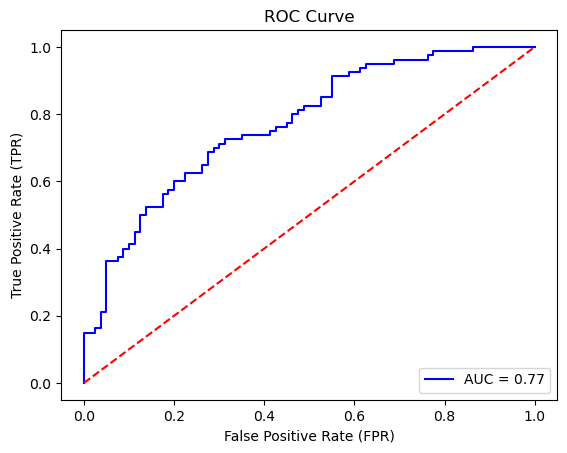

[iter: 6100]
train_ae_nl_src: 1.152602, train_ae_nl_tgt: 0.984040
train_discr: -0.092647, train_ae_by_discr: 0.041722
******************** source sample ********************
[original    ]: i love the humane society.
[generate_ori]: i love the humane society.
[generate_tst]: i love the humane society. 

[original    ]: phoenix hidden gem!
[generate_ori]: phoenix hidden gem!
[generate_tst]: phoenix hidden gem! 

[original    ]: my family will continue to support the humane society for the years to come.
[generate_ori]: my family will continue to support the humane society for the years to come.
[generate_tst]: my family will continue to support the humane society for the years to come. 

[original    ]: my son worked there and worked with the greatest people.
[generate_ori]: my son worked there and worked with the greatest people.
[generate_tst]: my son worked there and worked with the greatest people. 

******************** target sample ********************
[original    ]: so frustrat

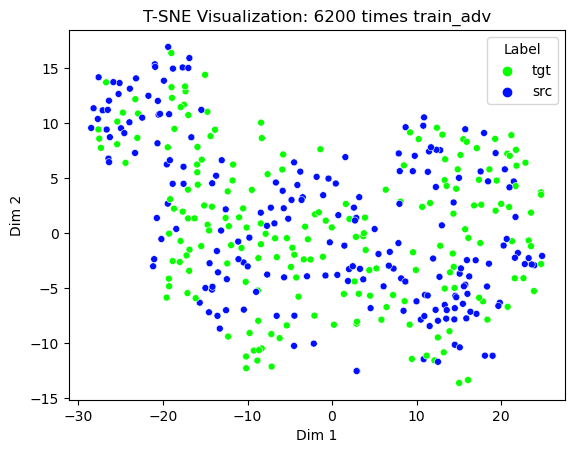

데이터 전체 개수: 160


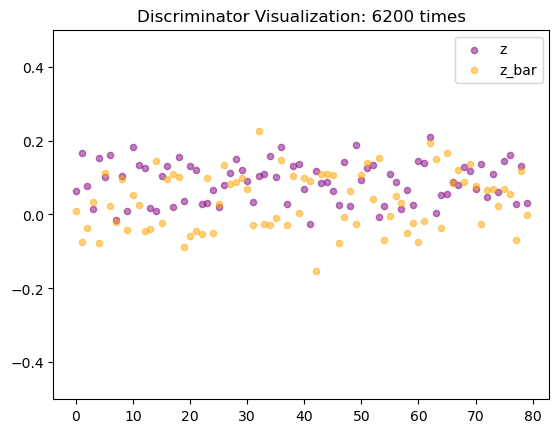

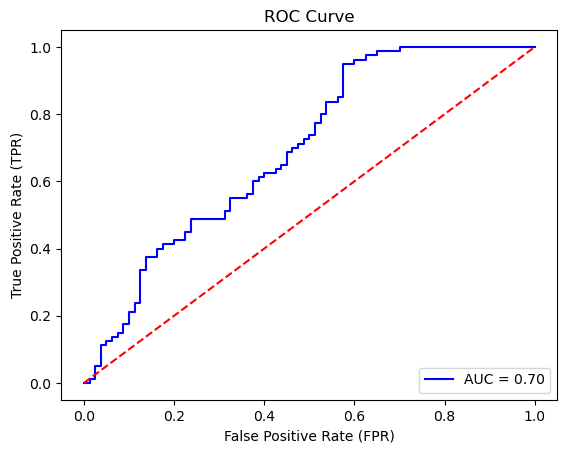

[iter: 6200]
train_ae_nl_src: 1.185941, train_ae_nl_tgt: 1.349069
train_discr: -0.049844, train_ae_by_discr: 0.020712
******************** source sample ********************
[original    ]: thank you dan and the rest of the team at affordable german auto repair!
[generate_ori]: thank you dan and the rest of the team at affordable german auto repair!
[generate_tst]: thank you dan and the rest of the team at affordable german auto repair! 

[original    ]: it's a fun place with old arcade games and lots of seating.
[generate_ori]: it's a fun place with old arcade games and lots of seating.
[generate_tst]: it's a fun place with old arcade games and lots of seating. 

[original    ]: i have adopted one dog and one cat from here.
[generate_ori]: i have adopted one dog and one cat from here.
[generate_tst]: i have adopted one dog and one cat from here. 

[original    ]: by far one of the best places to get a torta in arizona.
[generate_ori]: by far one of the best places to get a torta in ar

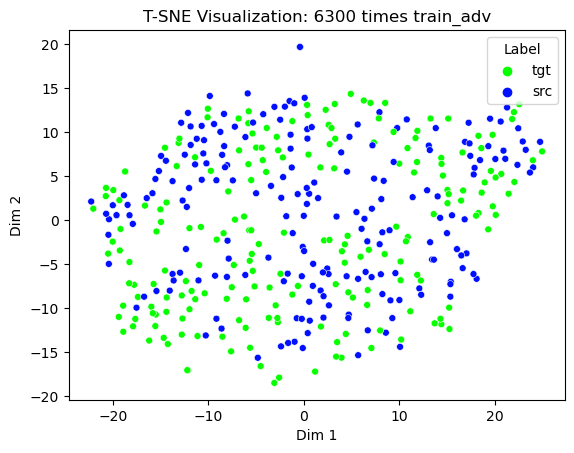

데이터 전체 개수: 160


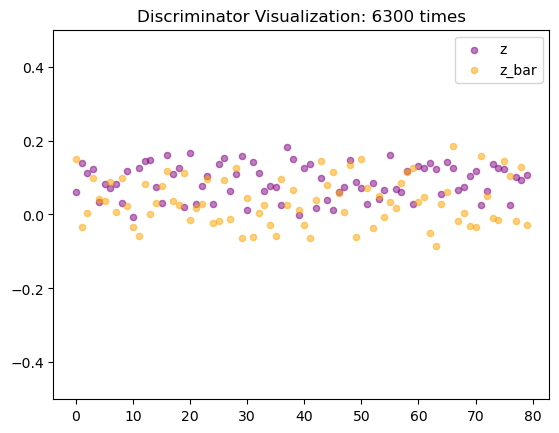

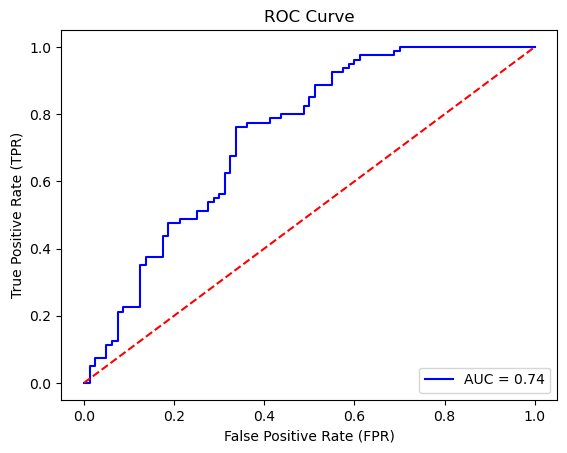

[iter: 6300]
train_ae_nl_src: 1.181775, train_ae_nl_tgt: 0.974796
train_discr: -0.059156, train_ae_by_discr: 0.055523
******************** source sample ********************
[original    ]: pretty decent and very good, fast service.
[generate_ori]: pretty decent and very good, fast service.
[generate_tst]: pretty decent and very good, fast service. 

[original    ]: i am not a fan of milk, but love this milk.
[generate_ori]: i am not a fan of milk, but love this milk.
[generate_tst]: i am not a fan of milk, but love this milk. 

[original    ]: cheap and delicious!
[generate_ori]: cheap and delicious!
[generate_tst]: cheap and delicious! 

[original    ]: can't say i've ever liked a dentist until now.
[generate_ori]: can't say i've ever liked a dentist until now.
[generate_tst]: can't say i've ever liked a dentist until now. 

******************** target sample ********************
[original    ]: don't eat here.
[generate_ori]: don't eat here.
[generate_tst]: don't eat here. 

[origin

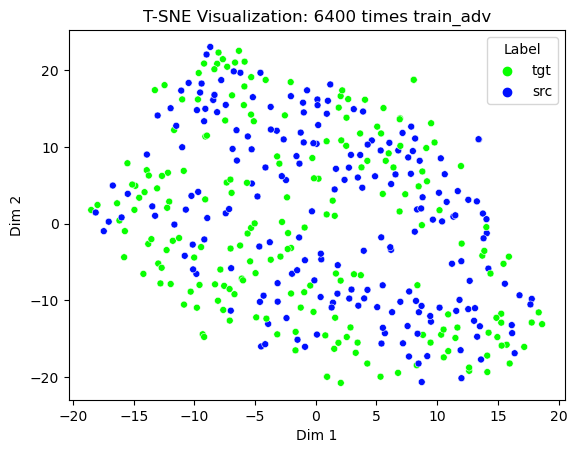

데이터 전체 개수: 160


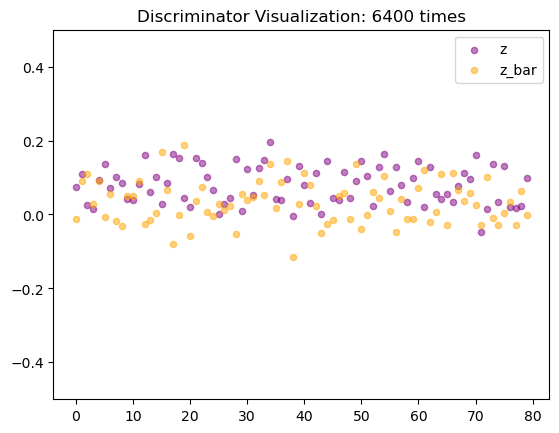

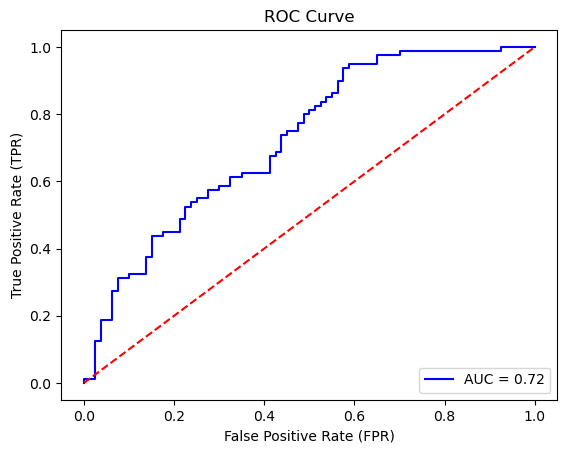

[iter: 6400]
train_ae_nl_src: 1.199367, train_ae_nl_tgt: 1.207721
train_discr: -0.051708, train_ae_by_discr: 0.023293
******************** source sample ********************
[original    ]: definitely worth it.
[generate_ori]: definitely worth it.
[generate_tst]: definitely worth it. 

[original    ]: the owners are very friendly and attentive.
[generate_ori]: the owners are very friendly and attentive.
[generate_tst]: the owners are very friendly and attentive. 

[original    ]: i've recommended many people to them and everyone is always happy.
[generate_ori]: i've recommended many people to them and everyone is always happy.
[generate_tst]: i've recommended many people to them and everyone is always happy. 

[original    ]: specially the house fried rice!
[generate_ori]: specially the house fried rice!
[generate_tst]: specially the house fried rice! 

******************** target sample ********************
[original    ]: everything was horrible.
[generate_ori]: everything was horrib

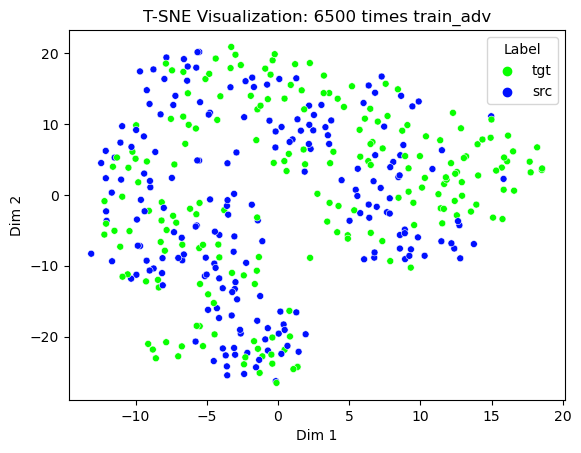

데이터 전체 개수: 160


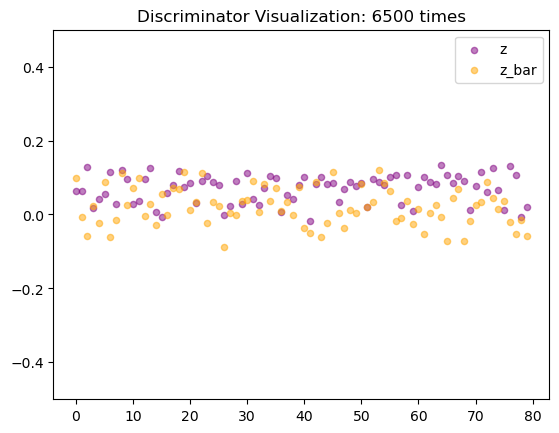

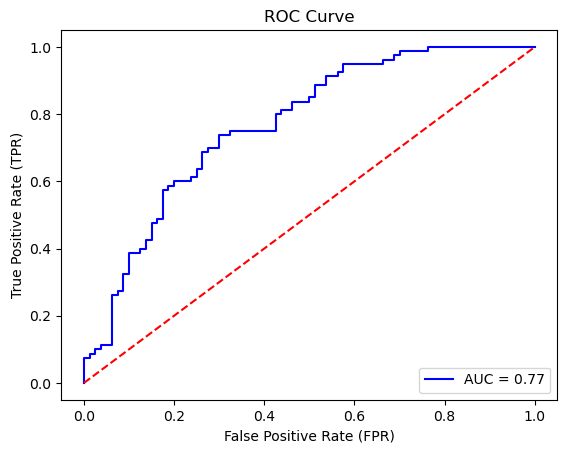

[iter: 6500]
train_ae_nl_src: 1.296666, train_ae_nl_tgt: 1.220604
train_discr: -0.007154, train_ae_by_discr: 0.057687
******************** source sample ********************
[original    ]: very delicious!
[generate_ori]: very delicious!
[generate_tst]: very delicious! 

[original    ]: they welcome you with open arms and are always there when your in need.
[generate_ori]: they welcome you with open arms and are always there when your in need.
[generate_tst]: they welcome you with open arms and are always there when your in need. 

[original    ]: our waitress was very nice, personable, and checked on us often!
[generate_ori]: our waitress was very nice, personable, and checked on us often!
[generate_tst]: our waitress was very nice, personable, and checked on us often! 

[original    ]: the place is nicely decorated, clean, and cozy.
[generate_ori]: the place is nicely decorated, clean, and cozy.
[generate_tst]: the place is nicely decorated, clean, and cozy. 

******************** ta

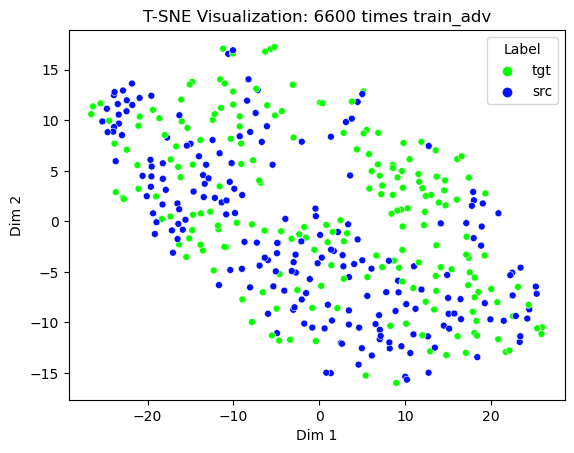

데이터 전체 개수: 160


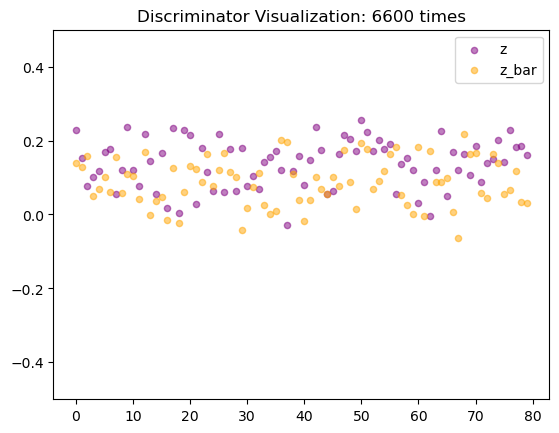

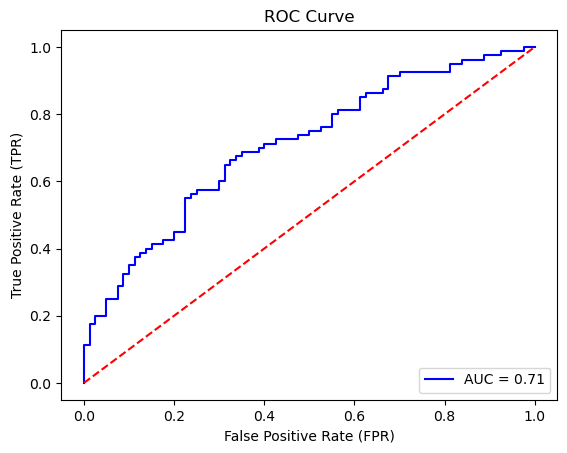

[iter: 6600]
train_ae_nl_src: 1.123015, train_ae_nl_tgt: 1.179932
train_discr: -0.061873, train_ae_by_discr: 0.062034
******************** source sample ********************
[original    ]: definately a place you can bring the family or just go for happy hour!
[generate_ori]: definately a place you can bring the family or just go for happy hour!
[generate_tst]: definately a place you can bring the family or just go for happy hour! 

[original    ]: great place fresh food and staff it's always friendly.
[generate_ori]: great place fresh food and staff it's always friendly.
[generate_tst]: great place fresh food and staff it's always friendly. 

[original    ]: this is what seems to be a family run and very authentic place.
[generate_ori]: this is what seems to be a family run and very authentic place.
[generate_tst]: this is what seems to be a family run and very authentic place. 

[original    ]: highly recommended.
[generate_ori]: highly recommended.
[generate_tst]: highly recommended

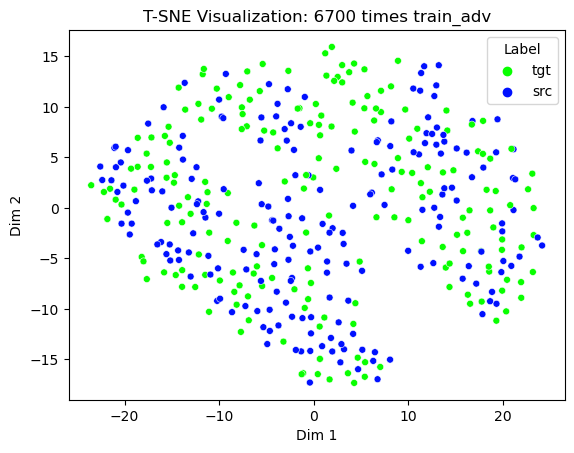

데이터 전체 개수: 160


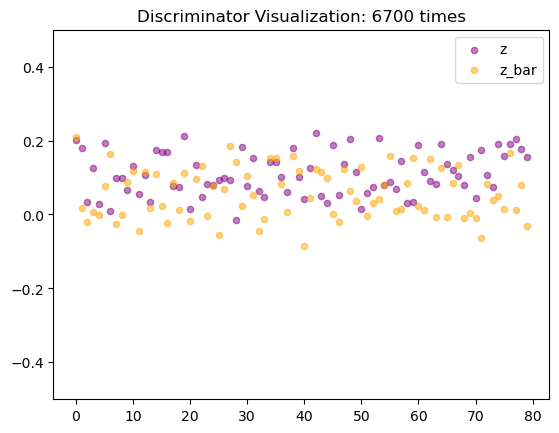

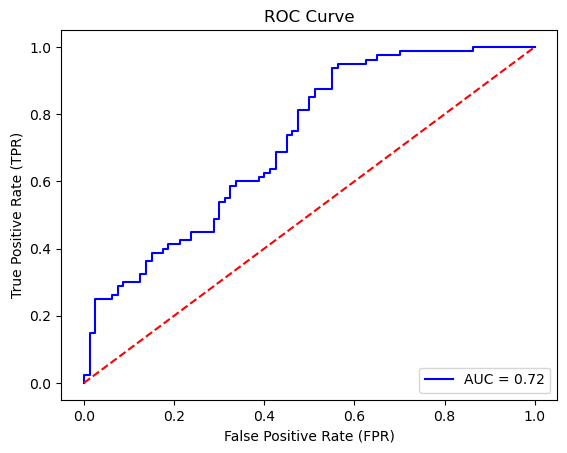

[iter: 6700]
train_ae_nl_src: 1.381483, train_ae_nl_tgt: 1.039029
train_discr: -0.048699, train_ae_by_discr: 0.022173
******************** source sample ********************
[original    ]: the place is also nice and clean.
[generate_ori]: the place is also nice and clean.
[generate_tst]: the place is also nice and clean. 

[original    ]: this particular location has excellent customer service.
[generate_ori]: this particular location has excellent customer service.
[generate_tst]: this particular location has excellent customer service. 

[original    ]: great local business, the food is always great.
[generate_ori]: great local business, the food is always great.
[generate_tst]: great local business, the food is always great. 

[original    ]: it was great.
[generate_ori]: it was great.
[generate_tst]: it was great. 

******************** target sample ********************
[original    ]: this gym is always dirty, and equipment is either broken or outdated.
[generate_ori]: this gym 

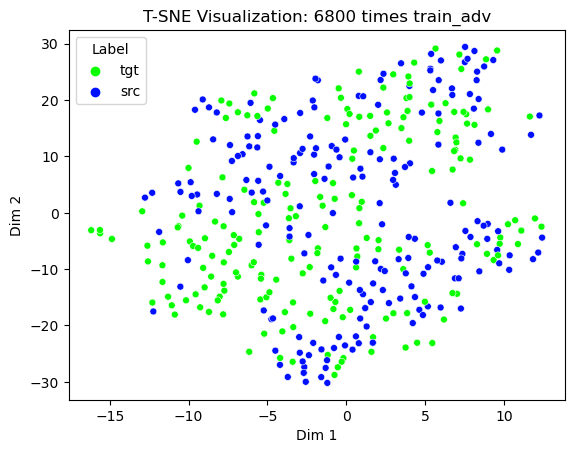

데이터 전체 개수: 160


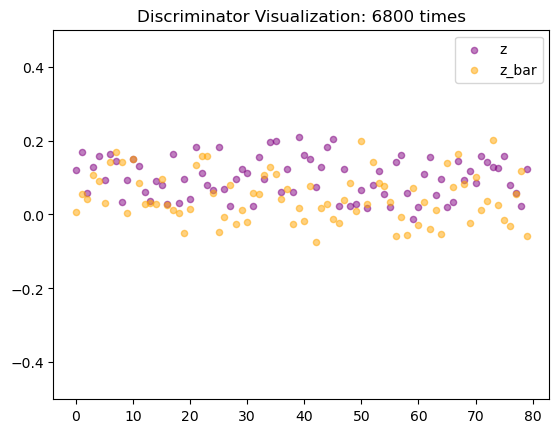

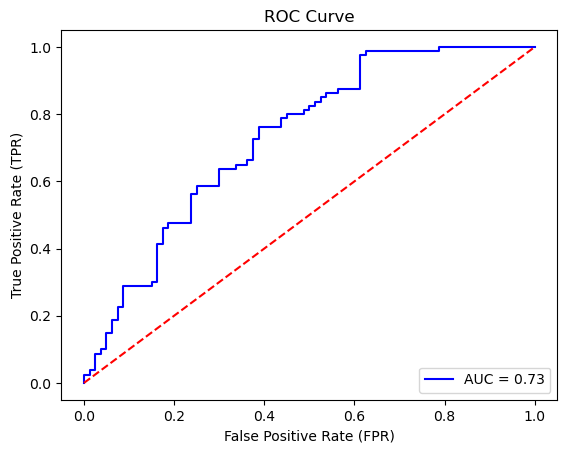

[iter: 6800]
train_ae_nl_src: 1.120333, train_ae_nl_tgt: 1.469346
train_discr: -0.060649, train_ae_by_discr: 0.042156
******************** source sample ********************
[original    ]: breakfast was good enough.
[generate_ori]: breakfast was good enough.
[generate_tst]: breakfast was good enough. 

[original    ]: best pediatrician in town!
[generate_ori]: best pediatrician in town!
[generate_tst]: best pediatrician in town! 

[original    ]: worship is awesome and followed by a great message.
[generate_ori]: worship is awesome and followed by a great message.
[generate_tst]: worship is awesome and followed by a great message. 

[original    ]: the best the desert has to offer.
[generate_ori]: the best the desert has to offer.
[generate_tst]: the best the desert has to offer. 

******************** target sample ********************
[original    ]: i would recommend not going to this place ever!
[generate_ori]: i would recommend not going to this place ever!
[generate_tst]: i woul

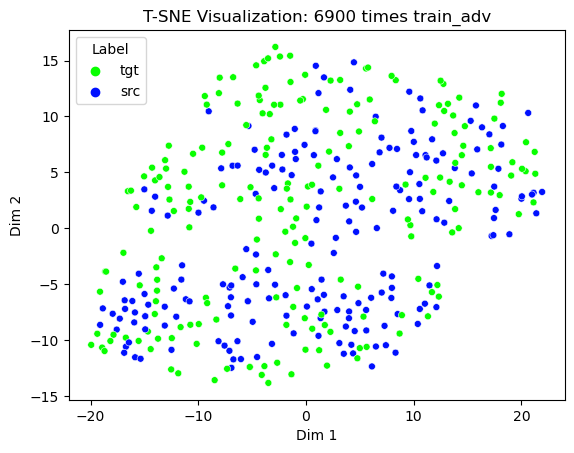

데이터 전체 개수: 160


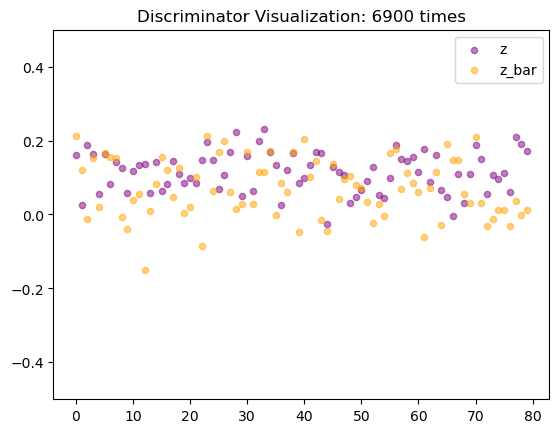

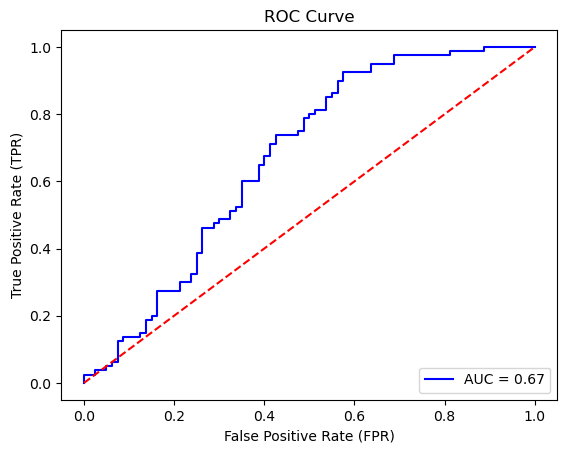

[iter: 6900]
train_ae_nl_src: 1.124730, train_ae_nl_tgt: 1.150751
train_discr: -0.052986, train_ae_by_discr: 0.041305
******************** source sample ********************
[original    ]: my husband and i love this place!
[generate_ori]: my husband and i love this place!
[generate_tst]: my husband and i love this place! 

[original    ]: the service was good and i left filling plump!
[generate_ori]: the service was good and i left filling plump!
[generate_tst]: the service was good and i left filling plump! 

[original    ]: we love tokyo express!
[generate_ori]: we love tokyo express!
[generate_tst]: we love tokyo express! 

[original    ]: the guys are very professional and nice.
[generate_ori]: the guys are very professional and nice.
[generate_tst]: the guys are very professional and nice. 

******************** target sample ********************
[original    ]: george is probably the only trustworthy employee in this whole entire complex.
[generate_ori]: george is probably the o

In [ ]:
train(args, dataloader_pos, dataloader_neg, dataloader_val_pos, dataloader_val_neg, autoencoder_src, autoencoder_tgt, discriminator,
                optim_ae_src, optim_ae_tgt, optim_dec_src, optim_dec_tgt, criterion_ae, criterion_con, criterion_clf, device, tokenizer)